In [1]:
import os
import sys
sys.path.append('/home/kevinteng/Desktop/DE_Project')
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import tensorflow as tf
from coord_conv import CoordConv
import cv2
import utils
import utils_vis
import utils_model
from sklearn.model_selection import train_test_split
from utils_vis import plot_comparison
from matplotlib.colors import LinearSegmentedColormap, BoundaryNorm
from random import randint, seed
from utils import stack4plot, similarity_multi, similarity_multiplication
from utils_vis import overlapMasks, overlapMasks02

/home/kevinteng/anaconda3/lib/python3.6/site-packages/tensorboard/compat/tensorflow_stub/dtypes.py:541: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/kevinteng/anaconda3/lib/python3.6/site-packages/tensorboard/compat/tensorflow_stub/dtypes.py:542: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/kevinteng/anaconda3/lib/python3.6/site-packages/tensorboard/compat/tensorflow_stub/dtypes.py:543: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/kevinteng/anaconda3/lib/python3.6/site-package

---------------------

# Retrieving and Preprocess Data

Image size:  100


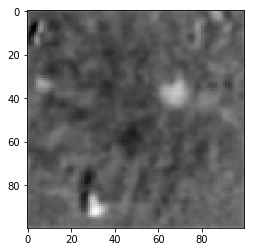

In [2]:
dataset = np.load('/home/kevinteng/Desktop/jpg_to_npy_benchmark/DG13_3-8-17_preprocessed_dF.npy')

#hyperparameter 
NEW_SIZE = 100
ver = 'fullSess04' #version no.
BATCH_SIZE = 8
lr01 = 0.00001 #learning rate for global 
lr02 = 0.000001 #learning rate for encoder 
lr03 = 0.1 #learning rate for learnable coords
n_neurons = 100
MAX_EPOCHS = 1000
l1_coeff = 0.1
thr = 0.3 #threshold for one hot pixel* sim score
dr = 0.4 #dropout rate
pre_pad_type = "SYMMETRIC"
path_desktop = '/home/kevinteng/Desktop/'
#re_list = dataset
re_list = utils.resize(dataset, NEW_SIZE)
IMG_SIZE = re_list.shape[1]

print('Image size: ', IMG_SIZE)
#Dimension for network should include the color channel 
re_list = np.expand_dims(re_list, axis = -1)
#Cast data type to float32 for TensorFlow
# re_list = re_list.astype('float32')
re_list = tf.convert_to_tensor(re_list, dtype = tf.float32)

for img in re_list:
    plt.imshow(np.reshape(img, (IMG_SIZE, IMG_SIZE)), cmap = 'gray')
    plt.show()   
    break
    

In [3]:
#apply min max norm for mean image
re_list = utils.min_max_norm(re_list)
#max_img_ori = np.expand_dims(max_img_ori, -1)
print('Max value:', np.max(re_list))
print('Min value:', np.min(re_list))


Max value: 1.0
Min value: 0.0


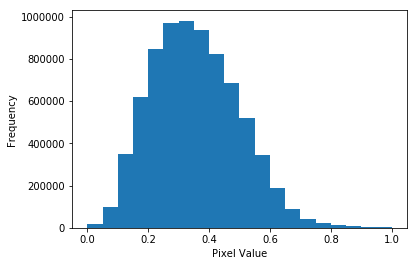

In [4]:
#plot historgram for min max norm image
plt.hist(tf.reshape(re_list, [-1]),20,[0,1])
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.show()

-----------------------------------

# Model

In [5]:
from tensorflow.keras import Model, Sequential
from tensorflow.keras.layers import Conv2D, Dense, Flatten, Reshape, MaxPooling2D, UpSampling2D
from tensorflow.keras.layers import InputLayer, Conv2DTranspose, Activation, BatchNormalization
from tensorflow.keras.layers import Input, Softmax, Dropout
from tensorflow.keras.regularizers import l1
from utils_model import conv_block, coordconv_block, up_block, up_coord_block
from tensorflow.keras import layers    
    
def encoder(inps, img_size):
    #activity_regularizer=l1(0.1)
    #conv block1
    paddings = tf.constant([[0, 0], [1, 1], [1, 1], [0, 0]])
    coord=tf.pad(inps, paddings, "SYMMETRIC")
    coord1 =CoordConv(x_dim = 102, y_dim = 102, with_r = False, 
                       filters = 128,strides=(1,1), kernel_size = 3, padding='valid')(coord)
    
    paddings1 = tf.constant([[0, 0], [1, 1], [1, 1], [0, 0]])    
    coord1=tf.pad(coord1, paddings1, "SYMMETRIC")
    conv1=Conv2D(32, kernel_size = 3,strides=(2,2), padding='valid',activation = 'relu',activity_regularizer=l1(0.1))(coord1)
    conv2=Conv2D(32, kernel_size = 3,strides=(2,2), padding='valid',activation = 'relu',activity_regularizer=l1(0.1))(coord1)
    pool1=tf.keras.layers.Concatenate()([conv1, conv2])
    drop01 = Dropout(0.4)(pool1)
    paddingsp = tf.constant([[0, 0], [1, 1], [1, 1], [0, 0]])    
    coordp=tf.pad(drop01, paddingsp, "SYMMETRIC")

    #conv block2
    conv3=Conv2D(32, kernel_size = 3,strides=(2,2), padding='valid',activation = 'relu',activity_regularizer=l1(0.1))(coordp)
    conv4=Conv2D(32, kernel_size = 3,strides=(2,2), padding='valid',activation = 'relu',activity_regularizer=l1(0.1))(coordp)
    pool2=tf.keras.layers.Concatenate()([conv3, conv4])
    drop02 = Dropout(0.4)(pool2)
    x=tf.keras.backend.resize_images(drop02, height_factor=2, width_factor=2, data_format="channels_last", interpolation='bilinear')
    paddings2 = tf.constant([[0, 0], [1, 1], [1, 1], [0, 0]])
    
    coord2=tf.pad(x, paddings2, "SYMMETRIC")
    coord2 = Conv2D(32, 3, padding = 'valid', activation = 'relu',activity_regularizer=l1(0.1))(coord2)
    #coord2 = Conv2D(32, 3, padding = 'valid', activation = 'relu')(coord2)
    coord2=tf.keras.backend.resize_images(x, height_factor=2, width_factor=2, data_format="channels_last", interpolation='bilinear')
    paddings3 = tf.constant([[0, 0], [1, 1], [1, 1], [0, 0]])
    coord3=tf.pad(coord2, paddings3, "SYMMETRIC")
    x3 = Conv2D(16, 3, padding = 'valid', activation = 'relu',activity_regularizer=l1(0.1))(coord3)
    paddings4 = tf.constant([[0, 0], [1, 1], [1, 1], [0, 0]])
    coord4=tf.pad(x3, paddings4, "SYMMETRIC")
    output = Conv2D(1, 3, padding = 'valid', activation = 'sigmoid',activity_regularizer=l1(0.1))(coord4)
    return output




def de_conv(input_tensor):
    coord01 = CoordConv(x_dim = 100, y_dim = 100, with_r = False, filters = 100,
              kernel_size = 1, padding='same', activation='relu')(input_tensor)
    conv01 = Conv2D(filters = 50, kernel_size = 1, strides = 1, padding = "same", activation = 'relu')(coord01)
    conv02 = Conv2D(filters = 50, kernel_size = 1, strides = 1, padding = "same", activation = 'relu')(conv01)
    conv03 = Conv2D(filters = 100, kernel_size = 1, strides = 1, padding = "same", activation = 'relu')(conv02)
    conv04 = Conv2D(filters = 100, kernel_size = 1, strides = 1, padding = "same", activation = 'relu')(conv03)
    conv05 = Conv2D(filters = 1, kernel_size = 1, strides = 1, padding = "same" )(conv04)
    f1 = Flatten()(conv05)
    output = Softmax(axis = -1)(f1)

    return output

def de_conv02(input_tensor):
    coord01 = CoordConv(x_dim = 100, y_dim = 100, with_r = False, filters = 100,
              kernel_size = 1, padding='same', activation='relu')(input_tensor)
    conv01 = Conv2D(filters = 1, kernel_size = 1, strides = 1, padding = "same" )(coord01)
    f1 = Flatten()(conv01)
    output = Softmax(axis = -1)(f1)
    return output

def latent_space(encoded_imgs, deconv_imgs, coords, batch_size, img_size):
    '''
    This function construct the dot product of the output of an encoder(batch_size, img_size, img_size, 1) 
    with the one hot images generated by decoord-conv(n_neurons, img_size, img_size, 1), which yields
    similarity score (batch_size, n_neurons). Similarity score is then concatenate to the last layer of the 
    input coordinates with the corresponding batch (batch_size, n_neurons, 3)
    
    @encoded_imgs: output images from the encoder
    @deconv_imgs: one hot images generated from the coordinate list 
    @coords: A list of coordinates generated randomly based on the number of neurons
    @batch_size: Batch size of the input image for encoder, to allocate size for writing in loop
    
    return: 
        latent space with dim (batch_size, n_neurons, 3, 1)
    '''
    similarity_score = tf.tensordot(encoded_imgs, deconv_imgs, [[1,2,3],[1,2,3]]) #(batch_size, n_neurons)
#     squeeze_coords = tf.squeeze(coords/(img_size-1)) #coords dim (n_neurons, 1, 1, 2) = > (n_neurons, 2)
    squeeze_coords = tf.squeeze(coords)
    latent = tf.TensorArray(tf.float32, size=0, dynamic_size=True)
    for i in tf.range(batch_size):
        concat = tf.stack((squeeze_coords[:,-2], squeeze_coords[:,-1], similarity_score[i]), axis=-1)    
        latent = latent.write(i, concat) #(batch_size, n_neurons, 3)
    return tf.expand_dims(latent.stack(), axis = -1), similarity_score

def duplicate_batch(inp_img, batch_size):
    '''
    This function duplicate an image with respect to its batch size
    @param inp_img: input image to be duplicated
    @param batch_size: batch size, which is the number of image to be duplicated

    return duplicated images along axis 0, (batch_size, img_size, img_size, 1)
    '''
    inp_img = tf.expand_dims(inp_img, 0)
    m2 = tf.constant([batch_size, 1, 1, 1], tf.int32)  # multiplier for tiling
    duplicate_imgs = tf.tile(inp_img, m2)
    return tf.cast(duplicate_imgs, dtype = tf.float32)

def decoder(latent_dim):
    flat_01 = Flatten()(latent_dim)
    dense_01 = Dense(25*25*32, activation = 'relu')(flat_01)
    dense_01 = Reshape((25,25,32))(dense_01)
    up_01 = up_coord_block(dense_01, up_size = 2, x_dim = 50, y_dim = 50, filters = 64, 
                           kernel_size = 3, strides = 1, padding = 'same', activation = 'relu')
    up_02 = up_block(up_01, up_size = 2, filters = 32, kernel_size = 3,
                            strides = 1, padding = 'same', activation = 'relu')
    output = Conv2D(filters = 1, kernel_size = 3, strides = 1,
                    padding = 'same', activation = None)(up_02)
    return output

class learnable_coords(layers.Layer):
    def __init__(self, coords):
        super(learnable_coords, self).__init__()
        self.learned_coords = tf.Variable((coords), trainable = True)

    def __call__(self, img_size):
        y = self.learned_coords/(img_size-1) #normalize the coordinates
        #clip values so that the values doesnt runs out of the normalized pixel space 
        y = tf.clip_by_value(y, clip_value_min=0.0, clip_value_max=1.0) 
        return y
    
def gaussian_blur(img, kernel_size=3, sigma=0.01):
    def gauss_kernel(channels, kernel_size, sigma):
        ax = tf.range(-kernel_size // 2 + 1.0, kernel_size // 2 + 1.0)
        xx, yy = tf.meshgrid(ax, ax)
        kernel = tf.exp(-(xx ** 2 + yy ** 2) / (2.0 * sigma ** 2))
        kernel = kernel / tf.reduce_sum(kernel)
        kernel = tf.tile(kernel[..., tf.newaxis], [1, 1, channels])
        return kernel

    gaussian_kernel = gauss_kernel(tf.shape(img)[-1], kernel_size, sigma)
    gaussian_kernel = gaussian_kernel[..., tf.newaxis]

    return tf.nn.depthwise_conv2d(img, gaussian_kernel, [1, 1, 1, 1],
                                  padding='SAME', data_format='NHWC')

-----------------------------------------------------------------

# Visualization

In [6]:
# coords list for every 100 epochs (max_epochs/100, n_neurons, 1, 1, 2)
coords_list_npy = np.load(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'coords_list', ver)) 
# encoder output first batch for every 100 epochs (max_epochs/100, 8, 100, 100, 1)
encoded_imgs_npy = np.load(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'encoded_imgs', ver))
# input image first batch for every 100 epochs (max_epochs/100, 8, 100, 100, 1)
input_imgs_npy = np.load(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'input_imgs', ver))
# global loss for every epochs
loss_list_global_npy = np.load(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'loss_list_global', ver))
#similarity loss for every epochs
loss_list_encoded_one_hot_npy = np.load(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'loss_list_encoded_one_hot', ver))
# one hot images first batch for every 100 epochs  (max_epochs/100, n_neurons, 100, 100, 1)
one_hot_imgs_list_npy = np.load(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'one_hot_imgs_list', ver))
# reconstructed images first batch for every 100 epochs (max_epochs/100, 8, 100, 100, 1)
reconstructed_imgs_npy = np.load(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'reconstructed_imgs', ver))
# similarity batch for every 100 epochs (max_epochs/100, 8, n_neurons)
similarity_list_npy = np.load(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'similarity_list', ver))
#original coords list (n_neurons, 1, 1, 2)
ori_coords_npy = np.load(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'ori_coords', ver))
#original one hot image (n_neurons, 100, 100, 1)
ori_one_hot_imgs_npy = np.load(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'ori_one_hot_imgs', ver))

In [7]:
#load roi mask
roi_img = np.load('/home/kevinteng/Desktop/Manual_annotation/DG-13-3-8-17_ROImask.npy')
roi_img = cv2.resize(roi_img, (100, 100))
# plt.imshow(roi_img, cmap = 'gray')

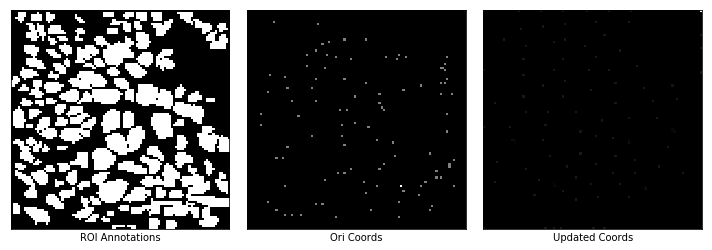

In [8]:
#comparison of roi and one hot images 
captions_03 = ['ROI Annotations', 'Ori Coords', 'Updated Coords']
img_row03 = [roi_img, stack4plot(ori_one_hot_imgs_npy), stack4plot(one_hot_imgs_list_npy[-1])]
plot_comparison(img_row03, captions_03, n_col=len(img_row03), figsize = (10, 10))

Mean value:  0.01
Counts:  94


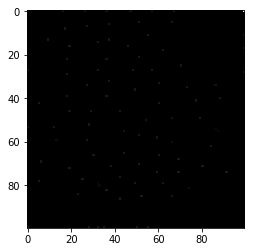

In [9]:
sum_updated_coords = stack4plot(one_hot_imgs_list_npy[-1])
print("Mean value: ", np.mean(sum_updated_coords))
updated_coords_img = np.where(sum_updated_coords<thr, 0, sum_updated_coords) 
activations_count = np.count_nonzero(updated_coords_img!=0)
print("Counts: ", activations_count)
plt.imshow(updated_coords_img, cmap = 'gray')

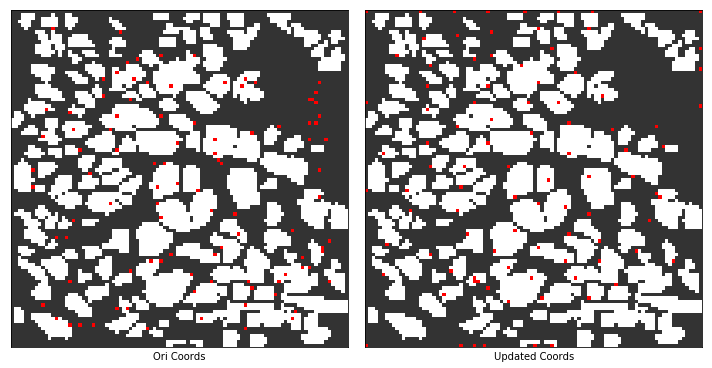

In [10]:
#define color
col = [(0.2, 0.2, 0.2),(1,1,1),(1,0,0)] 
cm = LinearSegmentedColormap.from_list('mylist', col, 3)  
#     #Bins for cmap
bounds=[0,1,5,10]
norm = BoundaryNorm(bounds, cm.N)
#overlap mask with original coordinates 
roi_ori_mask = overlapMasks02(roi_img, stack4plot(ori_one_hot_imgs_npy))

#overlap mask with updated coordinates 
roi_updated_mask = overlapMasks02(roi_img, updated_coords_img)

captions_04 = ['Ori Coords', 'Updated Coords']
img_row04 = [roi_ori_mask, roi_updated_mask]
plot_comparison(img_row04, captions_04, n_col=len(img_row04), figsize = (10, 10), cmap = cm, norm = norm)

In [11]:
#confusion matrix 
confMatrix = utils_model.getConfusionMatrix(roi_img, updated_coords_img)

print("True Positives: ", confMatrix[0])
print("True Negatives: ", confMatrix[1])
print("False Positive Ratio: ", confMatrix[2])
print("False Negatives Ratio: ", confMatrix[3])
print("F1 score: ", utils_model.f1score(confMatrix))

True Positives:  0.4574468085106383
True Negatives:  0.5425531914893617
False Positive Ratio:  0.4182313749242883
False Negatives Ratio:  0.5817686250757117
F1 score:  0.48776683820346695


---

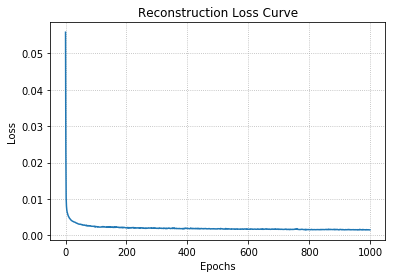

In [12]:
#plot loss
xlabel = 'Epochs'
ylabel = 'Loss'
title = 'Reconstruction Loss Curve'
utils_vis.plot_loss(loss_list_global_npy, xlabel, ylabel, title)

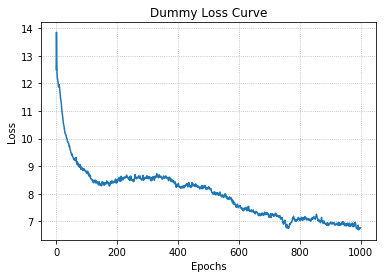

In [13]:
#plot loss
xlabel = 'Epochs'
ylabel = 'Loss'
title = 'Dummy Loss Curve'
utils_vis.plot_loss(loss_list_encoded_one_hot_npy, xlabel, ylabel, title)

---

# Visualization Per-frame

In [14]:

def multi_similarity_frame(one_hot_imgs_last_list_npy, similarity_score_last_list_npy, img_size, batch_size):
    '''
    Multiply similarity scores for every one hot pixel images and aggregate the one hot images into
    single frames
    
    @param one_hot_imgs_last_list_npy: .npy array of one hot images for the last epochs 
    @param similarity_score_last_list_npy: .npy array of similarity score for the last epochs
    @param img_size: image size
    @param batch_size: batch size
    
    return 
    tensor of one hot images multiplied with similarity scores for each images 
    '''
    count = 0
    onehot_list = []
    for one_hot in np.squeeze(one_hot_imgs_last_list_npy):
        if count!=len(similarity_score_last_list_npy): 
            for idx in range(count,count+batch_size): #loop through the similarity score for every batch_size increment
                sum_multi = np.zeros((img_size, img_size))
                for n in range(len(one_hot)): #n_neurons
                    multi = similarity_score_last_list_npy[idx, n]*one_hot[n]
                    sum_multi+=multi #sum all the one hot images
                onehot_list.append(sum_multi)
        count+=batch_size
        tensor = tf.convert_to_tensor(onehot_list, tf.float32)
    
    return tensor

---

# Validation 

In [15]:
#build encoder 
inps = Input(shape=(IMG_SIZE, IMG_SIZE, 1))
encoder_model = Model(inps, encoder(inps, IMG_SIZE))
encoder_model.load_weights("model_weights/encoder_model_{}.h5".format(ver))
#build coord model
inp = Input(shape=(100, 100,2)) #(batch_size, img_size, img_size, 2)
de_coordconv = Model(inp, de_conv(inp))
de_coordconv.load_weights("best_class_model100_02.hdf5")

#decoder
latent_dim = Input(shape=(n_neurons, 3, 1))
decoder_model = Model(latent_dim, decoder(latent_dim))
decoder_model.load_weights("model_weights/decoder_model_{}.h5".format(ver))

#learnable coords
l_coords = learnable_coords(tf.convert_to_tensor(ori_coords_npy))

In [16]:
# #concat latent space as input
# squeeze_coords = np.squeeze(coords_list_npy[-1]) #use the last pos
# similarity_score = similarity_list_npy[-1]


# concat = tf.stack((squeeze_coords[:,-2], squeeze_coords[:,-1], similarity_score[0]), axis=-1)
# concat_ex = concat[np.newaxis,:,:,np.newaxis] #extand axis=0 and axis=-1 for input into model
# # print(concat_ex.shape)

In [17]:
mse = tf.losses.MeanSquaredError()
bxent = tf.keras.losses.BinaryCrossentropy()
opt_coords = tf.keras.optimizers.Adam(0.1)
ori_one_hot_imgs = tf.convert_to_tensor(ori_one_hot_imgs_npy)

@tf.function
def val_fn(inp_imgs, img_size, batch_size, neuron_multi = False, one_hot_thr = False):
    with tf.GradientTape() as tape:
        #--RHS pipeline (Learnable Coords)--
        #custom layer for updating coordinates
        updated_coords = l_coords(img_size)
        m1 = tf.constant([1,img_size,img_size,1], tf.int32) #multiplier for tiling 
        #tile coordinates (n_neurons, img_size, img_size, 1)
        tile_cd = tf.tile(updated_coords, m1)
        #de-coordconv model
    #     de_coordconv.trainable = False #freeze de-coordconv
        #one hot images depending on the learnable coordinates
        one_hot_imgs = tf.reshape(de_coordconv(tile_cd),[-1,img_size, img_size, 1]) #(n_neurons, img_size, img_size, 1)
        #one hot images depending on the dummy coordinates 
        dummy_one_hot = ori_one_hot_imgs
        #--LHS pipeline (Encoder Pipeline)--
        #output from encoder (batch_size, img_size, img_size, 1)
    #         gaussian_blurr_input_images=gaussian_blur(inp_imgs)
        encoder_output = encoder_model(inp_imgs)

        #--Bottle Neck--
        #latent space
        latent, similarity_score = latent_space(encoder_output, one_hot_imgs, updated_coords, batch_size, img_size)#(batch_size, n_neurons, 3, 1)
        #compute the mse between the neurons with the one hot images generated by the deconv
        if neuron_multi==False:
            #sum one hot images for all neurons, (n_neurons, img_size, img_size, 1) => (img_size, img_size, 1)
            one_hot_sum = tf.math.reduce_sum(one_hot_imgs, 0)
            dummy_sum = tf.math.reduce_sum(dummy_one_hot, 0)
            #duplicate summed one_hot_images and compare with encoded output 
            #(img_size, img_size, 1) => (batch_size, img_size, img_size, 1) 
            duplicated_one_hot = duplicate_batch(one_hot_sum, batch_size)
            duplicated_dummy = duplicate_batch(dummy_sum, batch_size)
            #loss between the encoded output and the one hot images 
            encoded_one_loss = bxent(encoder_output, duplicated_one_hot)
            #loss between the encoded output and the dummy one hot images
            encoded_dummy = bxent(encoder_output, duplicated_dummy)
        #compute the mse between the neurons with one hot images multiplied by similarity scores
        elif neuron_multi==True:
            #with thresholding 
            if one_hot_thr==True:
                #multiply similarity scores with one hot images
                #(batch_size, img_size, img_size, 1)
                similarity_multi_threshold = similarity_multi(one_hot_imgs, similarity_score, thr)
                similarity_multi_threshold_dummy = similarity_multi(dummy_one_hot, similarity_score, thr)
                #loss between the encoded output and the one hot images 
                encoded_one_loss = bxent(encoder_output, similarity_multi_threshold)
                #loss between encoded outptu and the dummy one hot images
                encoded_dummy = bxent(encoder_output, similarity_multi_threshold_dummy)
            #without thresholding
            elif one_hot_thr==False: 
                similarity_multi_reduced_neurons = similarity_multi(one_hot_imgs, similarity_score)
                similarity_multi_reduced_dummy = similarity_multi(dummy_one_hot, similarity_score)
                #loss between the encoded output and the one hot images 
                encoded_one_loss = bxent(encoder_output, similarity_multi_reduced_neurons)
                #loss between encoded outptu and the dummy one hot images
                encoded_dummy = bxent(encoder_output, similarity_multi_reduced_dummy)

        #--Decoder--
        #reconstruction 
        reconstruction = decoder_model(latent)  
        #--Loss--
        #the loss that backprop through the whole pipeline 
        global_loss = mse(inp_imgs, reconstruction)
        #regularizer loss
        regularizer_loss = tf.math.reduce_sum(encoder_model.losses)
        #total global loss => global_loss + regularizer loss
        total_loss = global_loss + regularizer_loss
        #append loss 
        loss = [global_loss, encoded_dummy, regularizer_loss, total_loss]
            
    #back prop through the learnable coords
    grad_coords = tape.gradient(global_loss, l_coords.trainable_variables)
    opt_coords.apply_gradients(zip(grad_coords, l_coords.trainable_variables))

    return loss, updated_coords, one_hot_imgs, encoder_output, similarity_score, reconstruction

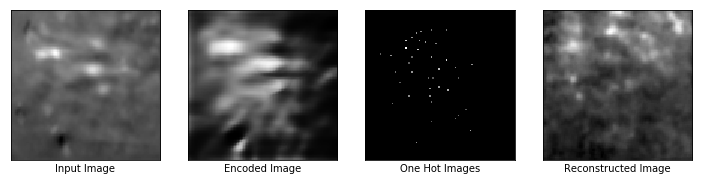

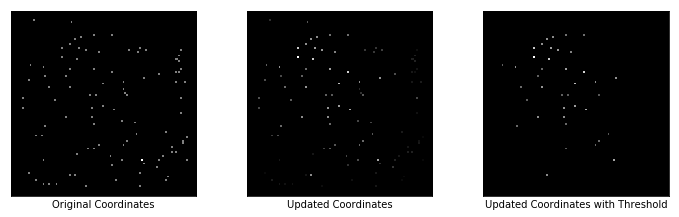

Reconstruction Loss: 0.016975870355963707
Regularizer Loss: 448449.0625, Total Loss: 448449.09375
Encoder Loss: 4.789603233337402
Max Similarity scores: 0.88237464427948
Updated Coordinates: [[[0.53535354 0.7878788 ]]]



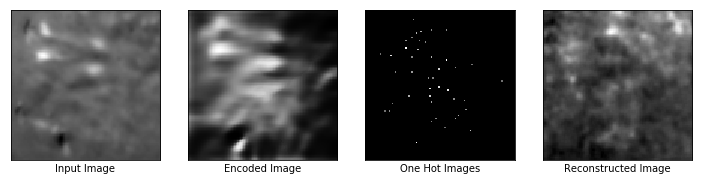

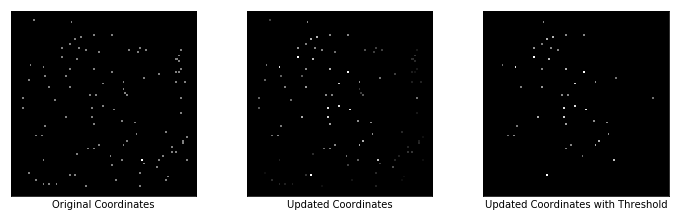

Reconstruction Loss: 0.01467947382479906
Regularizer Loss: 440098.34375, Total Loss: 440098.34375
Encoder Loss: 4.455468654632568
Max Similarity scores: 0.6953831911087036
Updated Coordinates: [[[0.53569615 0.7874056 ]]]



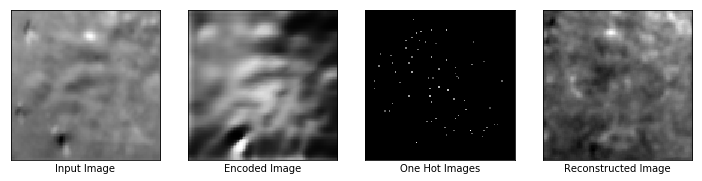

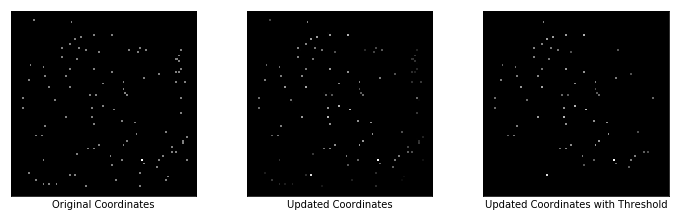

Reconstruction Loss: 0.015633761882781982
Regularizer Loss: 448461.0625, Total Loss: 448461.09375
Encoder Loss: 6.514768600463867
Max Similarity scores: 0.874955952167511
Updated Coordinates: [[[0.53606886 0.78689736]]]



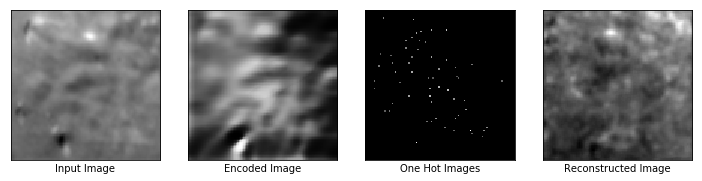

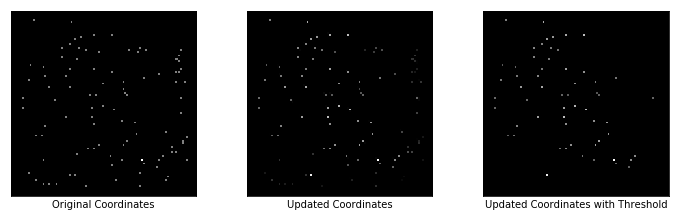

Reconstruction Loss: 0.015245607122778893
Regularizer Loss: 446378.8125, Total Loss: 446378.8125
Encoder Loss: 5.192515850067139
Max Similarity scores: 0.8452833294868469
Updated Coordinates: [[[0.5365555 0.7862722]]]



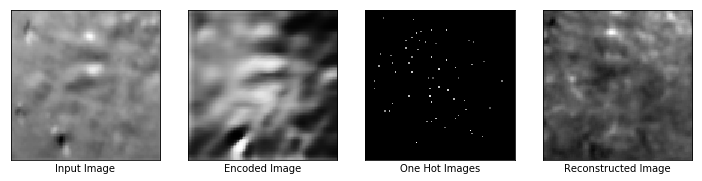

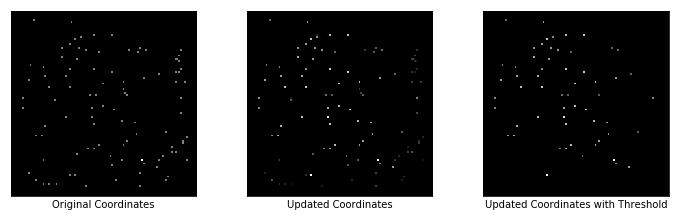

Reconstruction Loss: 0.017544804140925407
Regularizer Loss: 445265.03125, Total Loss: 445265.0625
Encoder Loss: 5.150035858154297
Max Similarity scores: 0.892534077167511
Updated Coordinates: [[[0.5368667  0.78565943]]]



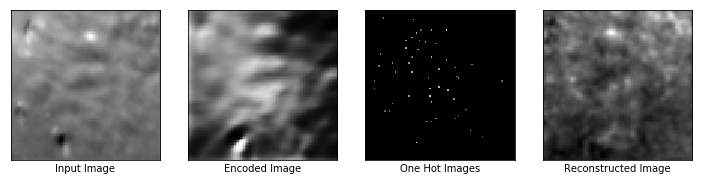

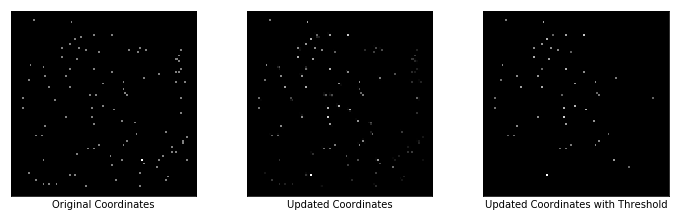

Reconstruction Loss: 0.014999885112047195
Regularizer Loss: 446285.125, Total Loss: 446285.125
Encoder Loss: 5.615760803222656
Max Similarity scores: 0.8722192645072937
Updated Coordinates: [[[0.5368179 0.7855696]]]



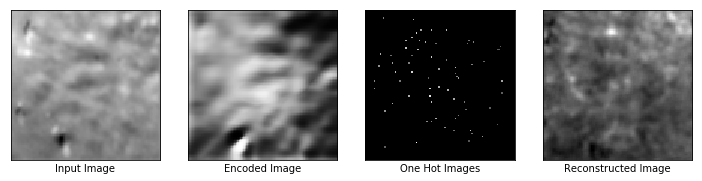

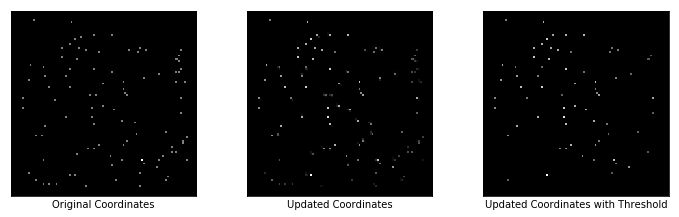

Reconstruction Loss: 0.017729392275214195
Regularizer Loss: 452146.375, Total Loss: 452146.40625
Encoder Loss: 7.055151462554932
Max Similarity scores: 0.9363358020782471
Updated Coordinates: [[[0.5365055 0.7857534]]]



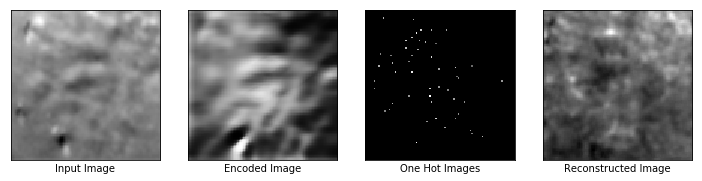

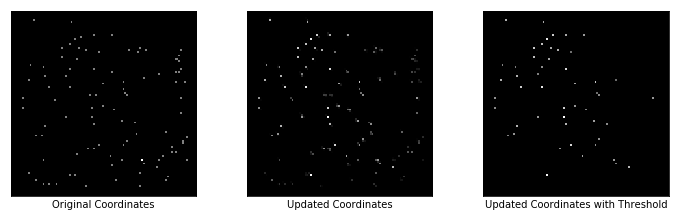

Reconstruction Loss: 0.018440021201968193
Regularizer Loss: 453750.9375, Total Loss: 453750.96875
Encoder Loss: 7.322404861450195
Max Similarity scores: 0.8101045489311218
Updated Coordinates: [[[0.5361634 0.78589  ]]]



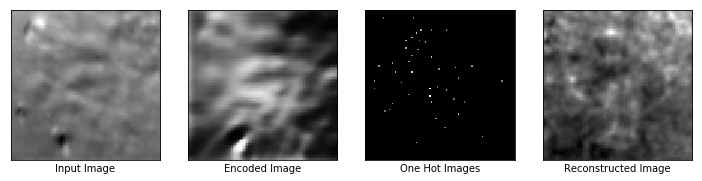

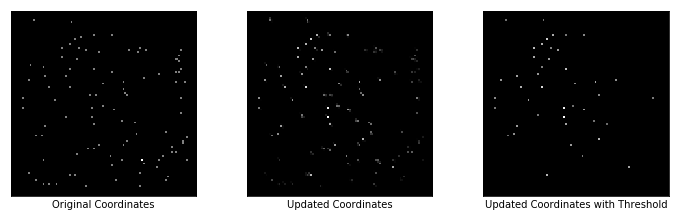

Reconstruction Loss: 0.012641861103475094
Regularizer Loss: 444863.625, Total Loss: 444863.625
Encoder Loss: 5.098841190338135
Max Similarity scores: 0.7890201807022095
Updated Coordinates: [[[0.5359536 0.7858109]]]



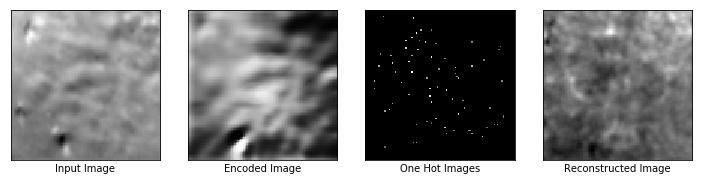

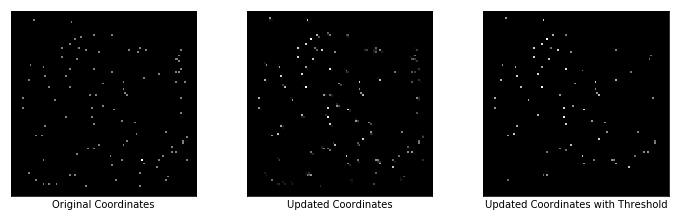

Reconstruction Loss: 0.01580916717648506
Regularizer Loss: 450725.375, Total Loss: 450725.40625
Encoder Loss: 7.128804683685303
Max Similarity scores: 0.8559731841087341
Updated Coordinates: [[[0.53601515 0.7855745 ]]]



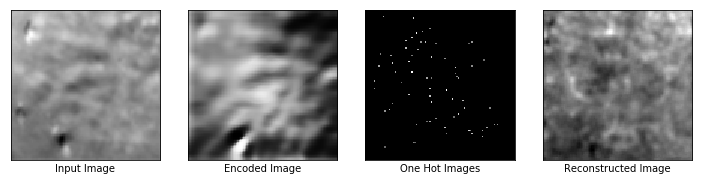

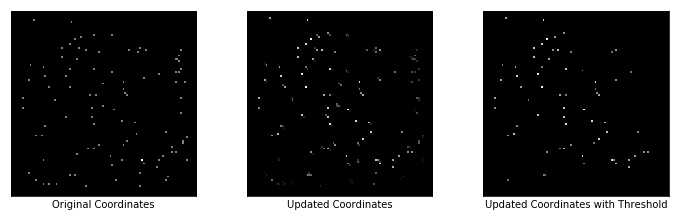

Reconstruction Loss: 0.01464136689901352
Regularizer Loss: 450545.46875, Total Loss: 450545.46875
Encoder Loss: 7.146523475646973
Max Similarity scores: 0.8378322124481201
Updated Coordinates: [[[0.5360041  0.78529525]]]



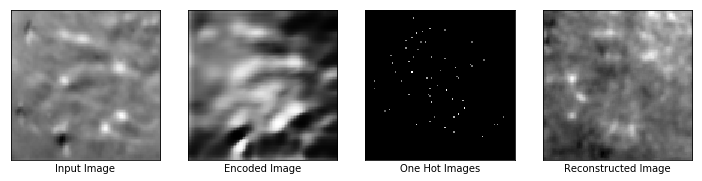

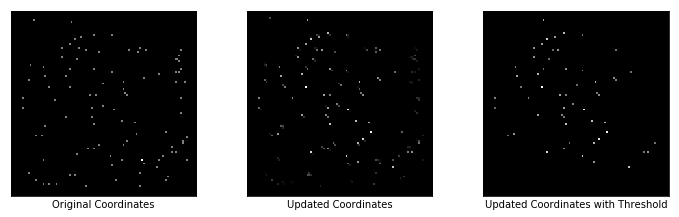

Reconstruction Loss: 0.016932103782892227
Regularizer Loss: 445924.65625, Total Loss: 445924.6875
Encoder Loss: 5.96469783782959
Max Similarity scores: 0.8314152956008911
Updated Coordinates: [[[0.5359078  0.78504205]]]



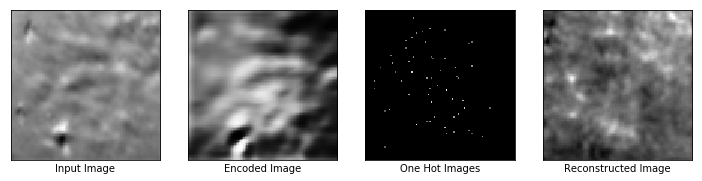

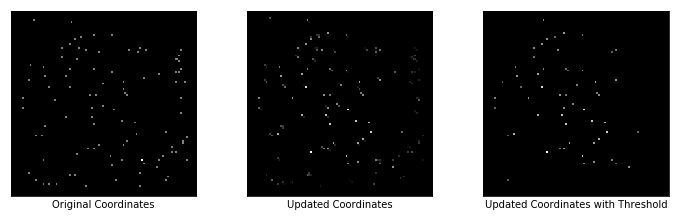

Reconstruction Loss: 0.014931103214621544
Regularizer Loss: 449226.6875, Total Loss: 449226.6875
Encoder Loss: 6.76572322845459
Max Similarity scores: 0.878721296787262
Updated Coordinates: [[[0.5357903 0.7847511]]]



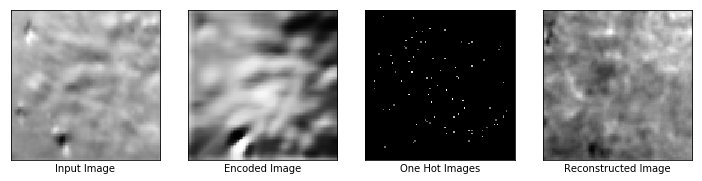

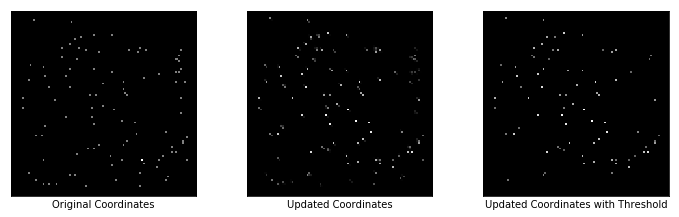

Reconstruction Loss: 0.015712562948465347
Regularizer Loss: 454020.5, Total Loss: 454020.53125
Encoder Loss: 8.06816291809082
Max Similarity scores: 0.910186767578125
Updated Coordinates: [[[0.5356643 0.7844104]]]



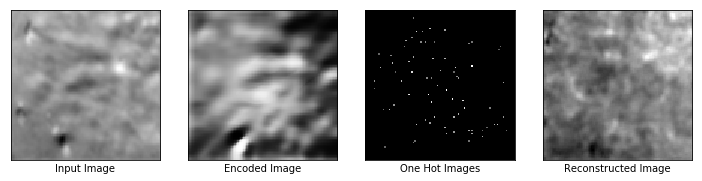

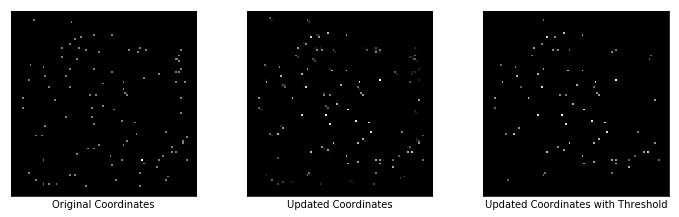

Reconstruction Loss: 0.012072959914803505
Regularizer Loss: 445028.53125, Total Loss: 445028.53125
Encoder Loss: 5.797524929046631
Max Similarity scores: 0.8551414608955383
Updated Coordinates: [[[0.5355289 0.7840293]]]



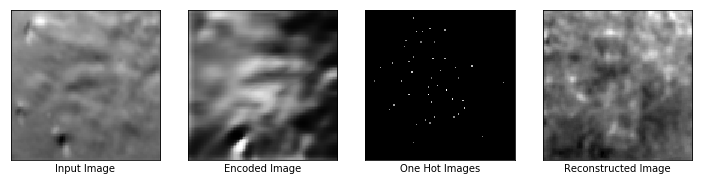

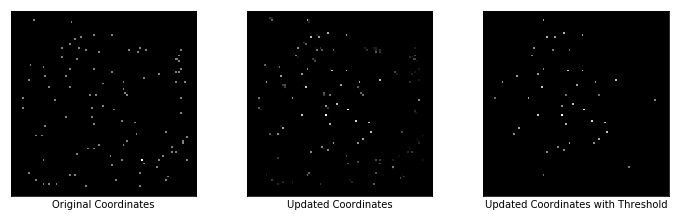

Reconstruction Loss: 0.012289670296013355
Regularizer Loss: 448423.9375, Total Loss: 448423.9375
Encoder Loss: 6.038116931915283
Max Similarity scores: 0.7643306255340576
Updated Coordinates: [[[0.5355758 0.7834849]]]



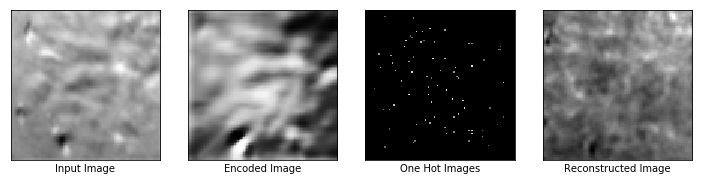

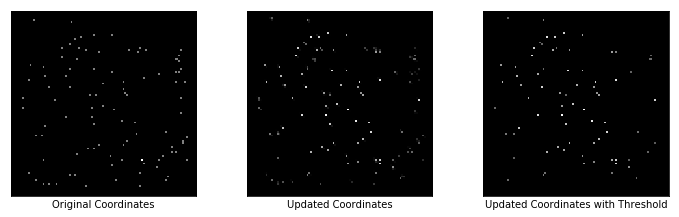

Reconstruction Loss: 0.013574184849858284
Regularizer Loss: 447871.75, Total Loss: 447871.75
Encoder Loss: 5.8562517166137695
Max Similarity scores: 0.885267436504364
Updated Coordinates: [[[0.5351529 0.7837541]]]



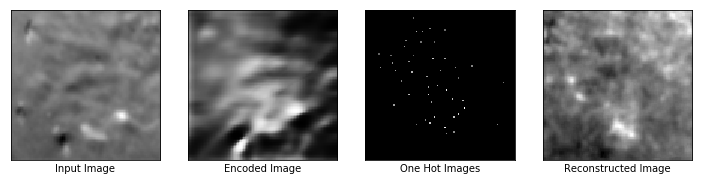

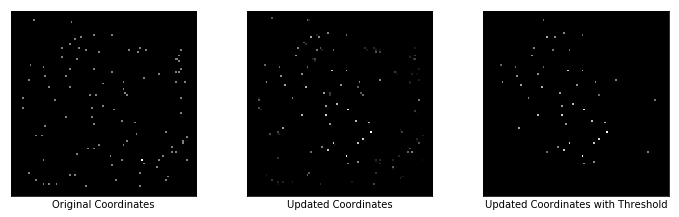

Reconstruction Loss: 0.012933081015944481
Regularizer Loss: 448922.53125, Total Loss: 448922.53125
Encoder Loss: 6.889118671417236
Max Similarity scores: 0.795054018497467
Updated Coordinates: [[[0.53469956 0.78405505]]]



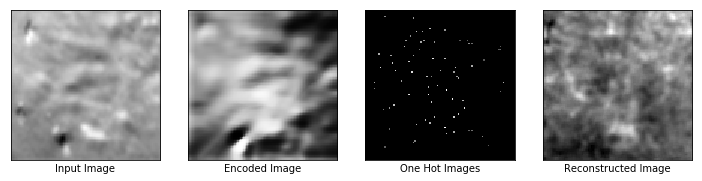

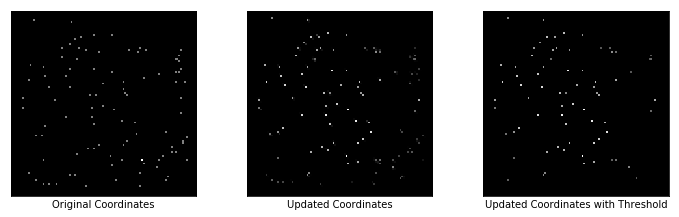

Reconstruction Loss: 0.013858484104275703
Regularizer Loss: 451762.0, Total Loss: 451762.0
Encoder Loss: 7.311331272125244
Max Similarity scores: 0.9431361556053162
Updated Coordinates: [[[0.53427225 0.78429806]]]



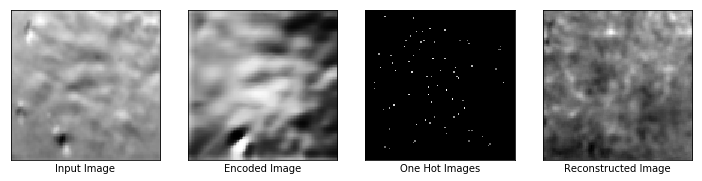

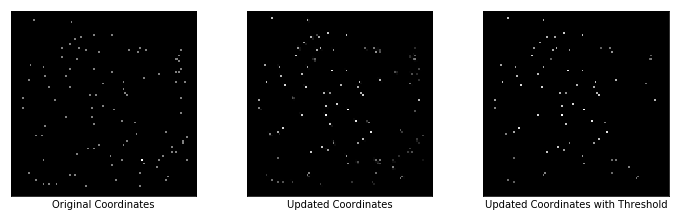

Reconstruction Loss: 0.0124802952632308
Regularizer Loss: 450025.8125, Total Loss: 450025.8125
Encoder Loss: 6.791915416717529
Max Similarity scores: 0.9299753904342651
Updated Coordinates: [[[0.5338686  0.78449464]]]



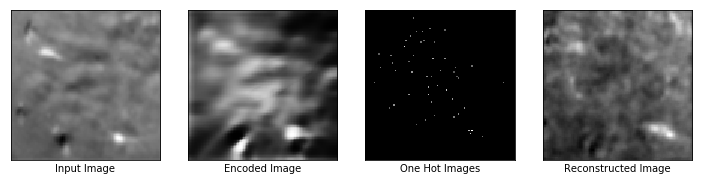

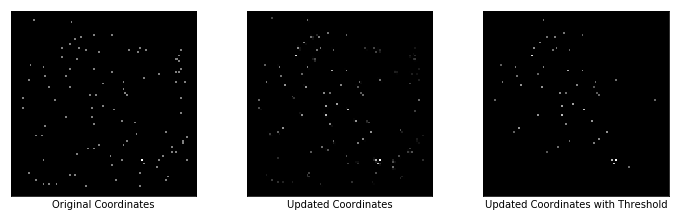

Reconstruction Loss: 0.011091302148997784
Regularizer Loss: 444187.1875, Total Loss: 444187.1875
Encoder Loss: 5.335622787475586
Max Similarity scores: 0.9369940161705017
Updated Coordinates: [[[0.53350663 0.78467554]]]



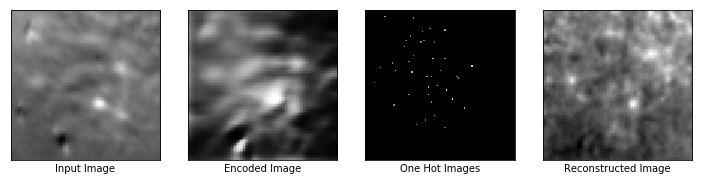

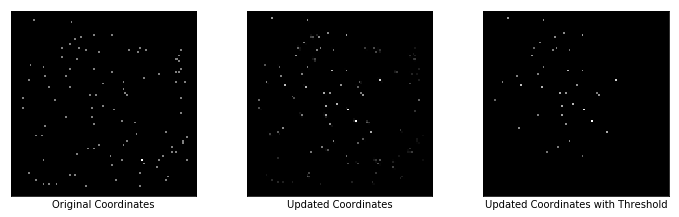

Reconstruction Loss: 0.010549796745181084
Regularizer Loss: 447052.09375, Total Loss: 447052.09375
Encoder Loss: 5.794073104858398
Max Similarity scores: 0.9564051628112793
Updated Coordinates: [[[0.5331975  0.78484327]]]



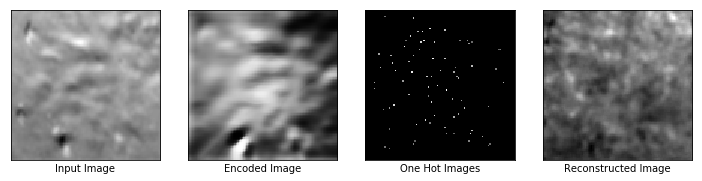

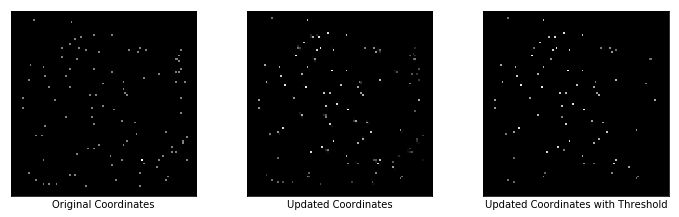

Reconstruction Loss: 0.012847683392465115
Regularizer Loss: 450697.375, Total Loss: 450697.375
Encoder Loss: 6.835560321807861
Max Similarity scores: 0.8646470308303833
Updated Coordinates: [[[0.53292   0.7849949]]]



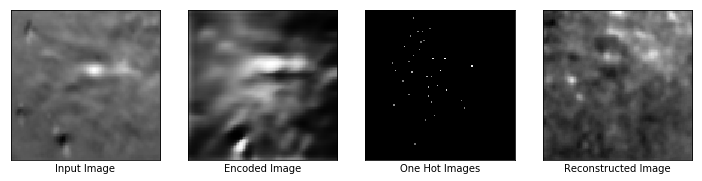

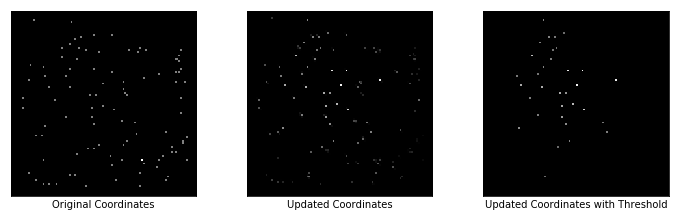

Reconstruction Loss: 0.010468665510416031
Regularizer Loss: 445596.40625, Total Loss: 445596.40625
Encoder Loss: 5.426249980926514
Max Similarity scores: 0.7405229210853577
Updated Coordinates: [[[0.53276515 0.7851025 ]]]



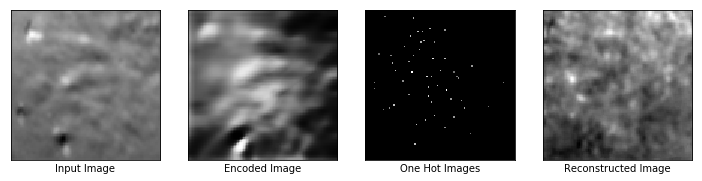

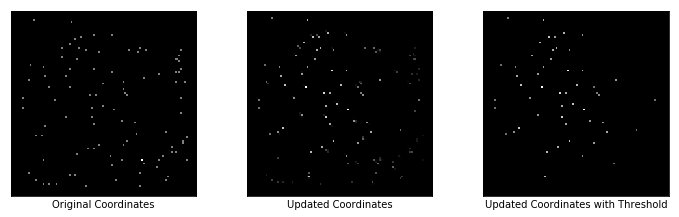

Reconstruction Loss: 0.010528666898608208
Regularizer Loss: 445352.75, Total Loss: 445352.75
Encoder Loss: 5.674767971038818
Max Similarity scores: 0.7548037171363831
Updated Coordinates: [[[0.5327187 0.7851784]]]



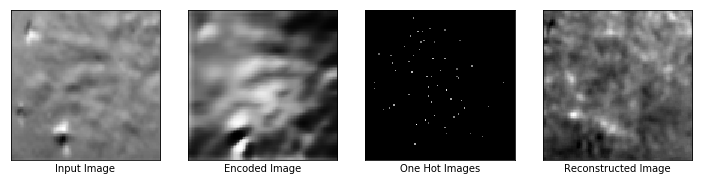

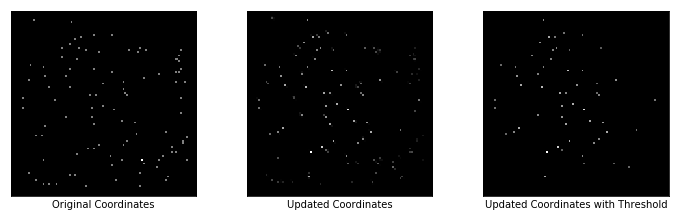

Reconstruction Loss: 0.012222153134644032
Regularizer Loss: 447535.78125, Total Loss: 447535.78125
Encoder Loss: 6.806154727935791
Max Similarity scores: 0.9326562881469727
Updated Coordinates: [[[0.5329343  0.78518045]]]



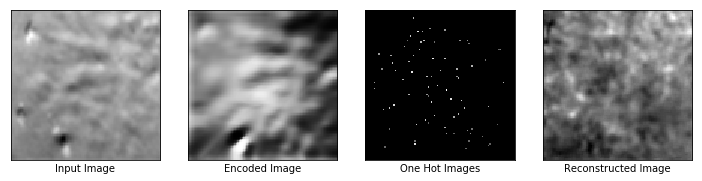

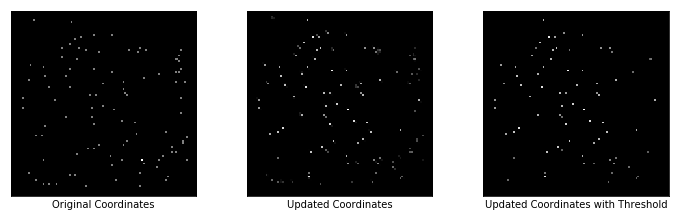

Reconstruction Loss: 0.012754482217133045
Regularizer Loss: 451092.40625, Total Loss: 451092.40625
Encoder Loss: 7.380882740020752
Max Similarity scores: 0.9045243859291077
Updated Coordinates: [[[0.53324026 0.78514415]]]



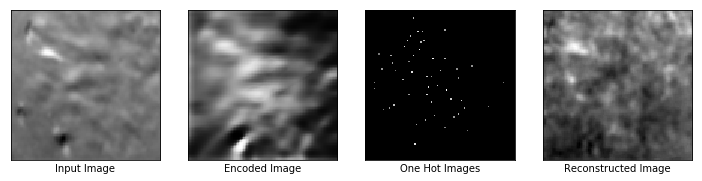

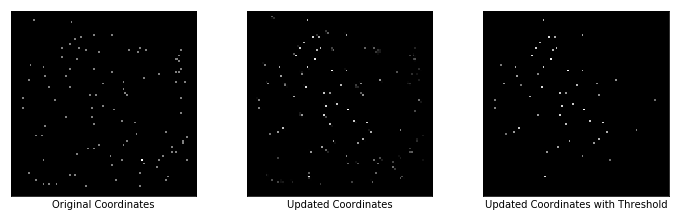

Reconstruction Loss: 0.009188675321638584
Regularizer Loss: 446887.3125, Total Loss: 446887.3125
Encoder Loss: 5.467982769012451
Max Similarity scores: 0.8550940752029419
Updated Coordinates: [[[0.533569   0.78507835]]]



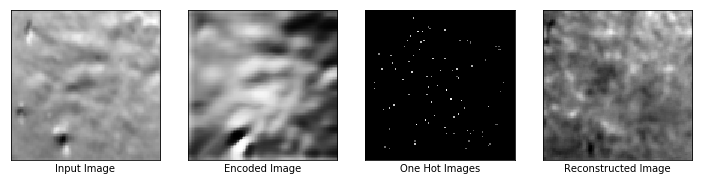

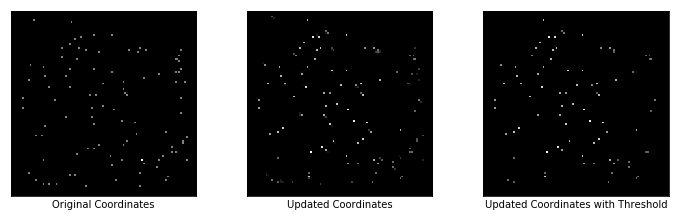

Reconstruction Loss: 0.01274191029369831
Regularizer Loss: 455052.65625, Total Loss: 455052.65625
Encoder Loss: 7.7991414070129395
Max Similarity scores: 0.9190157055854797
Updated Coordinates: [[[0.5338645  0.78502715]]]



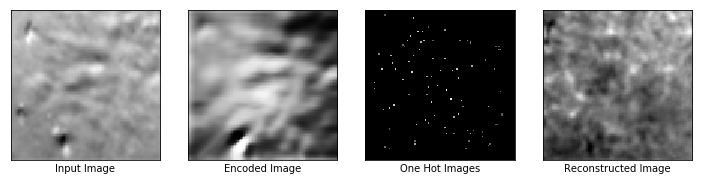

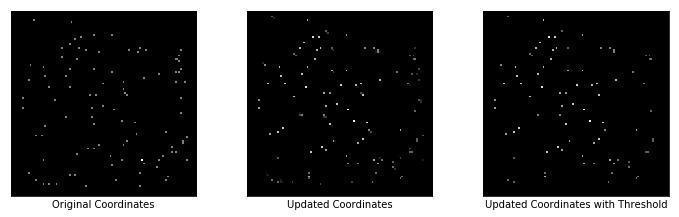

Reconstruction Loss: 0.011832619085907936
Regularizer Loss: 451901.8125, Total Loss: 451901.8125
Encoder Loss: 7.192199230194092
Max Similarity scores: 0.9282114505767822
Updated Coordinates: [[[0.5341406  0.78498244]]]



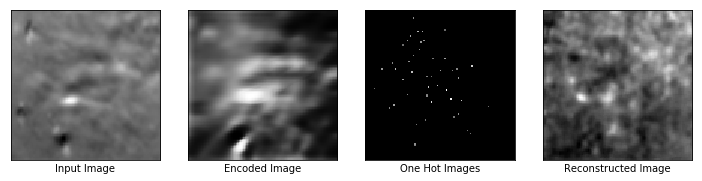

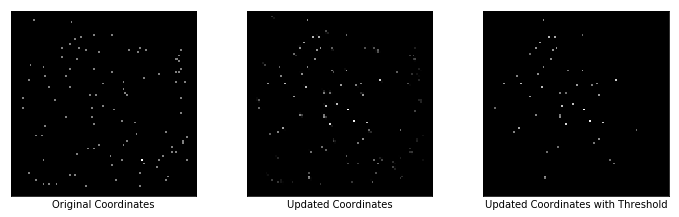

Reconstruction Loss: 0.00968968030065298
Regularizer Loss: 447727.65625, Total Loss: 447727.65625
Encoder Loss: 5.79907751083374
Max Similarity scores: 0.9600269794464111
Updated Coordinates: [[[0.5344139  0.78495044]]]



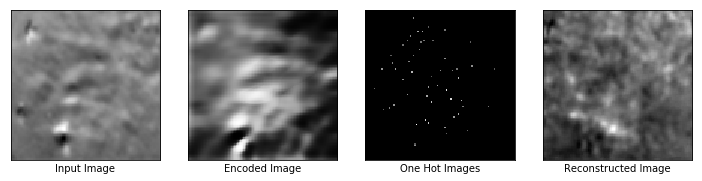

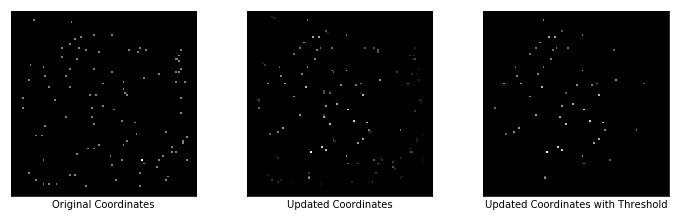

Reconstruction Loss: 0.010549585334956646
Regularizer Loss: 446373.09375, Total Loss: 446373.09375
Encoder Loss: 5.969693183898926
Max Similarity scores: 0.9409178495407104
Updated Coordinates: [[[0.5346707 0.7849258]]]



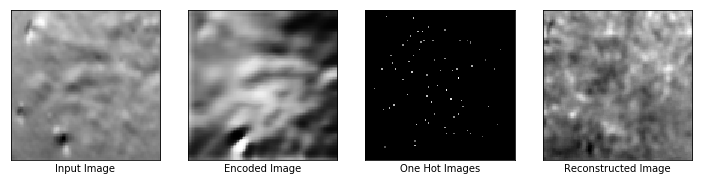

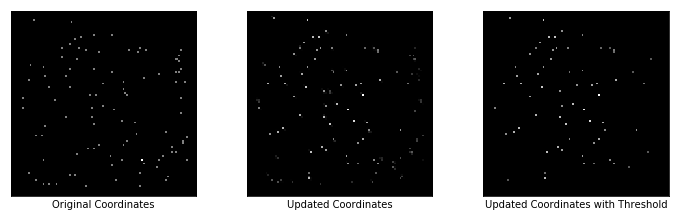

Reconstruction Loss: 0.011383228935301304
Regularizer Loss: 448210.34375, Total Loss: 448210.34375
Encoder Loss: 6.7438435554504395
Max Similarity scores: 0.9532120227813721
Updated Coordinates: [[[0.5349089  0.78490037]]]



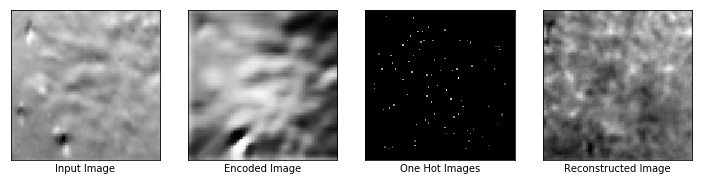

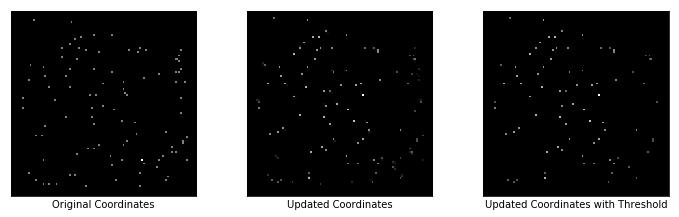

Reconstruction Loss: 0.009109178557991982
Regularizer Loss: 449863.09375, Total Loss: 449863.09375
Encoder Loss: 6.4105682373046875
Max Similarity scores: 0.9682613015174866
Updated Coordinates: [[[0.5351446 0.7848628]]]



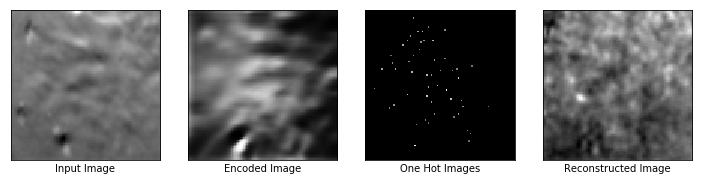

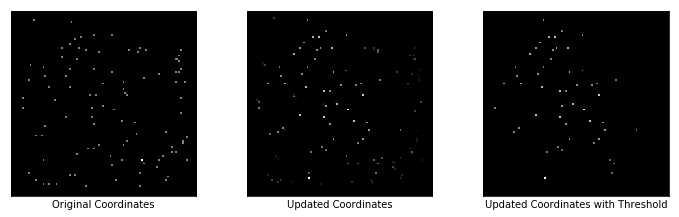

Reconstruction Loss: 0.010374855250120163
Regularizer Loss: 450927.6875, Total Loss: 450927.6875
Encoder Loss: 6.9634575843811035
Max Similarity scores: 0.8732701539993286
Updated Coordinates: [[[0.5354047  0.78482234]]]



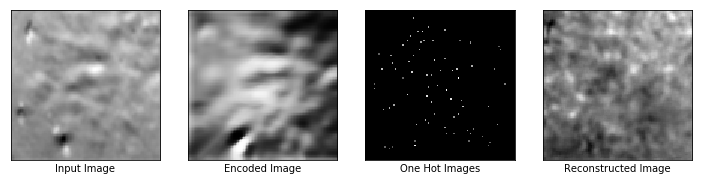

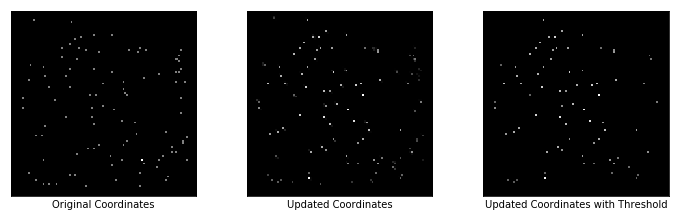

Reconstruction Loss: 0.01031013485044241
Regularizer Loss: 450973.4375, Total Loss: 450973.4375
Encoder Loss: 7.067960739135742
Max Similarity scores: 0.9730265140533447
Updated Coordinates: [[[0.5356016 0.7848261]]]



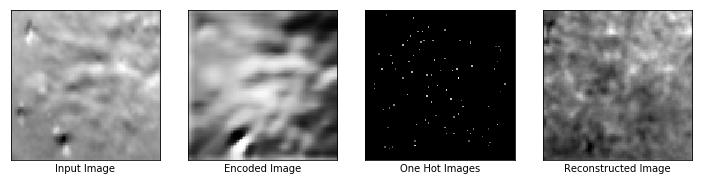

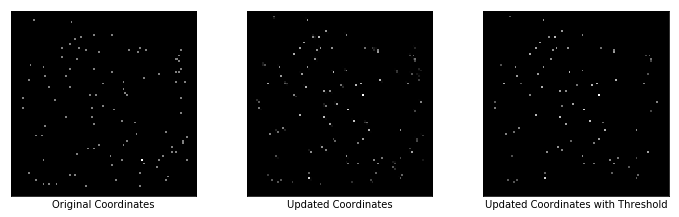

Reconstruction Loss: 0.009863730520009995
Regularizer Loss: 447894.9375, Total Loss: 447894.9375
Encoder Loss: 6.094533443450928
Max Similarity scores: 0.9747990369796753
Updated Coordinates: [[[0.5357021  0.78493893]]]



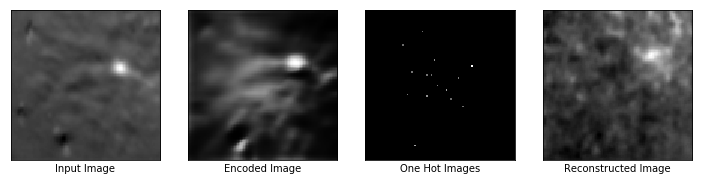

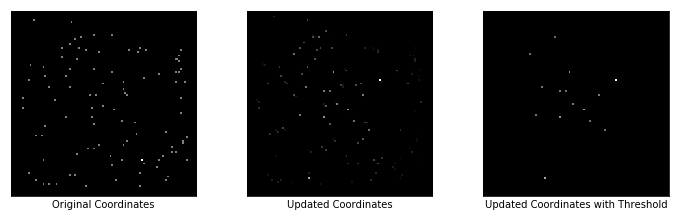

Reconstruction Loss: 0.011145099997520447
Regularizer Loss: 451141.71875, Total Loss: 451141.71875
Encoder Loss: 6.417731761932373
Max Similarity scores: 0.8111590147018433
Updated Coordinates: [[[0.53575736 0.78508335]]]



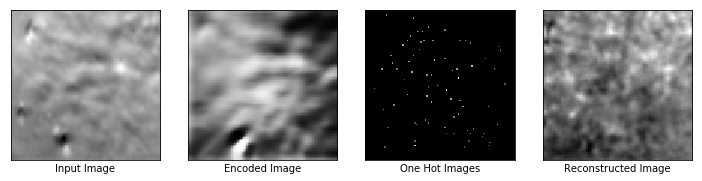

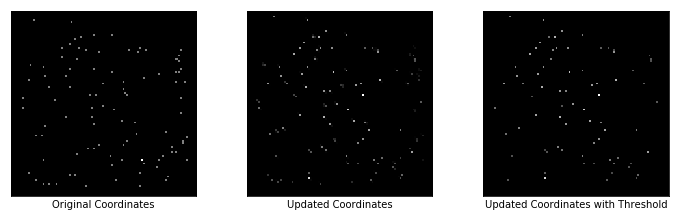

Reconstruction Loss: 0.009779789485037327
Regularizer Loss: 449028.65625, Total Loss: 449028.65625
Encoder Loss: 6.55573034286499
Max Similarity scores: 0.974811315536499
Updated Coordinates: [[[0.53578407 0.7852322 ]]]



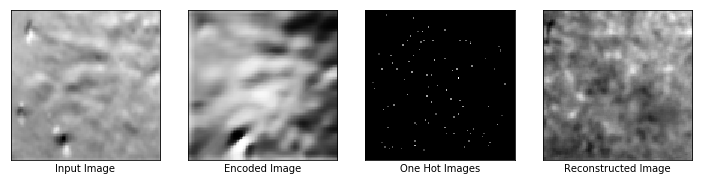

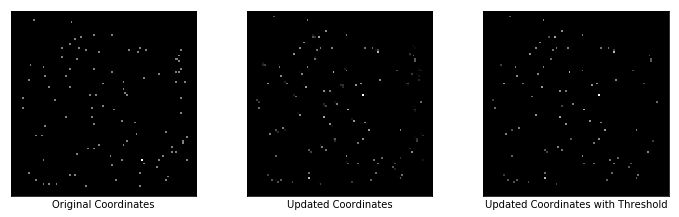

Reconstruction Loss: 0.01029177661985159
Regularizer Loss: 452422.53125, Total Loss: 452422.53125
Encoder Loss: 7.429610729217529
Max Similarity scores: 0.9786397218704224
Updated Coordinates: [[[0.5357835  0.78539175]]]



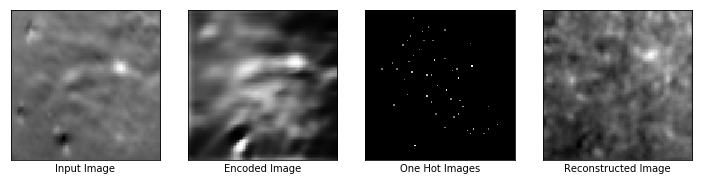

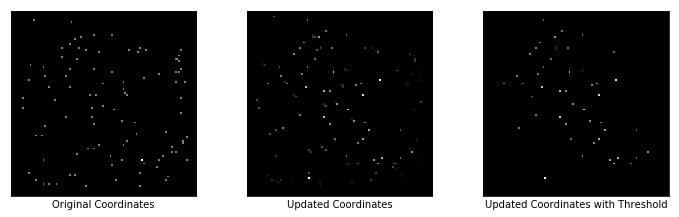

Reconstruction Loss: 0.009975851513445377
Regularizer Loss: 447897.9375, Total Loss: 447897.9375
Encoder Loss: 6.5409040451049805
Max Similarity scores: 0.8524819612503052
Updated Coordinates: [[[0.5358556  0.78550196]]]



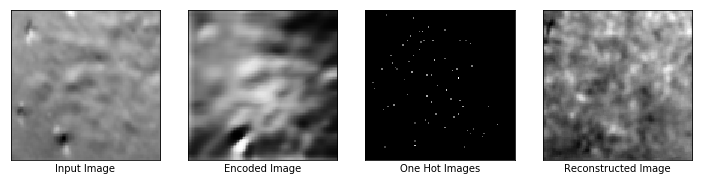

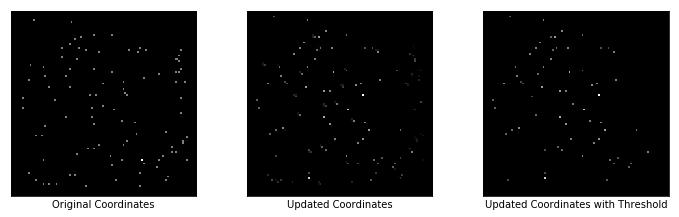

Reconstruction Loss: 0.009488620795309544
Regularizer Loss: 450585.0, Total Loss: 450585.0
Encoder Loss: 7.175367832183838
Max Similarity scores: 0.9422467350959778
Updated Coordinates: [[[0.5359272 0.7855745]]]



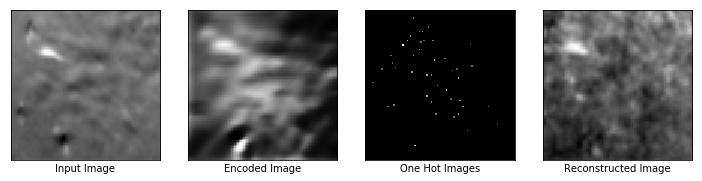

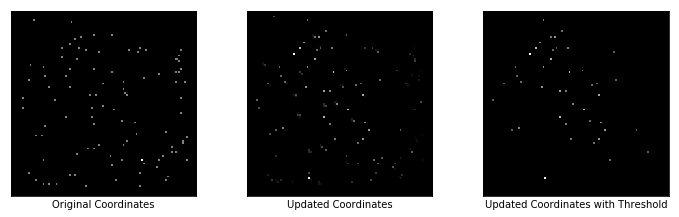

Reconstruction Loss: 0.008638044819235802
Regularizer Loss: 446392.90625, Total Loss: 446392.90625
Encoder Loss: 6.143477439880371
Max Similarity scores: 0.8668286800384521
Updated Coordinates: [[[0.5360973 0.7855781]]]



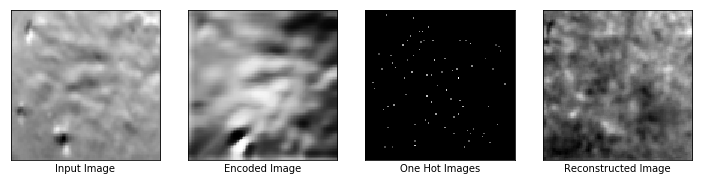

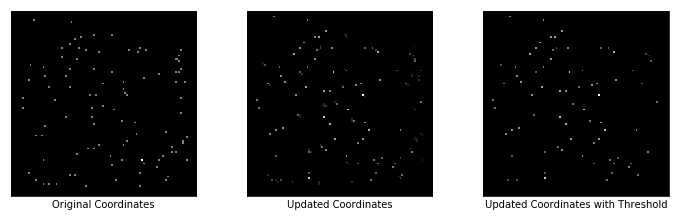

Reconstruction Loss: 0.010536096058785915
Regularizer Loss: 452776.5625, Total Loss: 452776.5625
Encoder Loss: 7.45412015914917
Max Similarity scores: 0.9757543206214905
Updated Coordinates: [[[0.5362128 0.7856155]]]



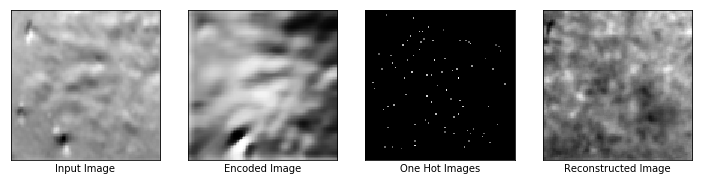

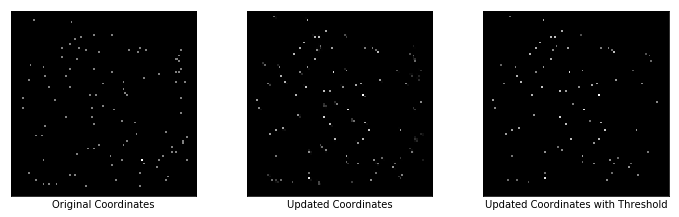

Reconstruction Loss: 0.01050907839089632
Regularizer Loss: 451170.59375, Total Loss: 451170.59375
Encoder Loss: 7.161856174468994
Max Similarity scores: 0.979544460773468
Updated Coordinates: [[[0.5362972 0.7856632]]]



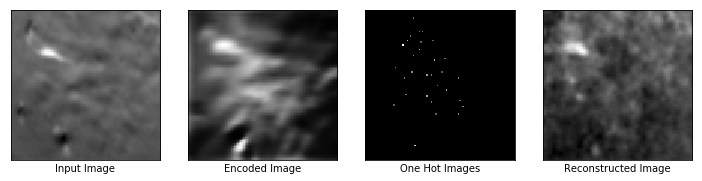

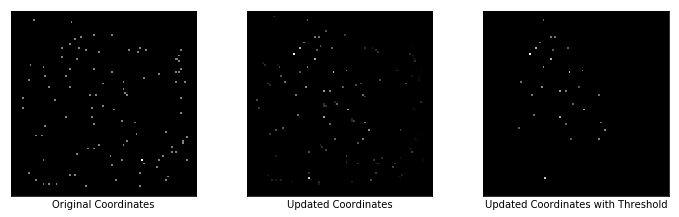

Reconstruction Loss: 0.007588379085063934
Regularizer Loss: 447593.8125, Total Loss: 447593.8125
Encoder Loss: 5.681628704071045
Max Similarity scores: 0.8840215802192688
Updated Coordinates: [[[0.5363412  0.78573895]]]



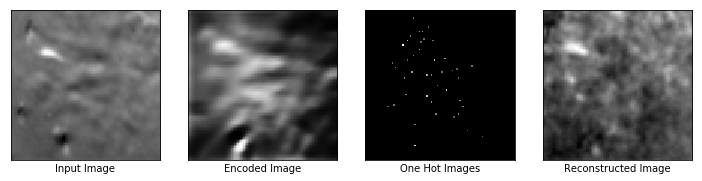

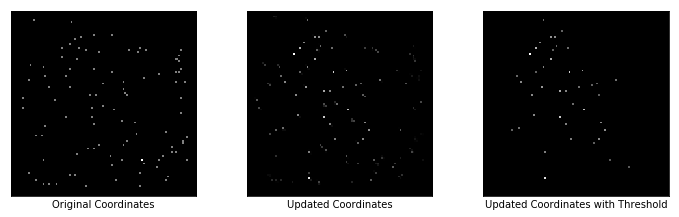

Reconstruction Loss: 0.008368133567273617
Regularizer Loss: 445706.8125, Total Loss: 445706.8125
Encoder Loss: 5.99411153793335
Max Similarity scores: 0.8659383058547974
Updated Coordinates: [[[0.53634804 0.7858424 ]]]



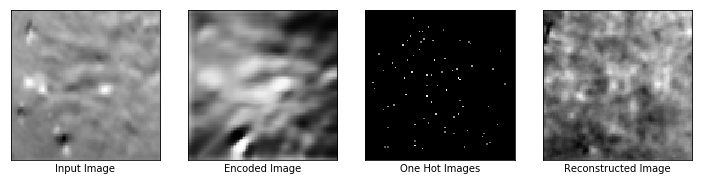

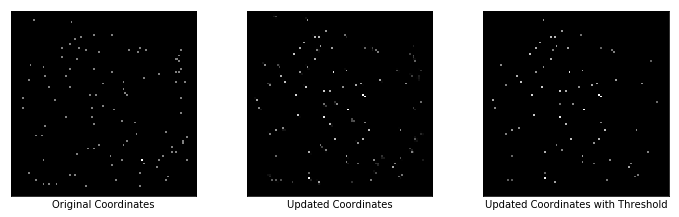

Reconstruction Loss: 0.0076093049719929695
Regularizer Loss: 445467.65625, Total Loss: 445467.65625
Encoder Loss: 5.530314922332764
Max Similarity scores: 0.9647400975227356
Updated Coordinates: [[[0.53633213 0.78595835]]]



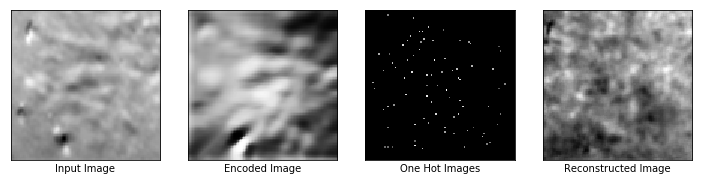

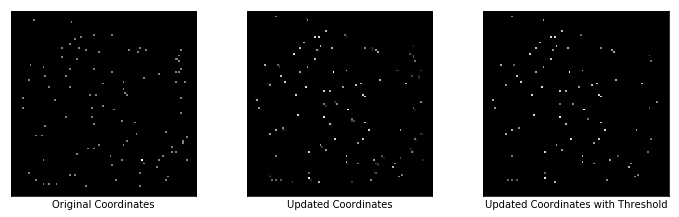

Reconstruction Loss: 0.008072584867477417
Regularizer Loss: 447860.40625, Total Loss: 447860.40625
Encoder Loss: 6.4070916175842285
Max Similarity scores: 0.9735282063484192
Updated Coordinates: [[[0.53631675 0.7860757 ]]]



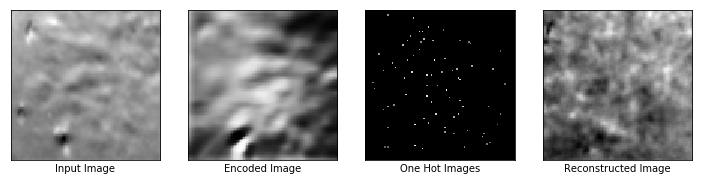

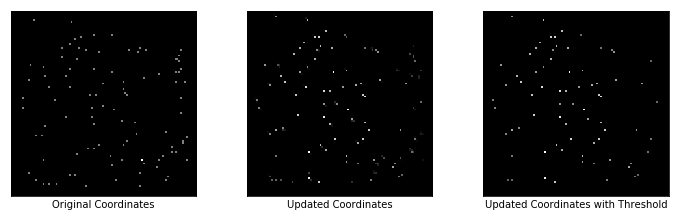

Reconstruction Loss: 0.010419496335089207
Regularizer Loss: 452561.1875, Total Loss: 452561.1875
Encoder Loss: 7.6696343421936035
Max Similarity scores: 0.9535528421401978
Updated Coordinates: [[[0.5362972 0.7861886]]]



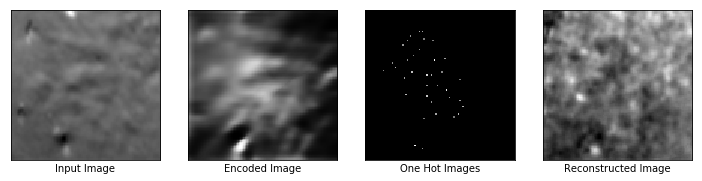

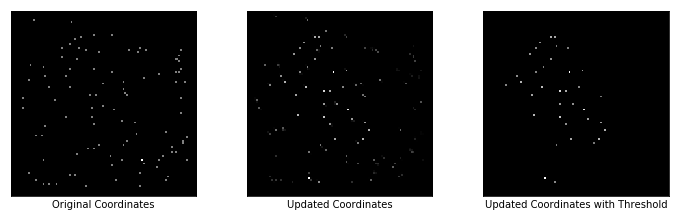

Reconstruction Loss: 0.007899719290435314
Regularizer Loss: 448960.5625, Total Loss: 448960.5625
Encoder Loss: 6.409707069396973
Max Similarity scores: 0.8011825680732727
Updated Coordinates: [[[0.53631586 0.78625935]]]



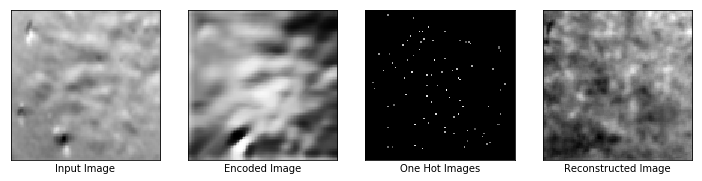

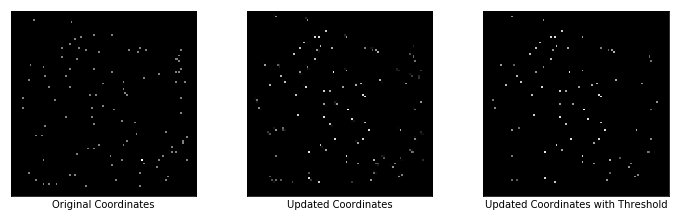

Reconstruction Loss: 0.00892139133065939
Regularizer Loss: 450291.6875, Total Loss: 450291.6875
Encoder Loss: 7.485947608947754
Max Similarity scores: 0.9730161428451538
Updated Coordinates: [[[0.5363969 0.7862826]]]



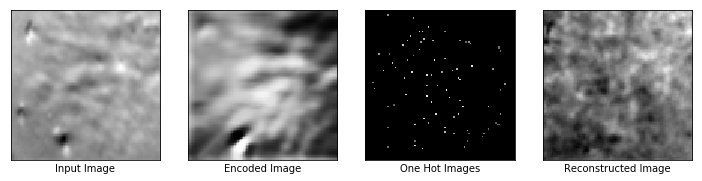

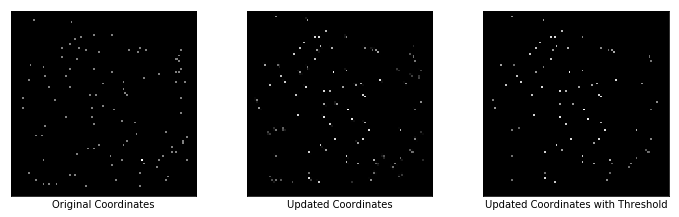

Reconstruction Loss: 0.008456562645733356
Regularizer Loss: 447310.40625, Total Loss: 447310.40625
Encoder Loss: 6.783709526062012
Max Similarity scores: 0.9762580394744873
Updated Coordinates: [[[0.5364927 0.7862797]]]



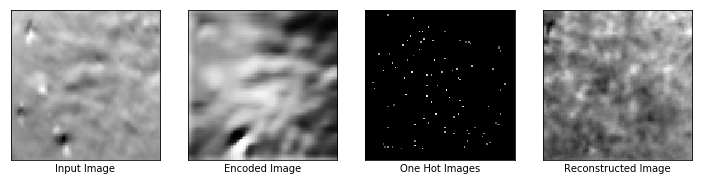

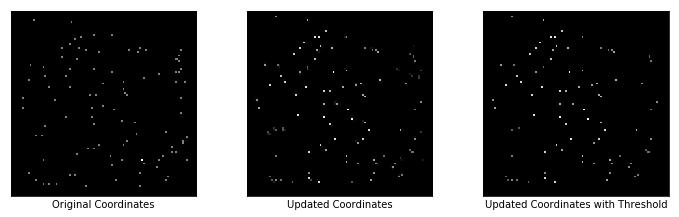

Reconstruction Loss: 0.007103106006979942
Regularizer Loss: 445698.4375, Total Loss: 445698.4375
Encoder Loss: 5.7109293937683105
Max Similarity scores: 0.9816473722457886
Updated Coordinates: [[[0.53655535 0.7862857 ]]]



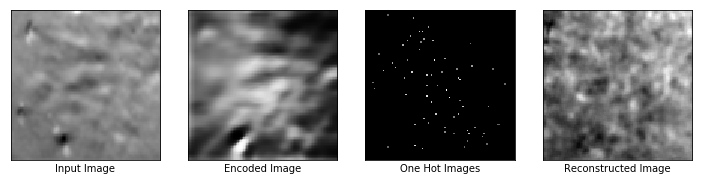

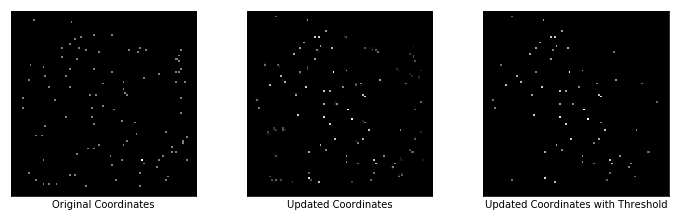

Reconstruction Loss: 0.007610359229147434
Regularizer Loss: 449193.1875, Total Loss: 449193.1875
Encoder Loss: 6.361315727233887
Max Similarity scores: 0.9464198350906372
Updated Coordinates: [[[0.5365933 0.786307 ]]]



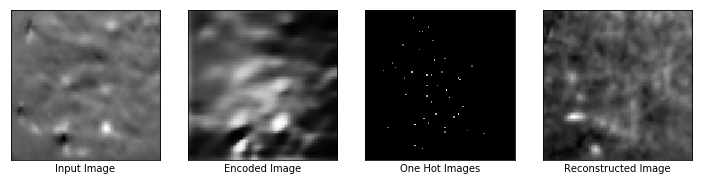

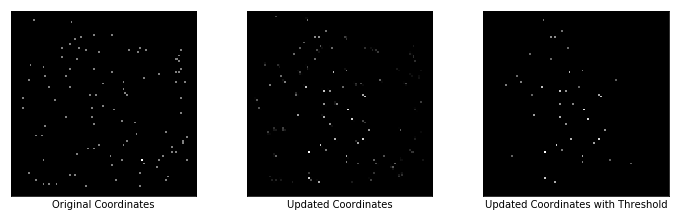

Reconstruction Loss: 0.008092999458312988
Regularizer Loss: 439225.71875, Total Loss: 439225.71875
Encoder Loss: 5.007260799407959
Max Similarity scores: 0.9009391069412231
Updated Coordinates: [[[0.5366056  0.78634363]]]



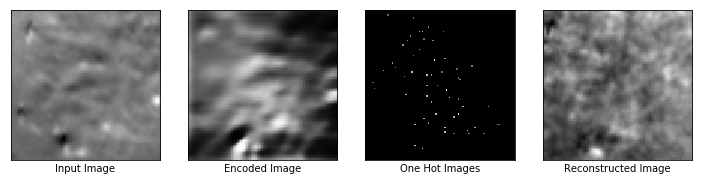

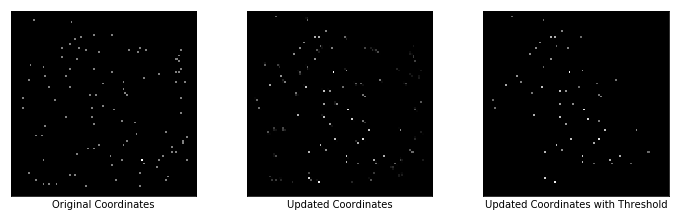

Reconstruction Loss: 0.009216267615556717
Regularizer Loss: 441566.78125, Total Loss: 441566.78125
Encoder Loss: 5.7212018966674805
Max Similarity scores: 0.9332265853881836
Updated Coordinates: [[[0.53663266 0.78638405]]]



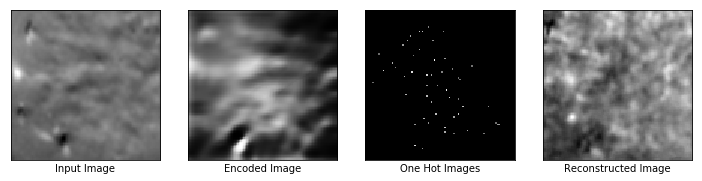

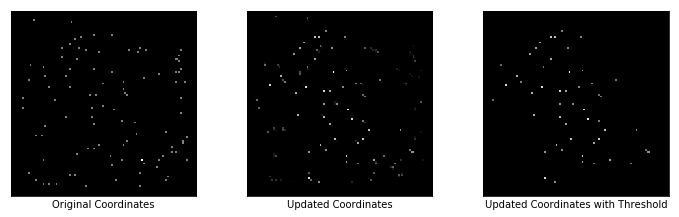

Reconstruction Loss: 0.00855417363345623
Regularizer Loss: 443469.5625, Total Loss: 443469.5625
Encoder Loss: 6.447599411010742
Max Similarity scores: 0.9168682098388672
Updated Coordinates: [[[0.5366508  0.78643334]]]



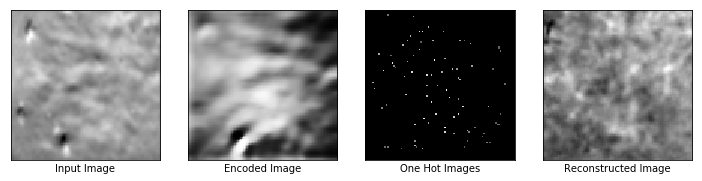

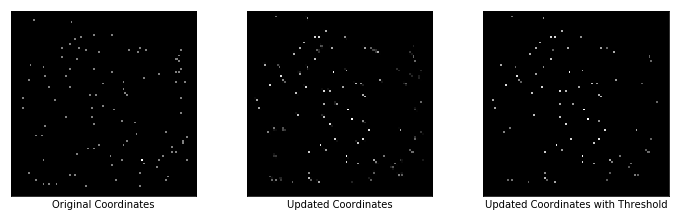

Reconstruction Loss: 0.010148239322006702
Regularizer Loss: 449905.84375, Total Loss: 449905.84375
Encoder Loss: 7.488349437713623
Max Similarity scores: 0.9744876027107239
Updated Coordinates: [[[0.5366627 0.7864793]]]



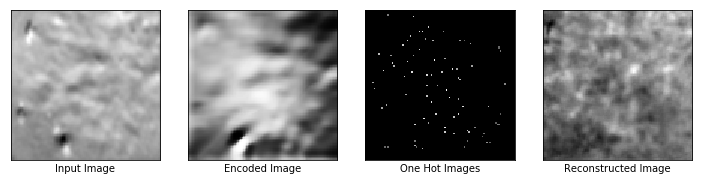

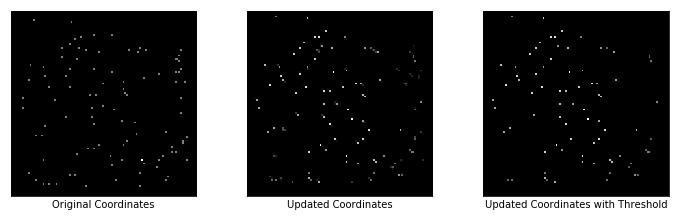

Reconstruction Loss: 0.00978765171021223
Regularizer Loss: 447650.03125, Total Loss: 447650.03125
Encoder Loss: 7.265920162200928
Max Similarity scores: 0.9842292666435242
Updated Coordinates: [[[0.536662  0.7865279]]]



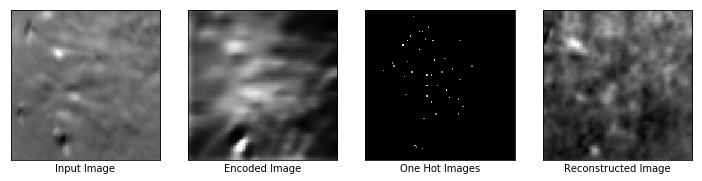

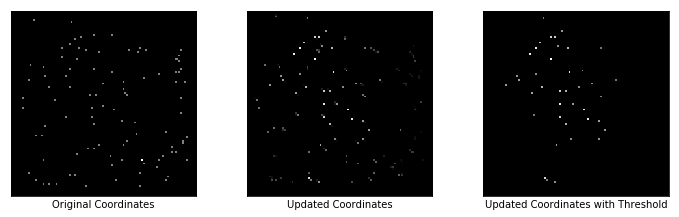

Reconstruction Loss: 0.008106446824967861
Regularizer Loss: 441726.25, Total Loss: 441726.25
Encoder Loss: 5.212682723999023
Max Similarity scores: 0.8795742988586426
Updated Coordinates: [[[0.5367661 0.78651  ]]]



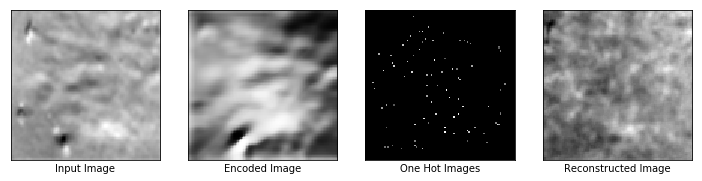

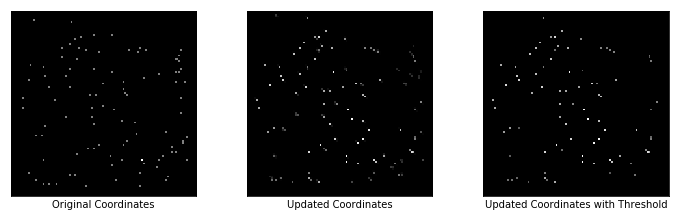

Reconstruction Loss: 0.009757730178534985
Regularizer Loss: 451068.9375, Total Loss: 451068.9375
Encoder Loss: 8.540901184082031
Max Similarity scores: 0.979881227016449
Updated Coordinates: [[[0.53683466 0.7865358 ]]]



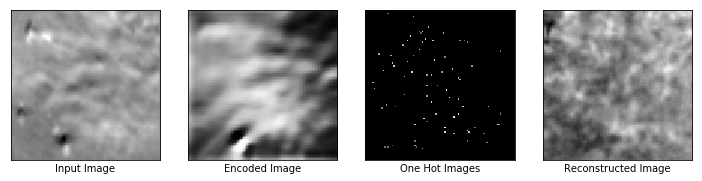

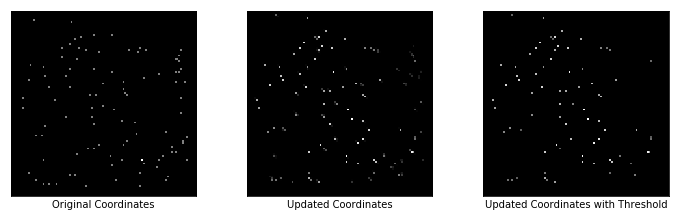

Reconstruction Loss: 0.009434008039534092
Regularizer Loss: 449706.71875, Total Loss: 449706.71875
Encoder Loss: 8.231731414794922
Max Similarity scores: 0.9766951203346252
Updated Coordinates: [[[0.53687537 0.78656024]]]



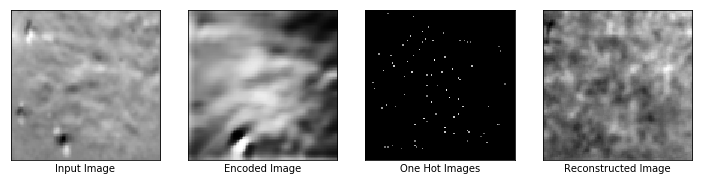

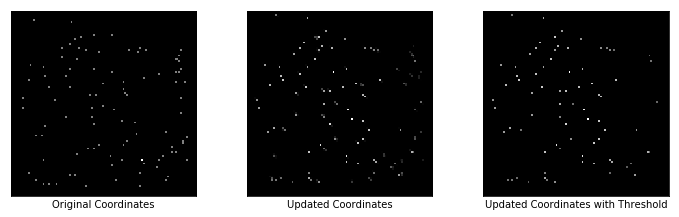

Reconstruction Loss: 0.009334987960755825
Regularizer Loss: 448970.5625, Total Loss: 448970.5625
Encoder Loss: 8.033550262451172
Max Similarity scores: 0.9777154922485352
Updated Coordinates: [[[0.5368962 0.7865769]]]



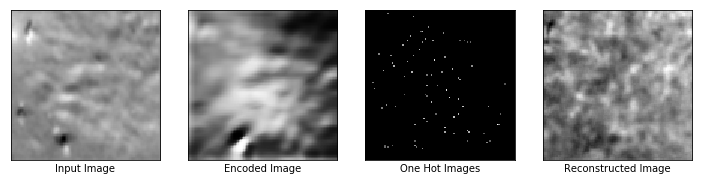

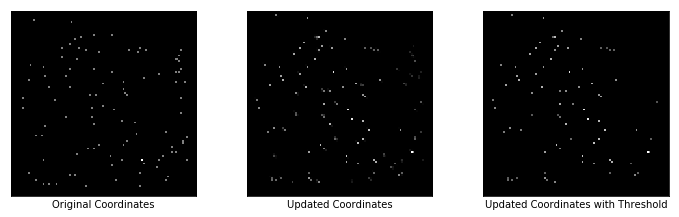

Reconstruction Loss: 0.008446319960057735
Regularizer Loss: 439023.28125, Total Loss: 439023.28125
Encoder Loss: 5.384336948394775
Max Similarity scores: 0.9715861082077026
Updated Coordinates: [[[0.53690356 0.78658473]]]



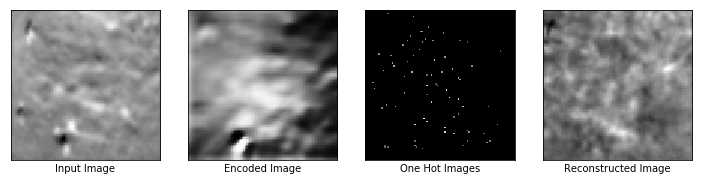

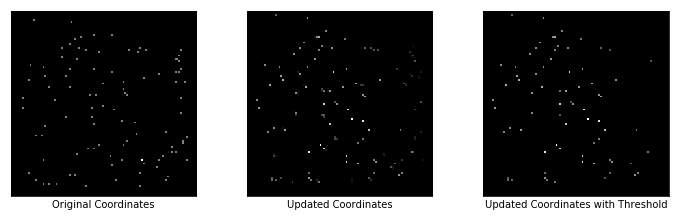

Reconstruction Loss: 0.008092045783996582
Regularizer Loss: 439775.34375, Total Loss: 439775.34375
Encoder Loss: 5.286052703857422
Max Similarity scores: 0.9755170941352844
Updated Coordinates: [[[0.53689903 0.7865698 ]]]



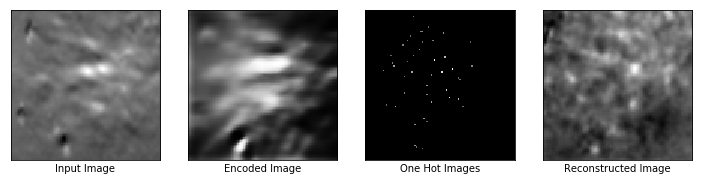

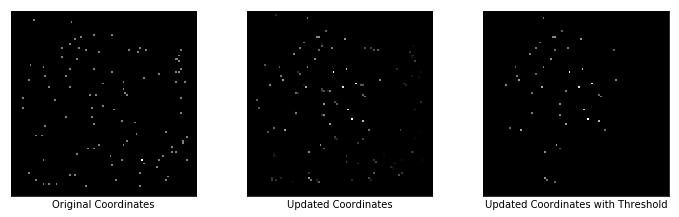

Reconstruction Loss: 0.008316381834447384
Regularizer Loss: 443038.53125, Total Loss: 443038.53125
Encoder Loss: 5.435003757476807
Max Similarity scores: 0.8617783784866333
Updated Coordinates: [[[0.53686285 0.78655666]]]



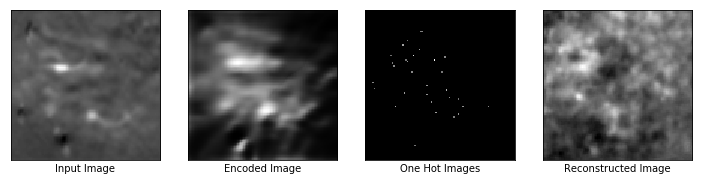

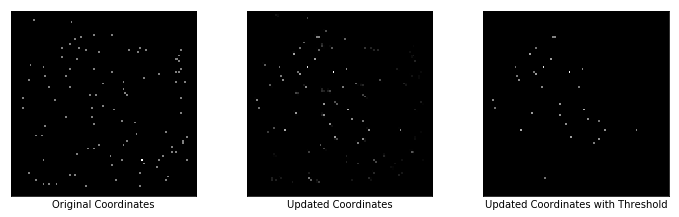

Reconstruction Loss: 0.007645903155207634
Regularizer Loss: 441947.28125, Total Loss: 441947.28125
Encoder Loss: 5.246431827545166
Max Similarity scores: 0.7280550599098206
Updated Coordinates: [[[0.5368049  0.78656954]]]



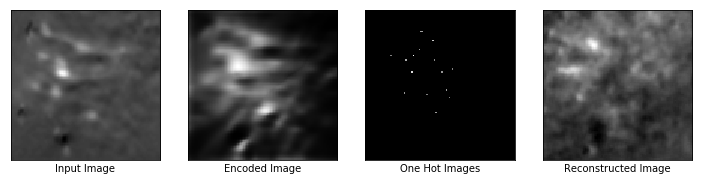

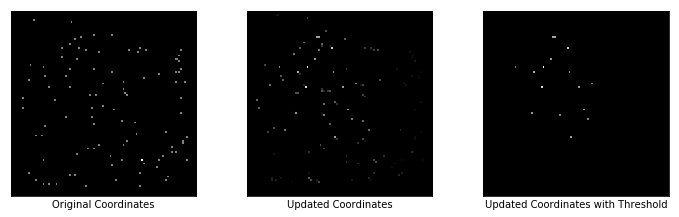

Reconstruction Loss: 0.007536830846220255
Regularizer Loss: 440802.46875, Total Loss: 440802.46875
Encoder Loss: 3.408961772918701
Max Similarity scores: 0.66862553358078
Updated Coordinates: [[[0.5367398 0.7865882]]]



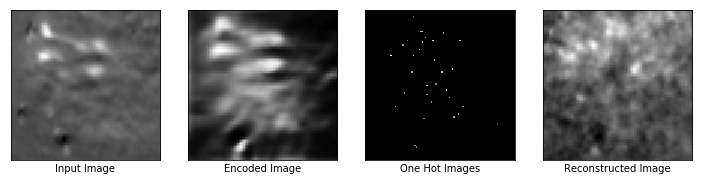

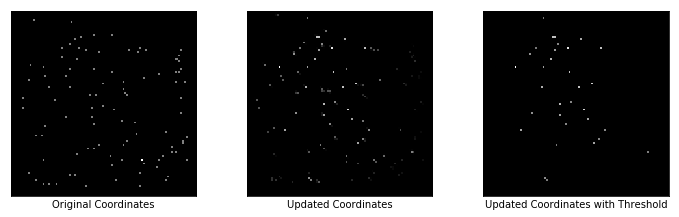

Reconstruction Loss: 0.007495092228055
Regularizer Loss: 442156.0625, Total Loss: 442156.0625
Encoder Loss: 3.703325033187866
Max Similarity scores: 0.6804918050765991
Updated Coordinates: [[[0.53666437 0.7866284 ]]]



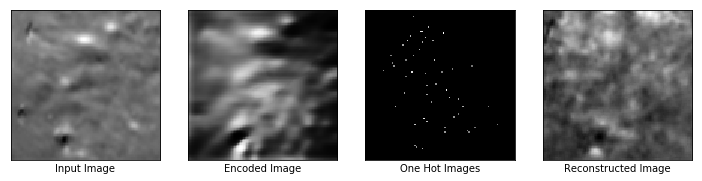

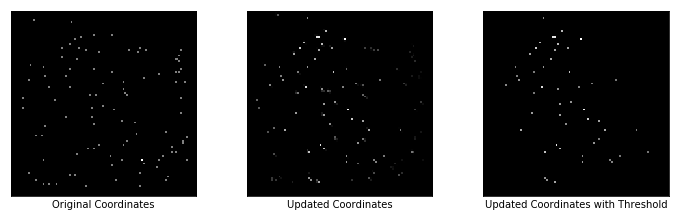

Reconstruction Loss: 0.0090487040579319
Regularizer Loss: 435366.4375, Total Loss: 435366.4375
Encoder Loss: 4.312473297119141
Max Similarity scores: 0.8266289830207825
Updated Coordinates: [[[0.5365854 0.7866755]]]



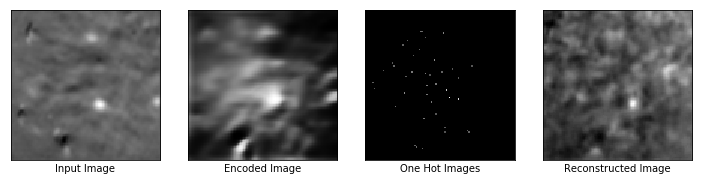

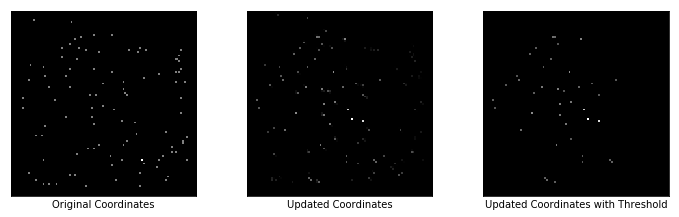

Reconstruction Loss: 0.006609291769564152
Regularizer Loss: 435089.125, Total Loss: 435089.125
Encoder Loss: 4.220332145690918
Max Similarity scores: 0.9316021203994751
Updated Coordinates: [[[0.53658366 0.7867013 ]]]



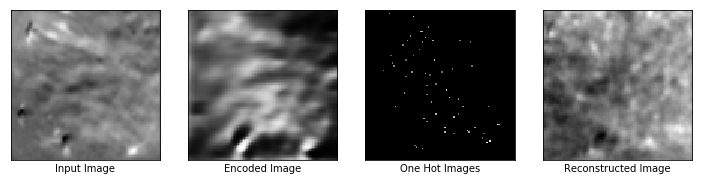

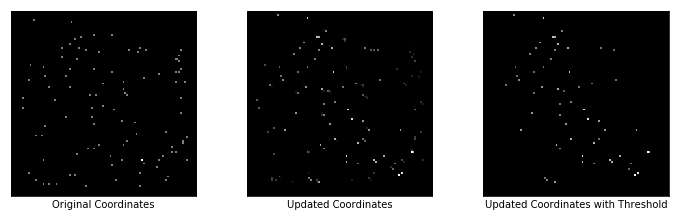

Reconstruction Loss: 0.0074261948466300964
Regularizer Loss: 436792.3125, Total Loss: 436792.3125
Encoder Loss: 5.112560749053955
Max Similarity scores: 0.8382194638252258
Updated Coordinates: [[[0.5366266  0.78670585]]]



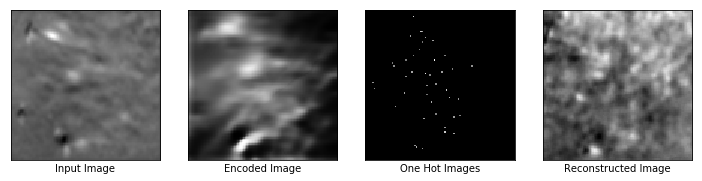

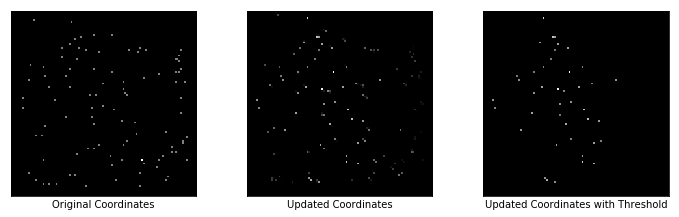

Reconstruction Loss: 0.008084440603852272
Regularizer Loss: 441345.96875, Total Loss: 441345.96875
Encoder Loss: 6.204619884490967
Max Similarity scores: 0.8385840654373169
Updated Coordinates: [[[0.5366222 0.7867231]]]



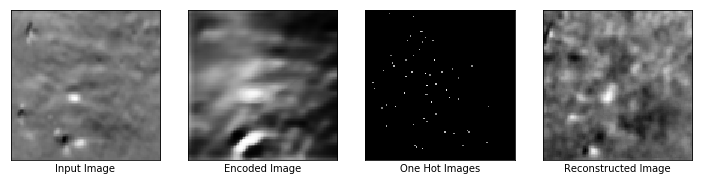

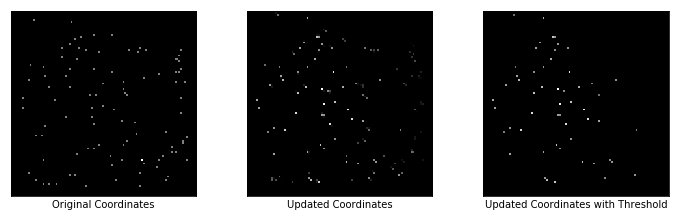

Reconstruction Loss: 0.006551138125360012
Regularizer Loss: 439217.96875, Total Loss: 439217.96875
Encoder Loss: 4.085247039794922
Max Similarity scores: 0.944418728351593
Updated Coordinates: [[[0.53664917 0.7867193 ]]]



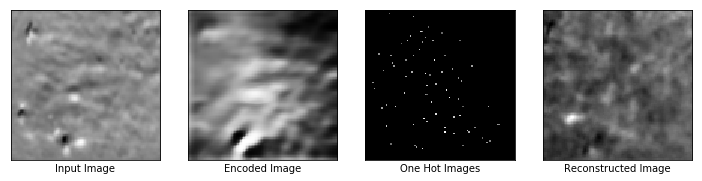

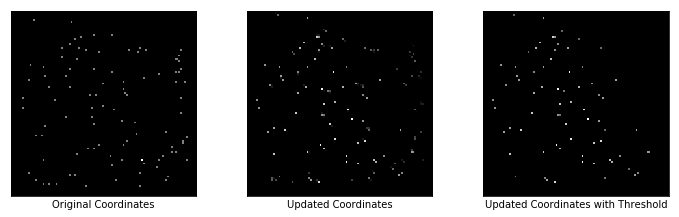

Reconstruction Loss: 0.008513902314007282
Regularizer Loss: 437610.0, Total Loss: 437610.0
Encoder Loss: 6.577251434326172
Max Similarity scores: 0.9235214591026306
Updated Coordinates: [[[0.5367899 0.7866589]]]



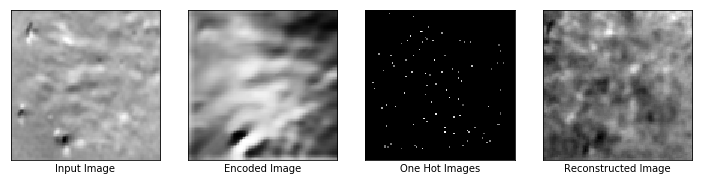

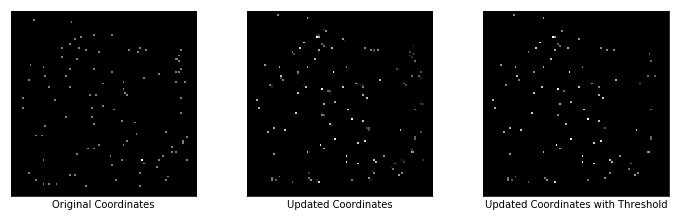

Reconstruction Loss: 0.007452096790075302
Regularizer Loss: 437084.375, Total Loss: 437084.375
Encoder Loss: 5.475420951843262
Max Similarity scores: 0.9443753957748413
Updated Coordinates: [[[0.53691167 0.78660846]]]



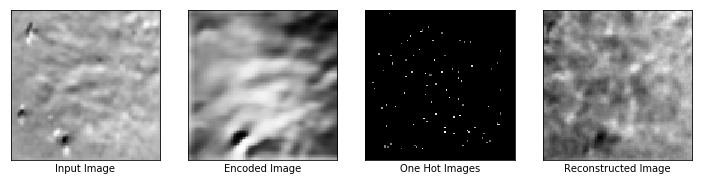

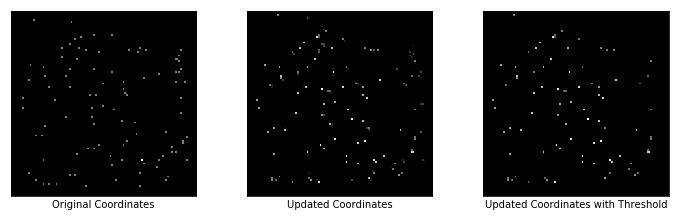

Reconstruction Loss: 0.008023791946470737
Regularizer Loss: 440682.15625, Total Loss: 440682.15625
Encoder Loss: 6.9612250328063965
Max Similarity scores: 0.9308195114135742
Updated Coordinates: [[[0.53702176 0.7865843 ]]]



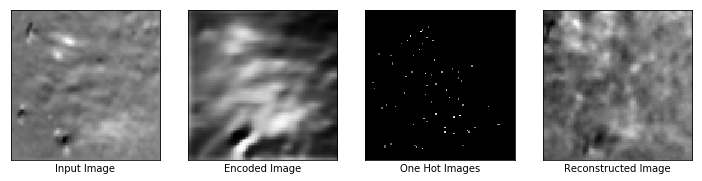

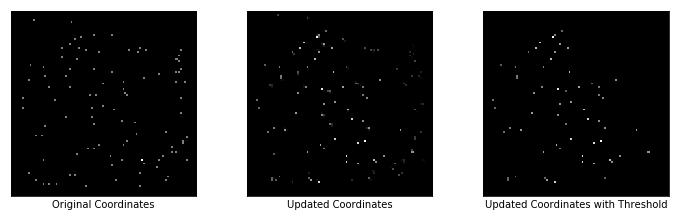

Reconstruction Loss: 0.00874422863125801
Regularizer Loss: 438312.5, Total Loss: 438312.5
Encoder Loss: 4.968878746032715
Max Similarity scores: 0.8754005432128906
Updated Coordinates: [[[0.5371103  0.78656733]]]



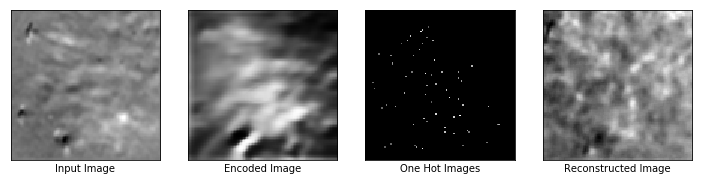

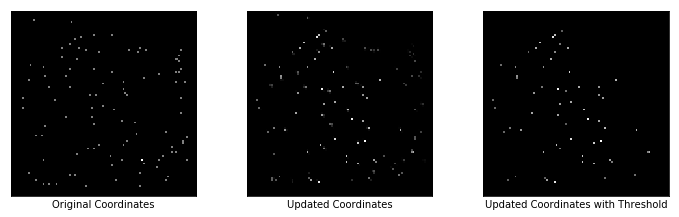

Reconstruction Loss: 0.008248008787631989
Regularizer Loss: 440043.0625, Total Loss: 440043.0625
Encoder Loss: 6.590414047241211
Max Similarity scores: 0.8416613340377808
Updated Coordinates: [[[0.5371941 0.7866142]]]



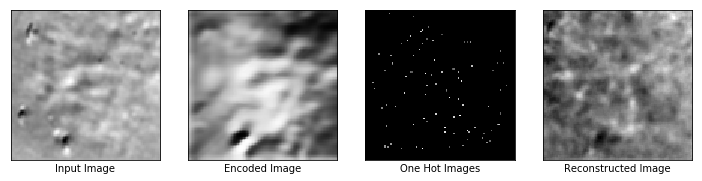

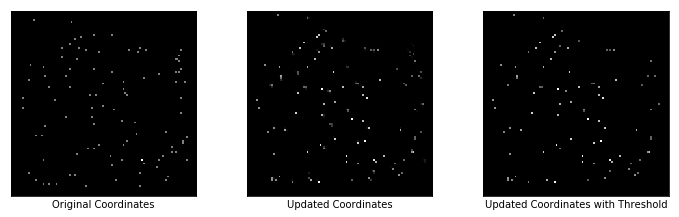

Reconstruction Loss: 0.007494663819670677
Regularizer Loss: 439467.71875, Total Loss: 439467.71875
Encoder Loss: 6.178317546844482
Max Similarity scores: 0.9540039300918579
Updated Coordinates: [[[0.5372788  0.78669006]]]



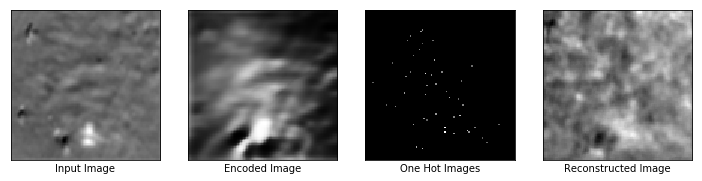

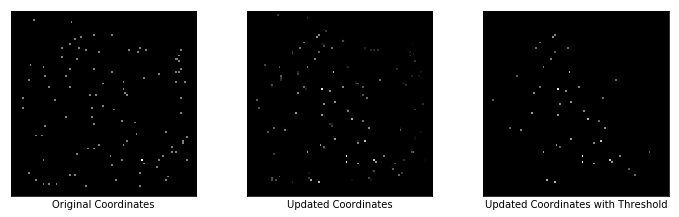

Reconstruction Loss: 0.006568113807588816
Regularizer Loss: 435802.875, Total Loss: 435802.875
Encoder Loss: 5.162979602813721
Max Similarity scores: 0.87028568983078
Updated Coordinates: [[[0.537364  0.7867598]]]



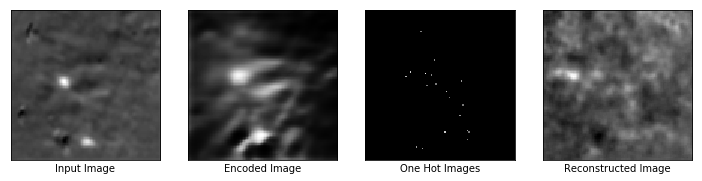

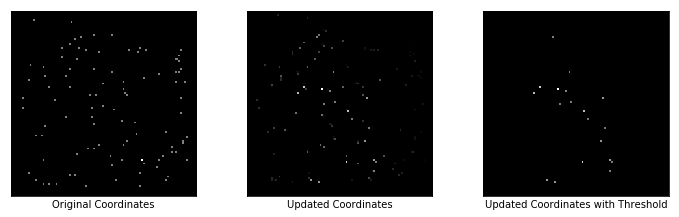

Reconstruction Loss: 0.007837479002773762
Regularizer Loss: 440827.8125, Total Loss: 440827.8125
Encoder Loss: 6.512115955352783
Max Similarity scores: 0.7139256000518799
Updated Coordinates: [[[0.5374349 0.7868411]]]



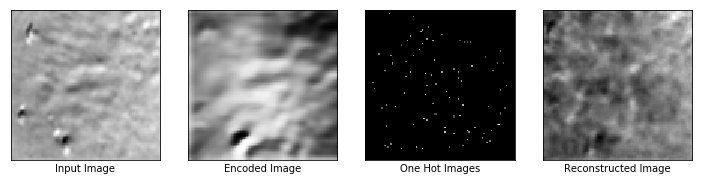

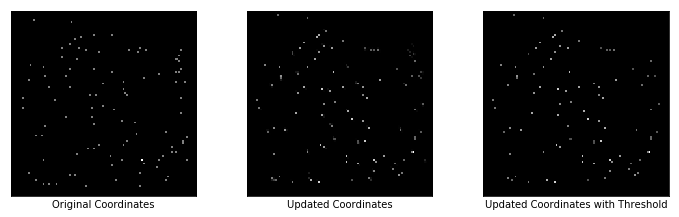

Reconstruction Loss: 0.008814139291644096
Regularizer Loss: 446737.125, Total Loss: 446737.125
Encoder Loss: 8.48243236541748
Max Similarity scores: 0.9349889755249023
Updated Coordinates: [[[0.5375122  0.78693426]]]



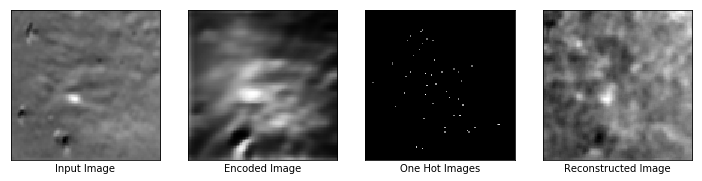

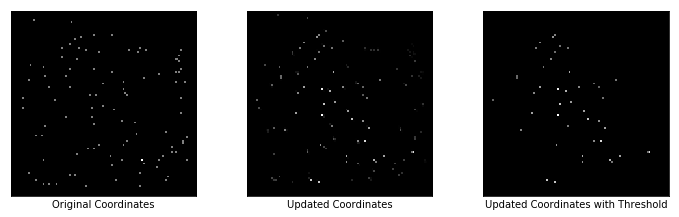

Reconstruction Loss: 0.0070623732171952724
Regularizer Loss: 440000.96875, Total Loss: 440000.96875
Encoder Loss: 6.518880367279053
Max Similarity scores: 0.9277373552322388
Updated Coordinates: [[[0.53758776 0.7870181 ]]]



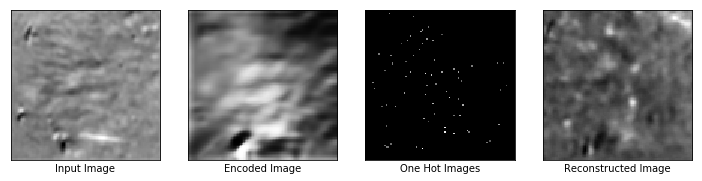

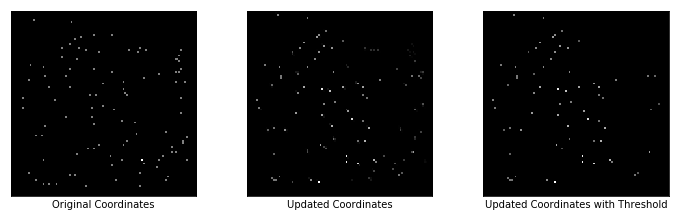

Reconstruction Loss: 0.010277626104652882
Regularizer Loss: 441901.28125, Total Loss: 441901.28125
Encoder Loss: 6.209456920623779
Max Similarity scores: 0.9886781573295593
Updated Coordinates: [[[0.5376526 0.7870952]]]



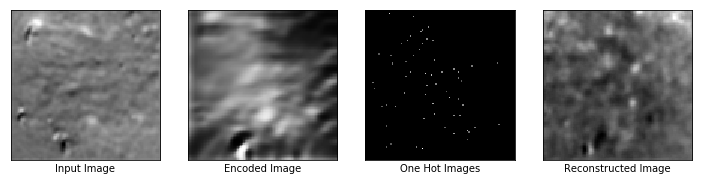

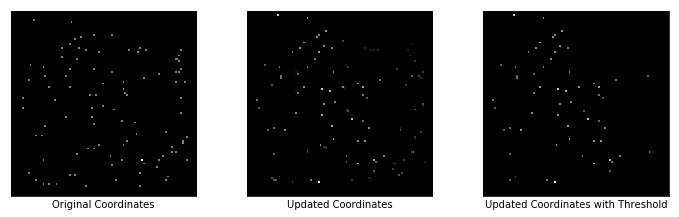

Reconstruction Loss: 0.010859474539756775
Regularizer Loss: 434693.84375, Total Loss: 434693.84375
Encoder Loss: 5.657387733459473
Max Similarity scores: 0.8926706314086914
Updated Coordinates: [[[0.5377348 0.7871063]]]



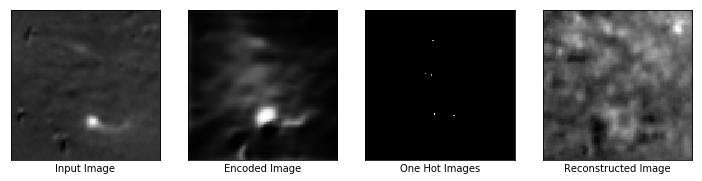

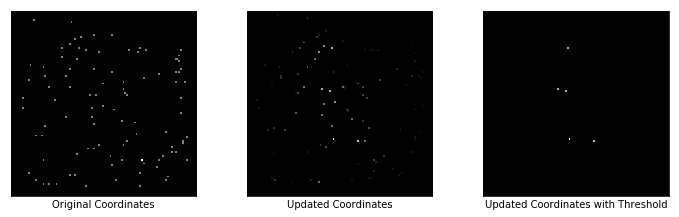

Reconstruction Loss: 0.008720393292605877
Regularizer Loss: 437948.6875, Total Loss: 437948.6875
Encoder Loss: 4.078122615814209
Max Similarity scores: 0.5681506991386414
Updated Coordinates: [[[0.53782356 0.787067  ]]]



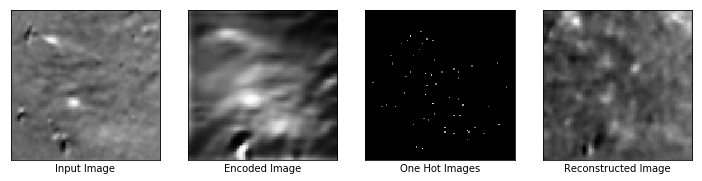

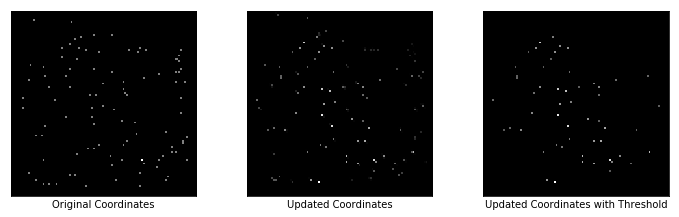

Reconstruction Loss: 0.009225709363818169
Regularizer Loss: 435219.03125, Total Loss: 435219.03125
Encoder Loss: 4.689465045928955
Max Similarity scores: 0.8890666961669922
Updated Coordinates: [[[0.5380123 0.7868487]]]



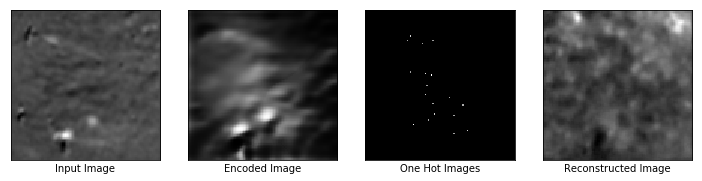

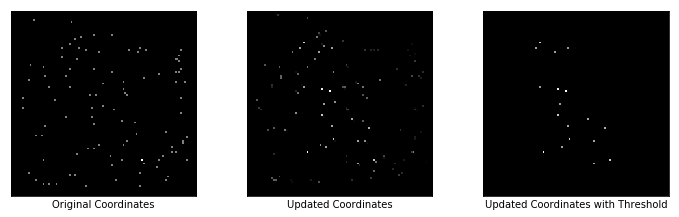

Reconstruction Loss: 0.009746652096509933
Regularizer Loss: 434124.375, Total Loss: 434124.375
Encoder Loss: 4.711132049560547
Max Similarity scores: 0.5305085778236389
Updated Coordinates: [[[0.5382002  0.78664136]]]



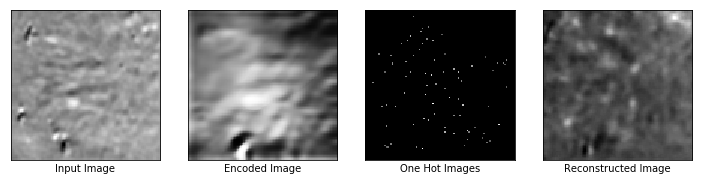

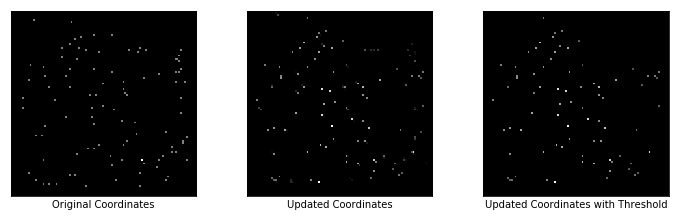

Reconstruction Loss: 0.011094845831394196
Regularizer Loss: 433924.78125, Total Loss: 433924.78125
Encoder Loss: 5.857072830200195
Max Similarity scores: 0.9567769765853882
Updated Coordinates: [[[0.5386851  0.78610003]]]



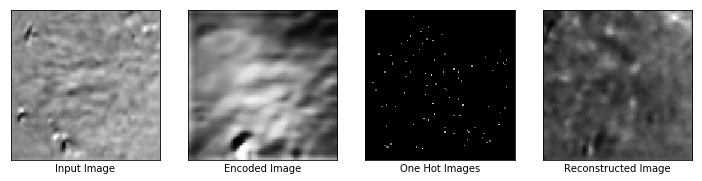

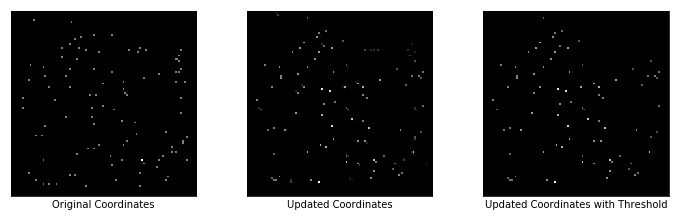

Reconstruction Loss: 0.01423100009560585
Regularizer Loss: 432876.09375, Total Loss: 432876.09375
Encoder Loss: 5.930429458618164
Max Similarity scores: 0.9931021928787231
Updated Coordinates: [[[0.5391754  0.78557795]]]



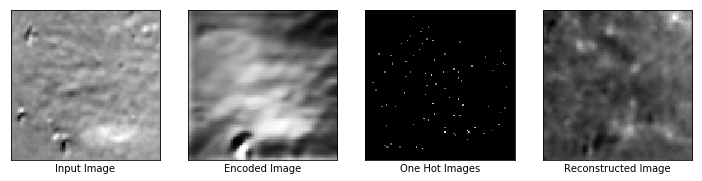

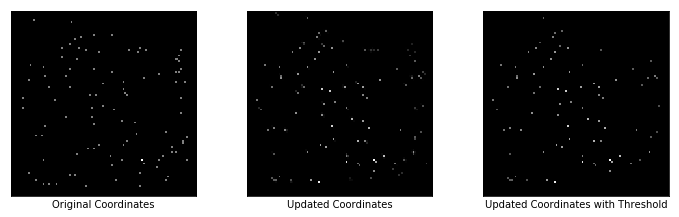

Reconstruction Loss: 0.01210645493119955
Regularizer Loss: 438974.75, Total Loss: 438974.75
Encoder Loss: 7.324706077575684
Max Similarity scores: 0.969257652759552
Updated Coordinates: [[[0.53933793 0.7857272 ]]]



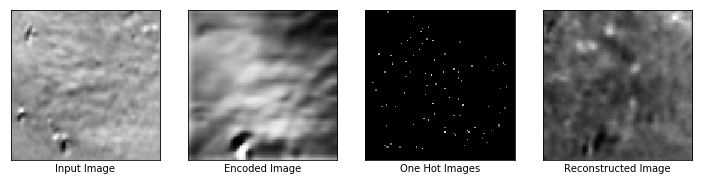

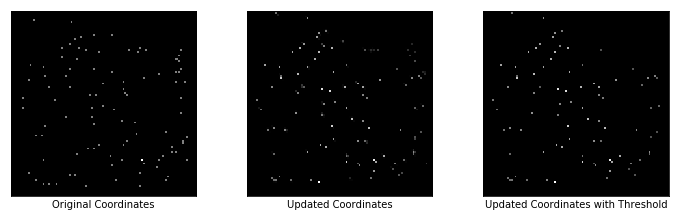

Reconstruction Loss: 0.012215704657137394
Regularizer Loss: 440851.15625, Total Loss: 440851.15625
Encoder Loss: 7.154426574707031
Max Similarity scores: 0.9681708216667175
Updated Coordinates: [[[0.53955036 0.7858274 ]]]



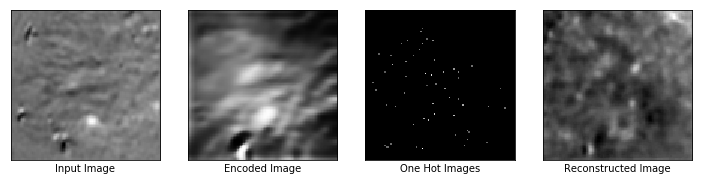

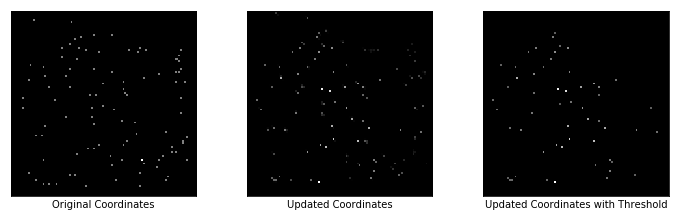

Reconstruction Loss: 0.009868363849818707
Regularizer Loss: 437629.75, Total Loss: 437629.75
Encoder Loss: 5.045108318328857
Max Similarity scores: 0.8848090171813965
Updated Coordinates: [[[0.5395702  0.78628886]]]



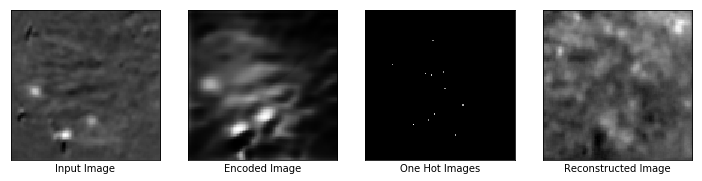

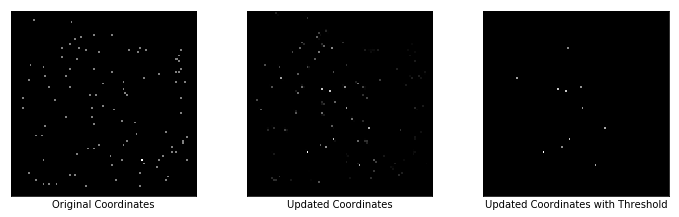

Reconstruction Loss: 0.010432638227939606
Regularizer Loss: 437811.25, Total Loss: 437811.25
Encoder Loss: 4.614281177520752
Max Similarity scores: 0.5773119926452637
Updated Coordinates: [[[0.5405037  0.78544307]]]



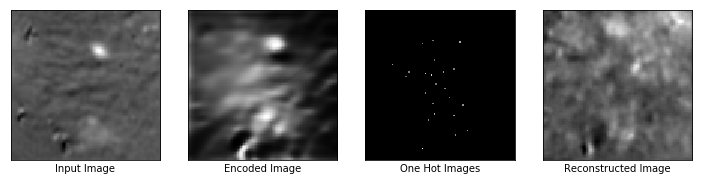

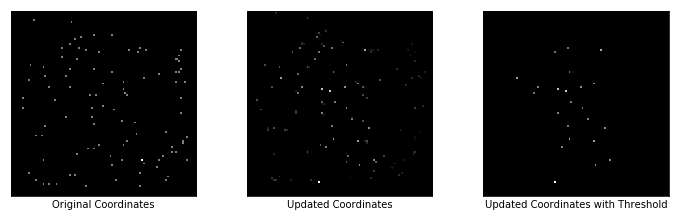

Reconstruction Loss: 0.007231324911117554
Regularizer Loss: 439421.4375, Total Loss: 439421.4375
Encoder Loss: 2.827256917953491
Max Similarity scores: 0.7159074544906616
Updated Coordinates: [[[0.5414711  0.78425115]]]



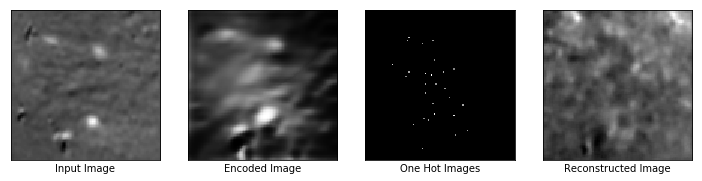

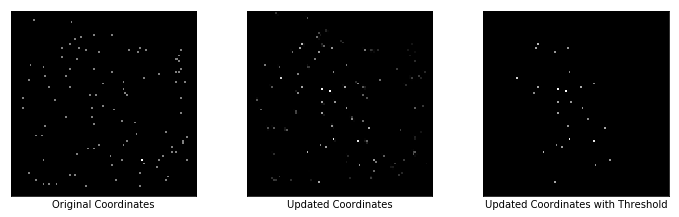

Reconstruction Loss: 0.010042733512818813
Regularizer Loss: 435461.15625, Total Loss: 435461.15625
Encoder Loss: 4.141083240509033
Max Similarity scores: 0.5952838063240051
Updated Coordinates: [[[0.5417414 0.7832432]]]



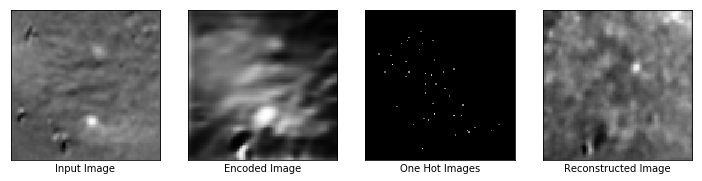

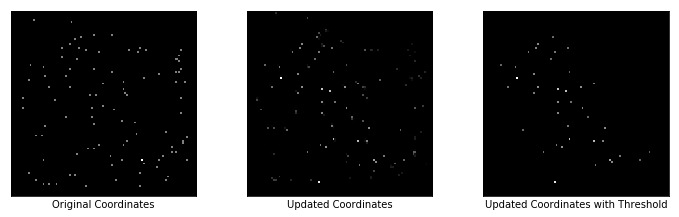

Reconstruction Loss: 0.009600511752068996
Regularizer Loss: 435878.125, Total Loss: 435878.125
Encoder Loss: 4.783658504486084
Max Similarity scores: 0.7644623517990112
Updated Coordinates: [[[0.5410529 0.782556 ]]]



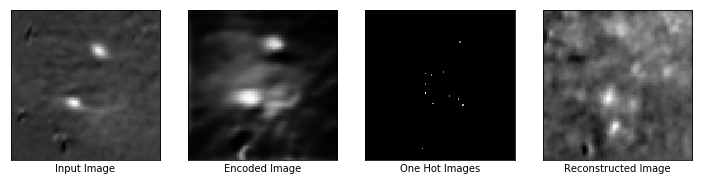

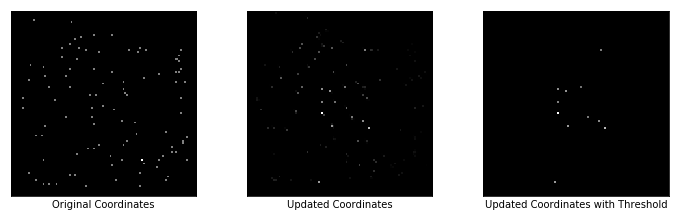

Reconstruction Loss: 0.006579089909791946
Regularizer Loss: 440471.5, Total Loss: 440471.5
Encoder Loss: 2.3321127891540527
Max Similarity scores: 0.8616151213645935
Updated Coordinates: [[[0.53989536 0.78227764]]]



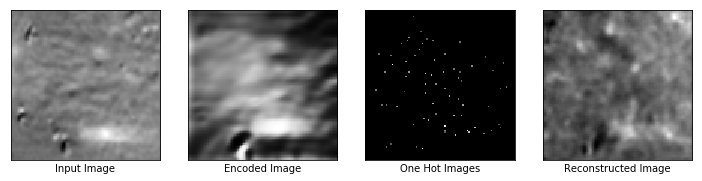

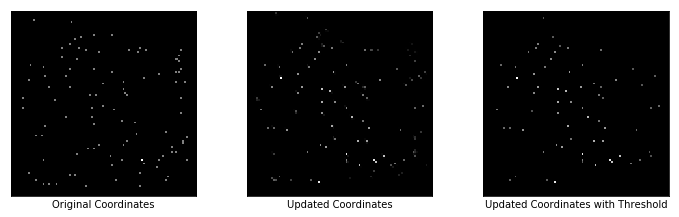

Reconstruction Loss: 0.011755491606891155
Regularizer Loss: 438488.5625, Total Loss: 438488.5625
Encoder Loss: 6.786831378936768
Max Similarity scores: 0.9520756006240845
Updated Coordinates: [[[0.5388491  0.78202444]]]



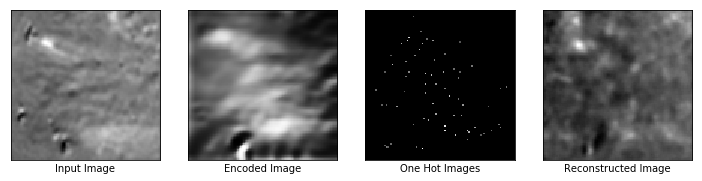

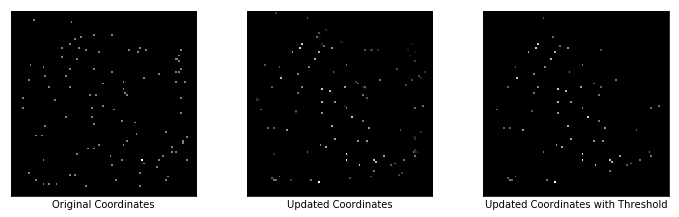

Reconstruction Loss: 0.011302022263407707
Regularizer Loss: 437474.1875, Total Loss: 437474.1875
Encoder Loss: 5.867990493774414
Max Similarity scores: 0.9235503673553467
Updated Coordinates: [[[0.5379132 0.7817927]]]



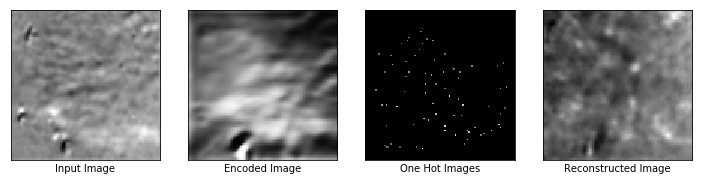

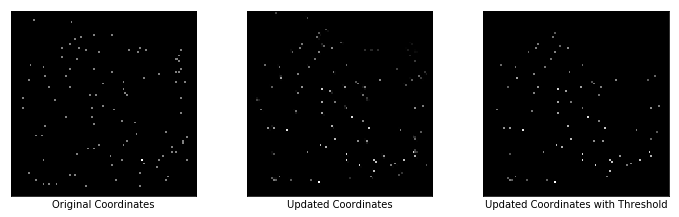

Reconstruction Loss: 0.010493187233805656
Regularizer Loss: 430711.34375, Total Loss: 430711.34375
Encoder Loss: 4.904460906982422
Max Similarity scores: 0.9598144888877869
Updated Coordinates: [[[0.5370669  0.78160024]]]



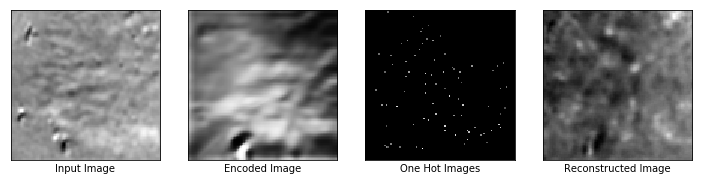

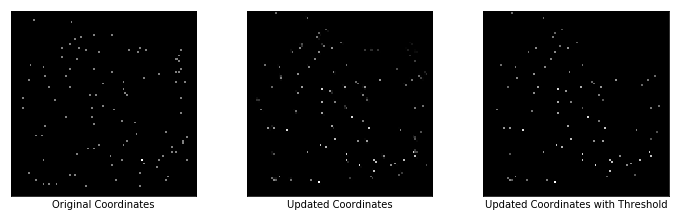

Reconstruction Loss: 0.011199556291103363
Regularizer Loss: 435610.0, Total Loss: 435610.0
Encoder Loss: 5.2756853103637695
Max Similarity scores: 0.9605476260185242
Updated Coordinates: [[[0.5363007 0.7814378]]]



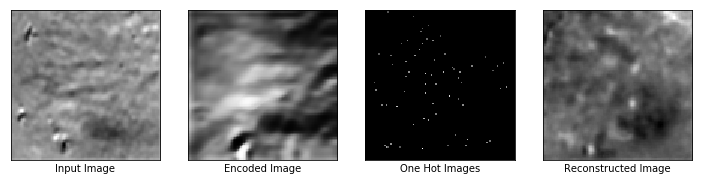

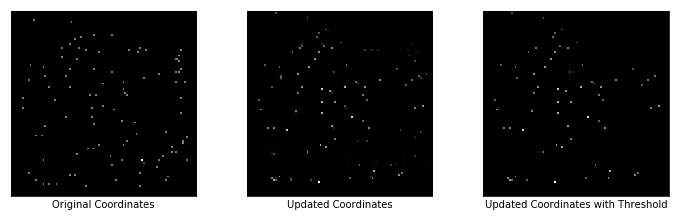

Reconstruction Loss: 0.014928005635738373
Regularizer Loss: 438944.25, Total Loss: 438944.25
Encoder Loss: 5.518184185028076
Max Similarity scores: 0.9565846920013428
Updated Coordinates: [[[0.53560215 0.7813028 ]]]



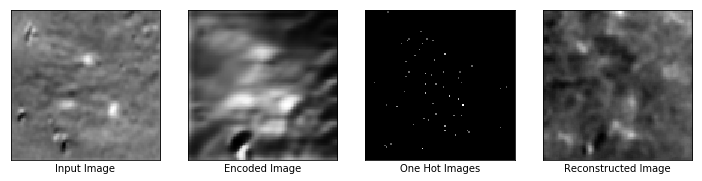

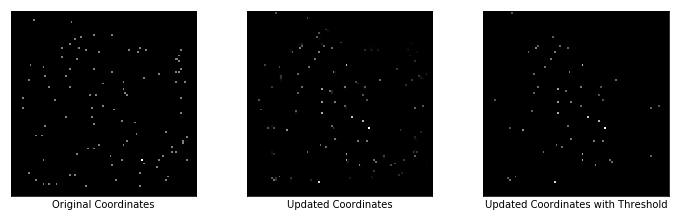

Reconstruction Loss: 0.013658776879310608
Regularizer Loss: 438053.90625, Total Loss: 438053.90625
Encoder Loss: 4.792046070098877
Max Similarity scores: 0.9675252437591553
Updated Coordinates: [[[0.53495204 0.7812217 ]]]



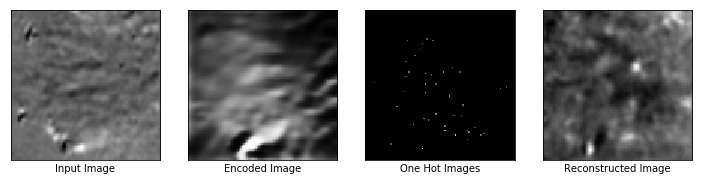

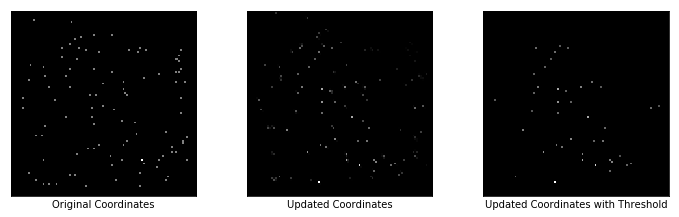

Reconstruction Loss: 0.011440214700996876
Regularizer Loss: 431927.28125, Total Loss: 431927.28125
Encoder Loss: 4.1891303062438965
Max Similarity scores: 0.9784624576568604
Updated Coordinates: [[[0.53434706 0.7811915 ]]]



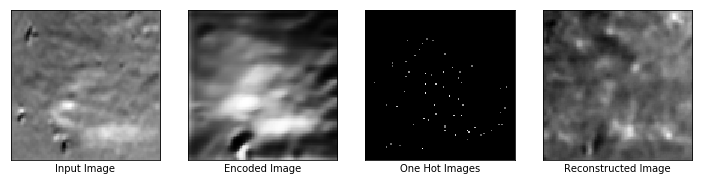

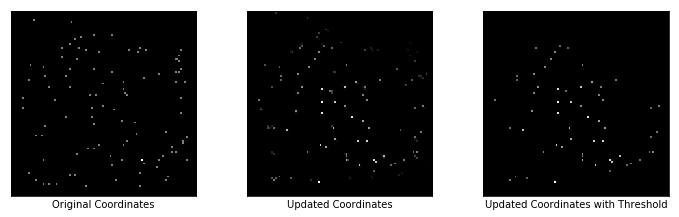

Reconstruction Loss: 0.012365037575364113
Regularizer Loss: 427484.375, Total Loss: 427484.375
Encoder Loss: 4.213955402374268
Max Similarity scores: 0.9256412982940674
Updated Coordinates: [[[0.5337024  0.78142965]]]



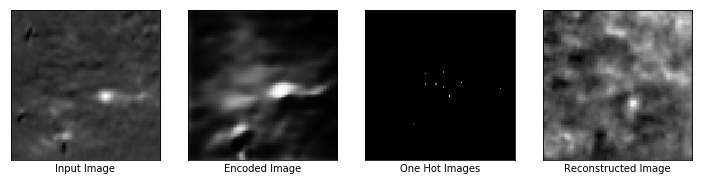

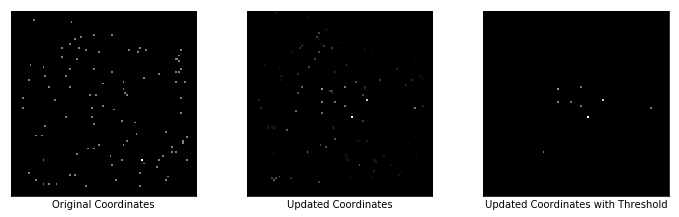

Reconstruction Loss: 0.013899157755076885
Regularizer Loss: 431056.59375, Total Loss: 431056.59375
Encoder Loss: 4.606431007385254
Max Similarity scores: 0.6960507035255432
Updated Coordinates: [[[0.53313255 0.7815834 ]]]



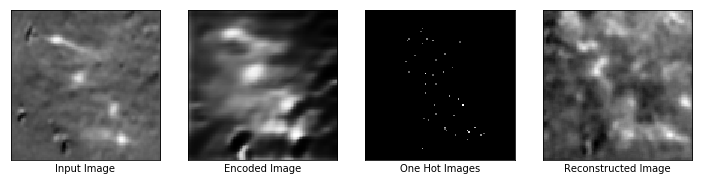

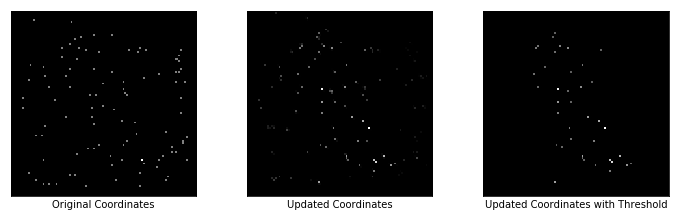

Reconstruction Loss: 0.011594529263675213
Regularizer Loss: 434864.6875, Total Loss: 434864.6875
Encoder Loss: 3.940235137939453
Max Similarity scores: 0.9122530817985535
Updated Coordinates: [[[0.5326017  0.78177404]]]



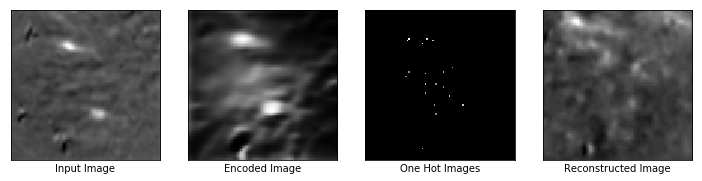

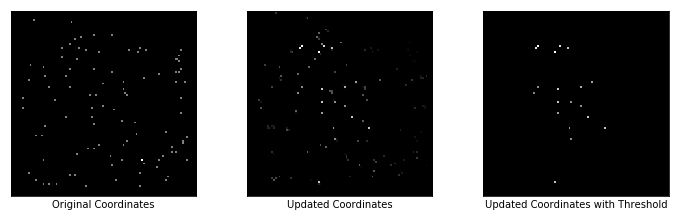

Reconstruction Loss: 0.0123304333537817
Regularizer Loss: 435790.6875, Total Loss: 435790.6875
Encoder Loss: 4.160594463348389
Max Similarity scores: 0.7963518500328064
Updated Coordinates: [[[0.53211445 0.78198737]]]



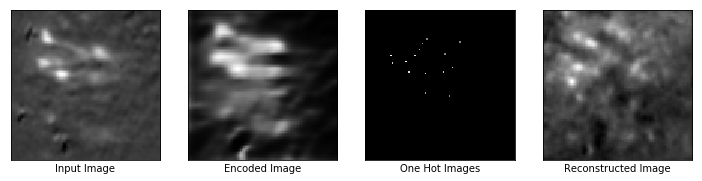

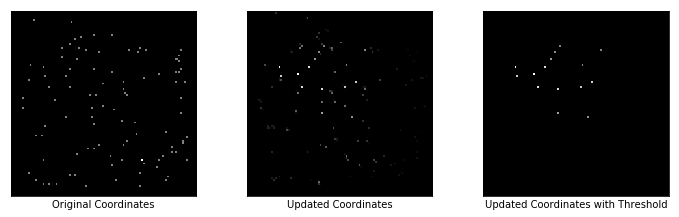

Reconstruction Loss: 0.009215795435011387
Regularizer Loss: 444176.78125, Total Loss: 444176.78125
Encoder Loss: 2.586838722229004
Max Similarity scores: 0.6669528484344482
Updated Coordinates: [[[0.5316614  0.78236055]]]



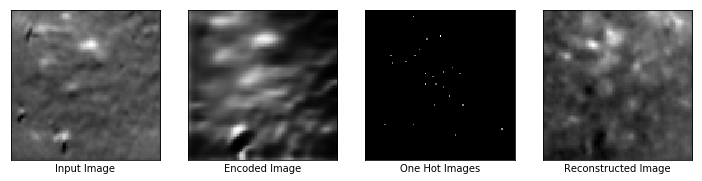

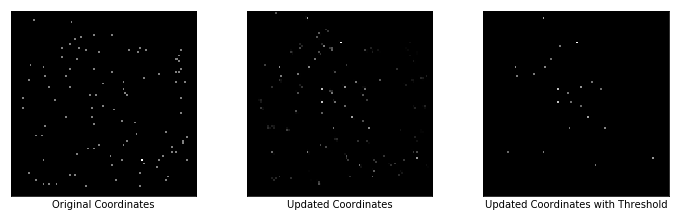

Reconstruction Loss: 0.012265307828783989
Regularizer Loss: 439238.78125, Total Loss: 439238.78125
Encoder Loss: 3.115926504135132
Max Similarity scores: 0.7721014022827148
Updated Coordinates: [[[0.53125507 0.78272057]]]



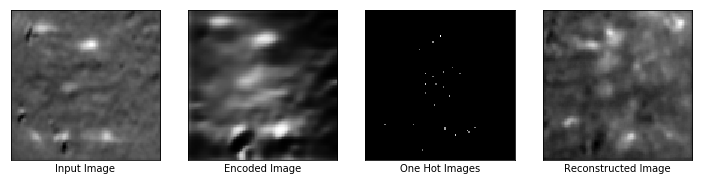

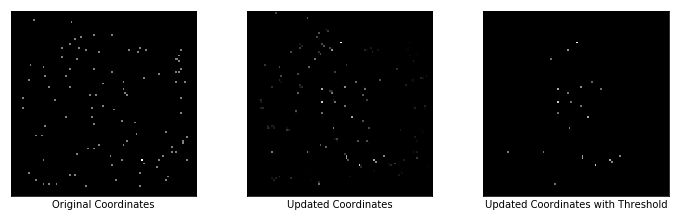

Reconstruction Loss: 0.010685603134334087
Regularizer Loss: 443247.96875, Total Loss: 443247.96875
Encoder Loss: 2.4010910987854004
Max Similarity scores: 0.8117920160293579
Updated Coordinates: [[[0.5309255  0.78303534]]]



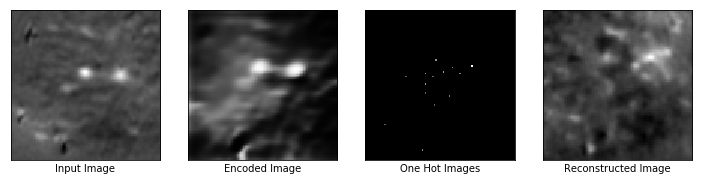

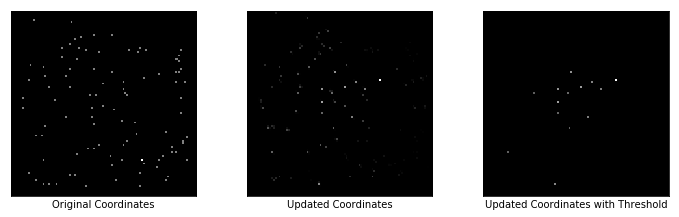

Reconstruction Loss: 0.014124399051070213
Regularizer Loss: 438310.25, Total Loss: 438310.25
Encoder Loss: 3.6455395221710205
Max Similarity scores: 0.820458173751831
Updated Coordinates: [[[0.53061265 0.78332484]]]



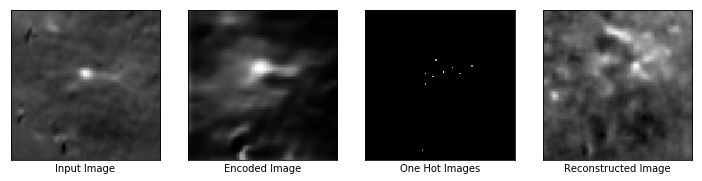

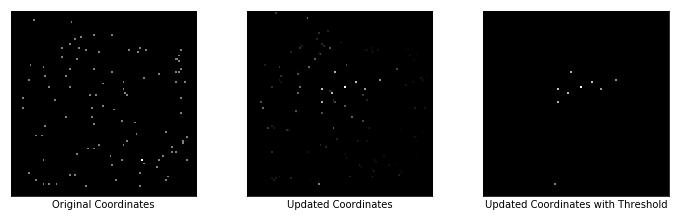

Reconstruction Loss: 0.01124059408903122
Regularizer Loss: 443794.0625, Total Loss: 443794.0625
Encoder Loss: 2.769716739654541
Max Similarity scores: 0.6393638849258423
Updated Coordinates: [[[0.53039324 0.7835633 ]]]



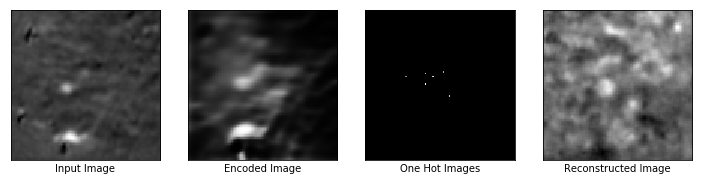

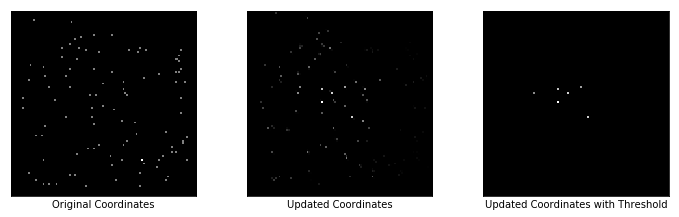

Reconstruction Loss: 0.01221782248467207
Regularizer Loss: 443333.96875, Total Loss: 443333.96875
Encoder Loss: 4.52426815032959
Max Similarity scores: 0.6025087237358093
Updated Coordinates: [[[0.5302239 0.7837683]]]



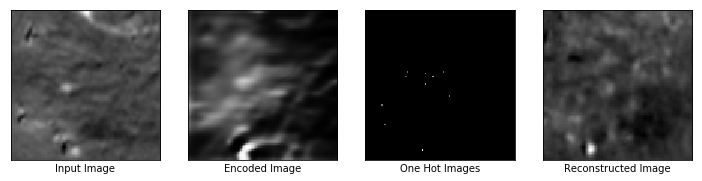

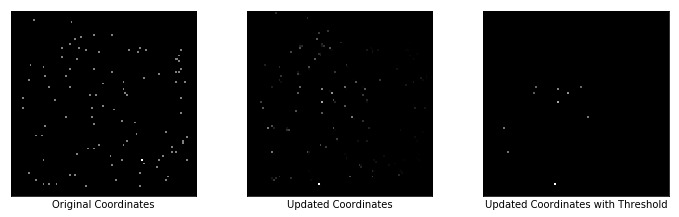

Reconstruction Loss: 0.012939413078129292
Regularizer Loss: 439729.40625, Total Loss: 439729.40625
Encoder Loss: 4.359843730926514
Max Similarity scores: 0.8938551545143127
Updated Coordinates: [[[0.5301801  0.78391474]]]



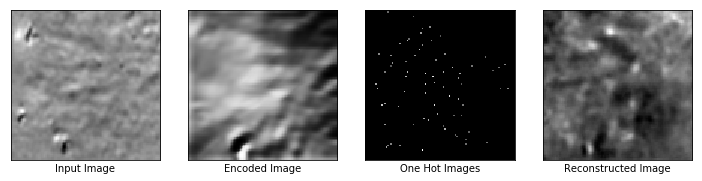

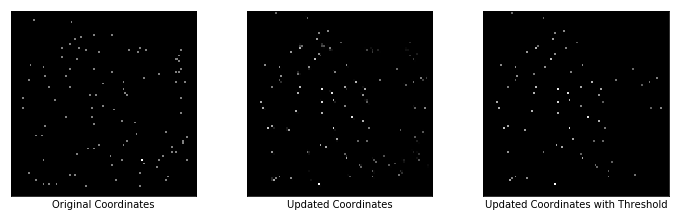

Reconstruction Loss: 0.010541663505136967
Regularizer Loss: 444011.6875, Total Loss: 444011.6875
Encoder Loss: 4.118866443634033
Max Similarity scores: 0.889141321182251
Updated Coordinates: [[[0.53023183 0.7840179 ]]]



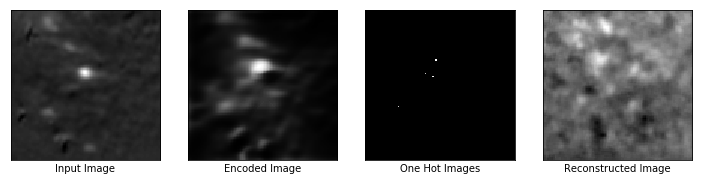

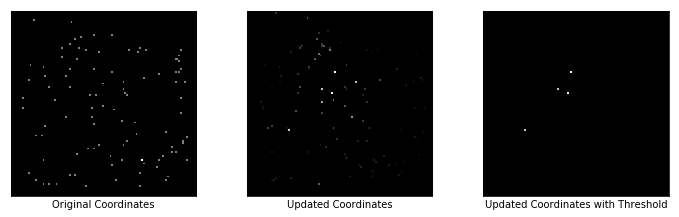

Reconstruction Loss: 0.00711856922134757
Regularizer Loss: 447892.1875, Total Loss: 447892.1875
Encoder Loss: 1.825893759727478
Max Similarity scores: 0.48477116227149963
Updated Coordinates: [[[0.5304022 0.7840664]]]



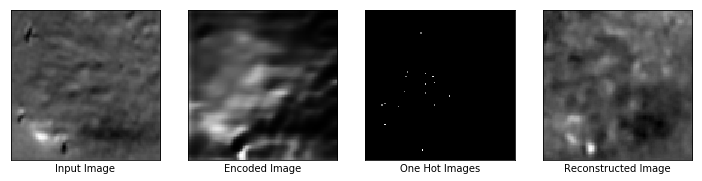

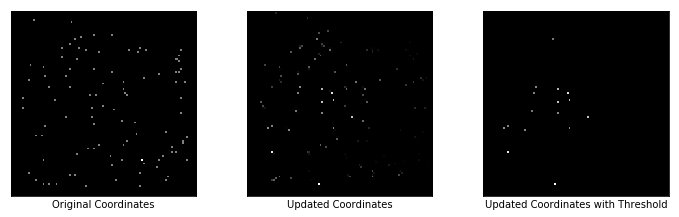

Reconstruction Loss: 0.011510578915476799
Regularizer Loss: 436787.875, Total Loss: 436787.875
Encoder Loss: 3.0293827056884766
Max Similarity scores: 0.6812363266944885
Updated Coordinates: [[[0.53060395 0.78409237]]]



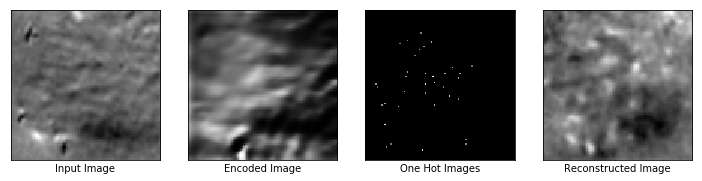

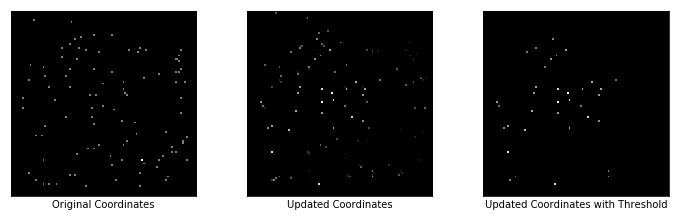

Reconstruction Loss: 0.010369974188506603
Regularizer Loss: 440063.6875, Total Loss: 440063.6875
Encoder Loss: 3.409374237060547
Max Similarity scores: 0.7272679805755615
Updated Coordinates: [[[0.5303855 0.7842718]]]



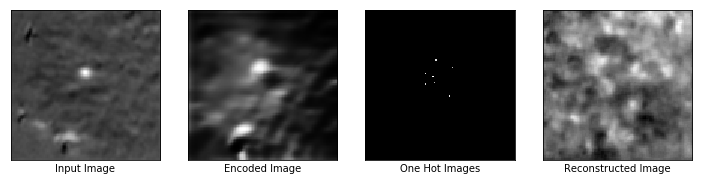

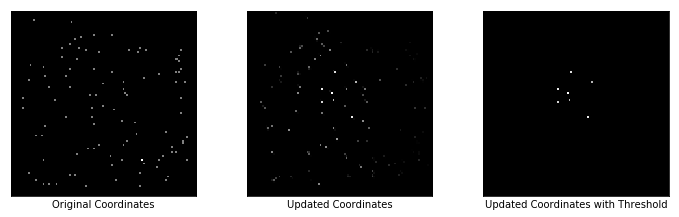

Reconstruction Loss: 0.0071120485663414
Regularizer Loss: 442680.65625, Total Loss: 442680.65625
Encoder Loss: 2.3635284900665283
Max Similarity scores: 0.5339275598526001
Updated Coordinates: [[[0.5301342 0.7844553]]]



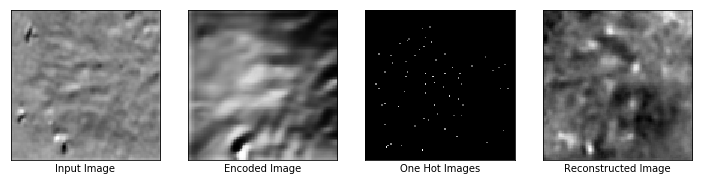

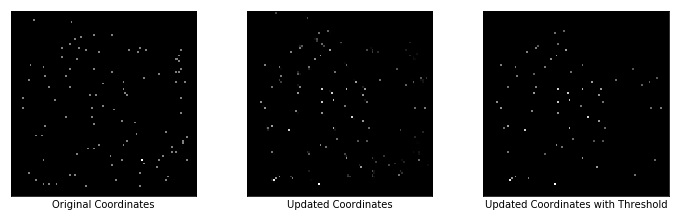

Reconstruction Loss: 0.012402006424963474
Regularizer Loss: 436512.46875, Total Loss: 436512.46875
Encoder Loss: 5.489663600921631
Max Similarity scores: 0.9435756206512451
Updated Coordinates: [[[0.52990496 0.78466487]]]



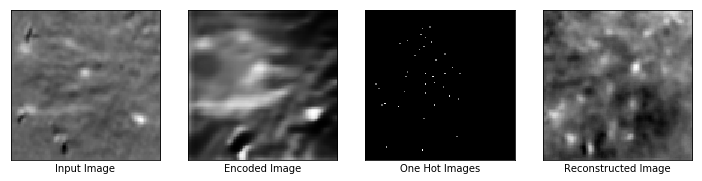

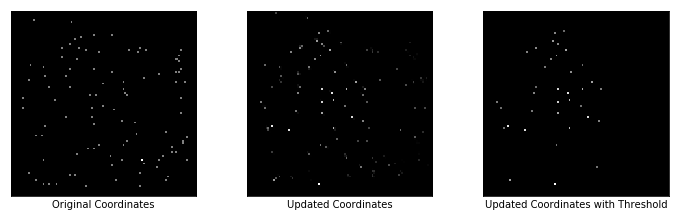

Reconstruction Loss: 0.010882902890443802
Regularizer Loss: 438847.6875, Total Loss: 438847.6875
Encoder Loss: 4.218654632568359
Max Similarity scores: 0.7313776016235352
Updated Coordinates: [[[0.5296749  0.78511816]]]



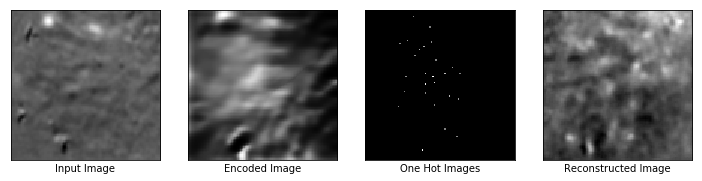

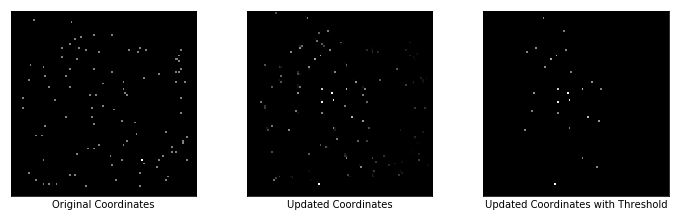

Reconstruction Loss: 0.011389993131160736
Regularizer Loss: 441893.78125, Total Loss: 441893.78125
Encoder Loss: 5.109737873077393
Max Similarity scores: 0.6595748066902161
Updated Coordinates: [[[0.5294594 0.7856825]]]



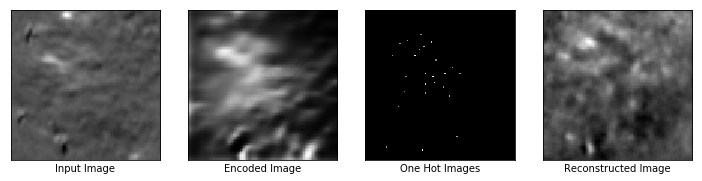

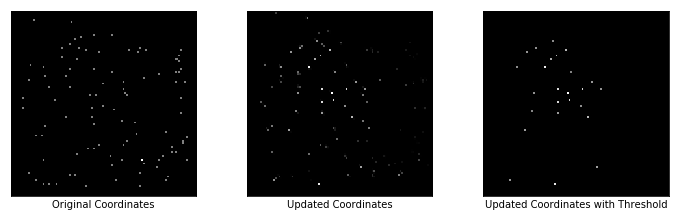

Reconstruction Loss: 0.008275513537228107
Regularizer Loss: 439803.28125, Total Loss: 439803.28125
Encoder Loss: 3.3562257289886475
Max Similarity scores: 0.6408042907714844
Updated Coordinates: [[[0.529223  0.7863201]]]



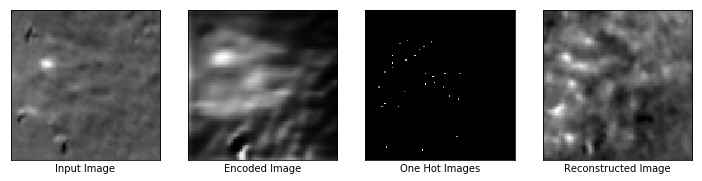

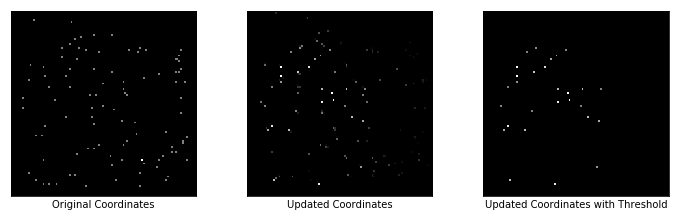

Reconstruction Loss: 0.008339730091392994
Regularizer Loss: 437949.6875, Total Loss: 437949.6875
Encoder Loss: 4.113451957702637
Max Similarity scores: 0.7022614479064941
Updated Coordinates: [[[0.528979  0.7869487]]]



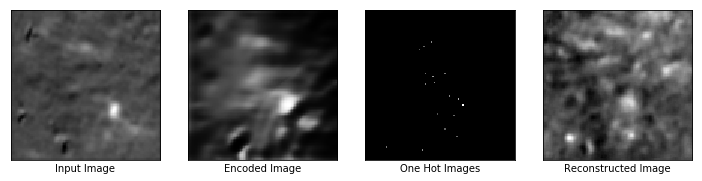

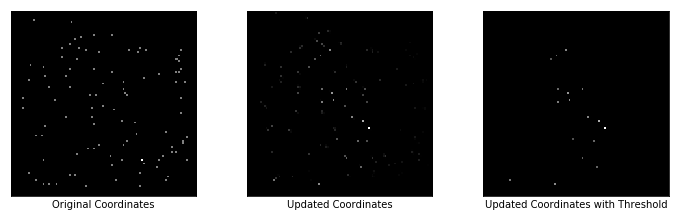

Reconstruction Loss: 0.011612010188400745
Regularizer Loss: 439835.5, Total Loss: 439835.5
Encoder Loss: 4.818363666534424
Max Similarity scores: 0.9614278674125671
Updated Coordinates: [[[0.5287535 0.7875321]]]



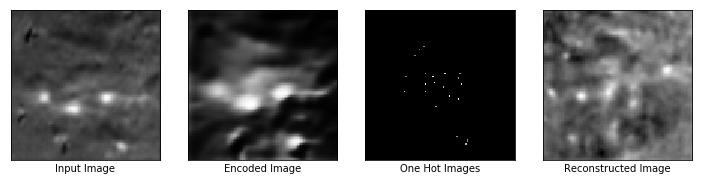

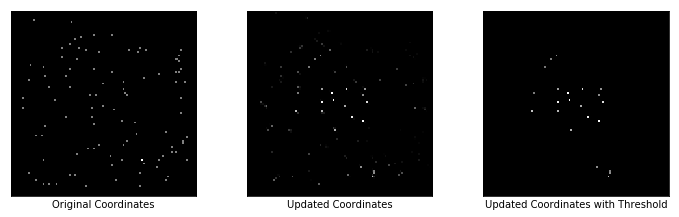

Reconstruction Loss: 0.009940085001289845
Regularizer Loss: 434740.5, Total Loss: 434740.5
Encoder Loss: 3.0963406562805176
Max Similarity scores: 0.7917546629905701
Updated Coordinates: [[[0.5285391 0.7880707]]]



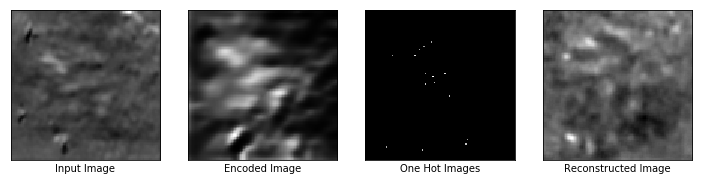

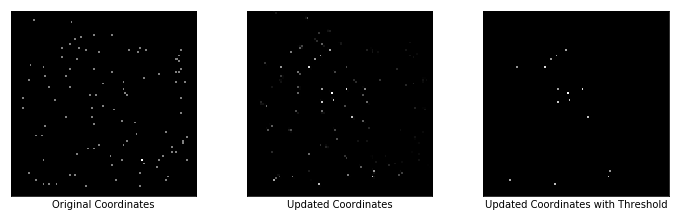

Reconstruction Loss: 0.011641502380371094
Regularizer Loss: 434897.75, Total Loss: 434897.75
Encoder Loss: 4.161685943603516
Max Similarity scores: 0.6013295650482178
Updated Coordinates: [[[0.528339  0.7885579]]]



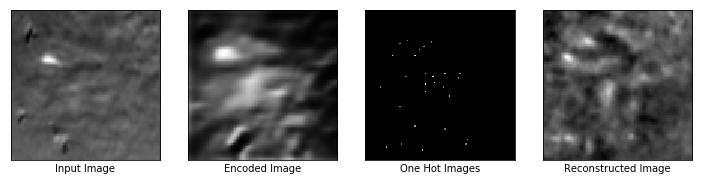

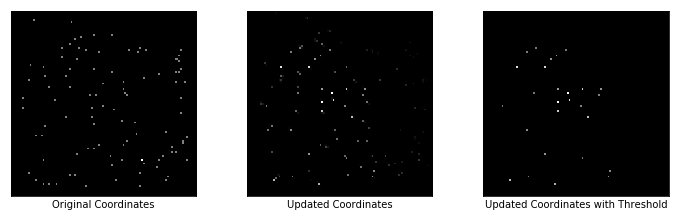

Reconstruction Loss: 0.006928491406142712
Regularizer Loss: 435618.40625, Total Loss: 435618.40625
Encoder Loss: 2.5943610668182373
Max Similarity scores: 0.6914388537406921
Updated Coordinates: [[[0.5281544 0.788993 ]]]



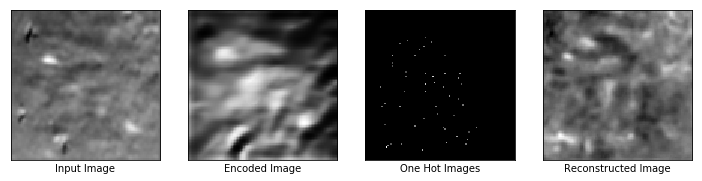

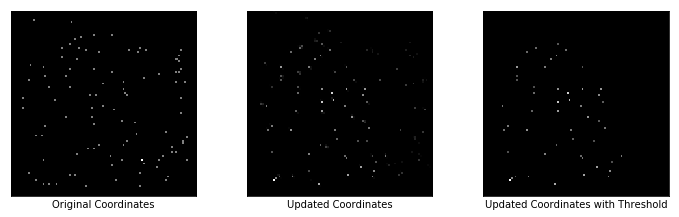

Reconstruction Loss: 0.012810016050934792
Regularizer Loss: 425869.25, Total Loss: 425869.25
Encoder Loss: 5.4712629318237305
Max Similarity scores: 0.8224707841873169
Updated Coordinates: [[[0.52796876 0.7893901 ]]]



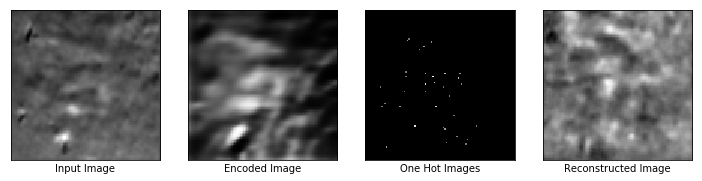

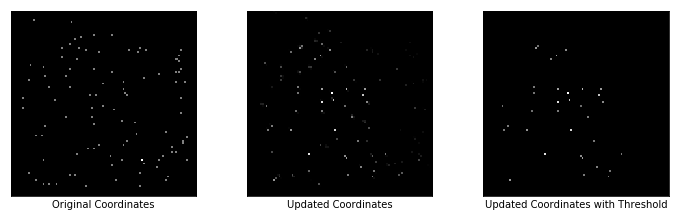

Reconstruction Loss: 0.011059456504881382
Regularizer Loss: 427003.71875, Total Loss: 427003.71875
Encoder Loss: 4.174043655395508
Max Similarity scores: 0.7249665260314941
Updated Coordinates: [[[0.5277949  0.78975326]]]



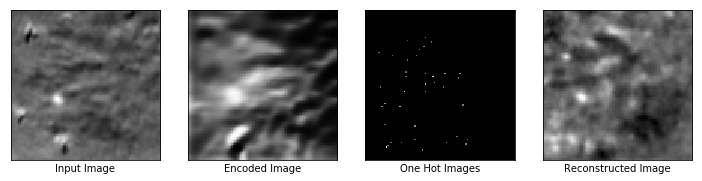

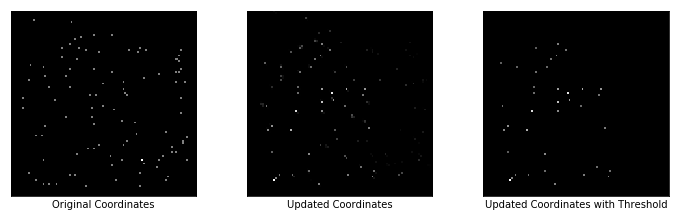

Reconstruction Loss: 0.010932900942862034
Regularizer Loss: 433550.0, Total Loss: 433550.0
Encoder Loss: 3.980742931365967
Max Similarity scores: 0.7969950437545776
Updated Coordinates: [[[0.527642   0.79008114]]]



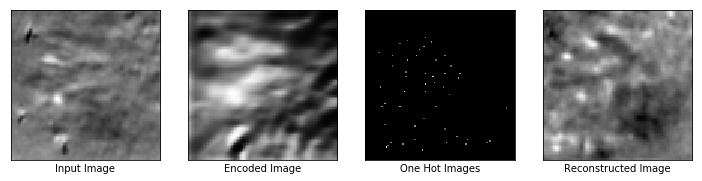

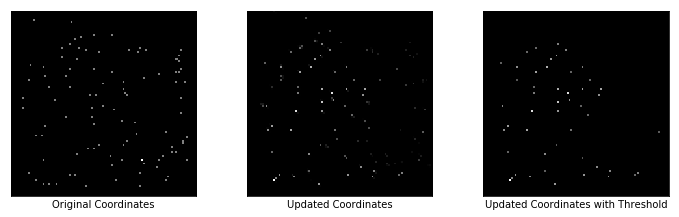

Reconstruction Loss: 0.010946976020932198
Regularizer Loss: 436261.5625, Total Loss: 436261.5625
Encoder Loss: 4.736126899719238
Max Similarity scores: 0.8371533751487732
Updated Coordinates: [[[0.527501   0.79037744]]]



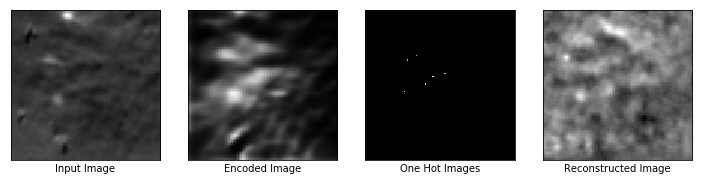

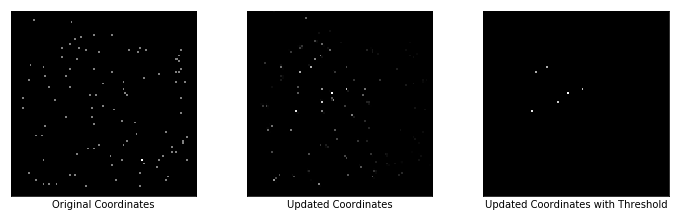

Reconstruction Loss: 0.008171736262738705
Regularizer Loss: 437465.3125, Total Loss: 437465.3125
Encoder Loss: 3.6199772357940674
Max Similarity scores: 0.4676218330860138
Updated Coordinates: [[[0.5273768 0.7906438]]]



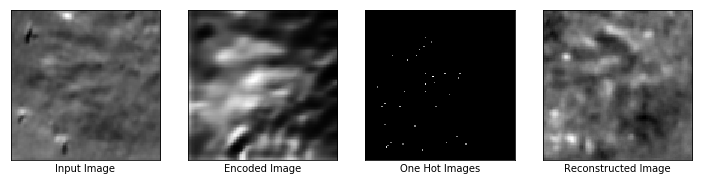

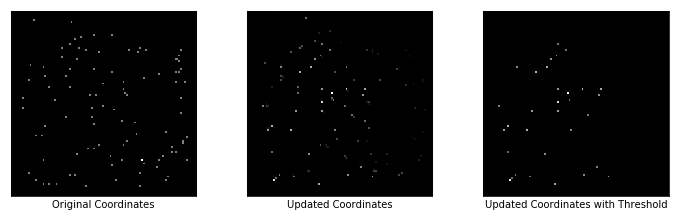

Reconstruction Loss: 0.011028490029275417
Regularizer Loss: 434465.5, Total Loss: 434465.5
Encoder Loss: 5.23668909072876
Max Similarity scores: 0.7343568205833435
Updated Coordinates: [[[0.5272655 0.7908833]]]



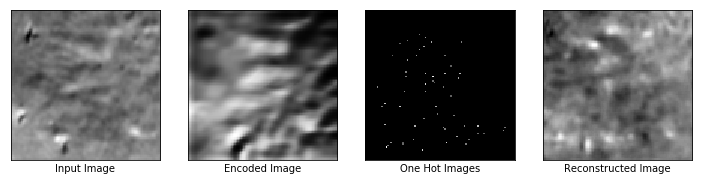

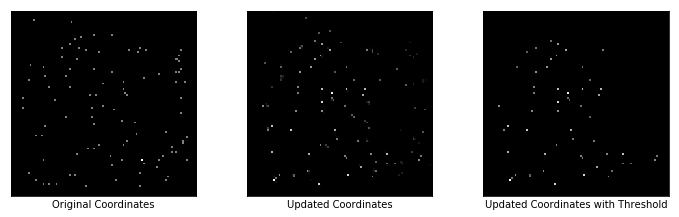

Reconstruction Loss: 0.011152052320539951
Regularizer Loss: 434868.625, Total Loss: 434868.625
Encoder Loss: 5.1252031326293945
Max Similarity scores: 0.8181698322296143
Updated Coordinates: [[[0.52716595 0.7910975 ]]]



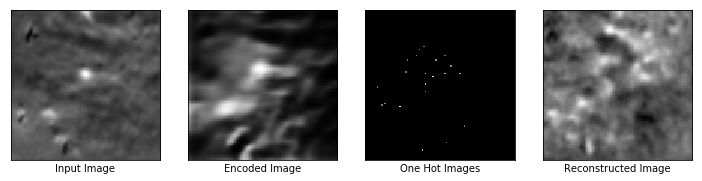

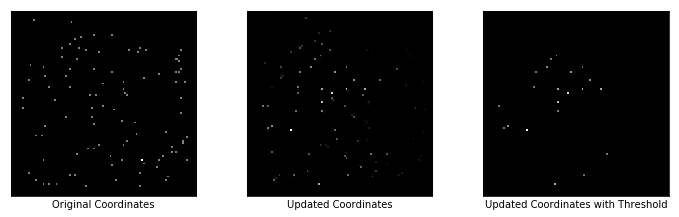

Reconstruction Loss: 0.0076448265463113785
Regularizer Loss: 443755.1875, Total Loss: 443755.1875
Encoder Loss: 2.126399278640747
Max Similarity scores: 0.8113288283348083
Updated Coordinates: [[[0.527077  0.7912922]]]



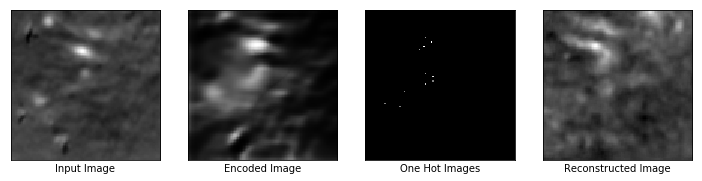

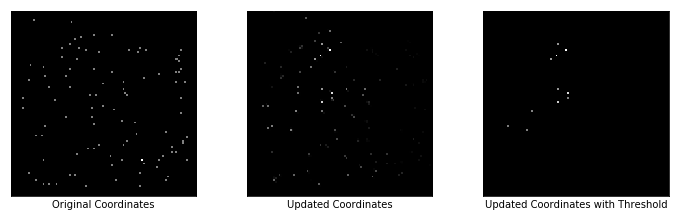

Reconstruction Loss: 0.009923887439072132
Regularizer Loss: 437224.875, Total Loss: 437224.875
Encoder Loss: 2.9934215545654297
Max Similarity scores: 0.8192713856697083
Updated Coordinates: [[[0.5269971 0.7914663]]]



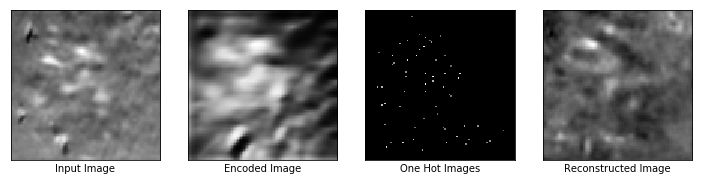

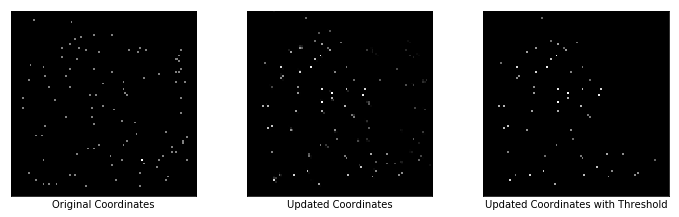

Reconstruction Loss: 0.009980068542063236
Regularizer Loss: 437825.65625, Total Loss: 437825.65625
Encoder Loss: 3.420600414276123
Max Similarity scores: 0.853524386882782
Updated Coordinates: [[[0.5269281 0.7916247]]]



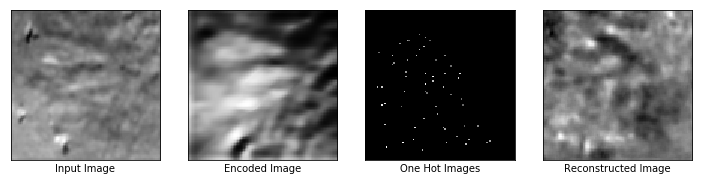

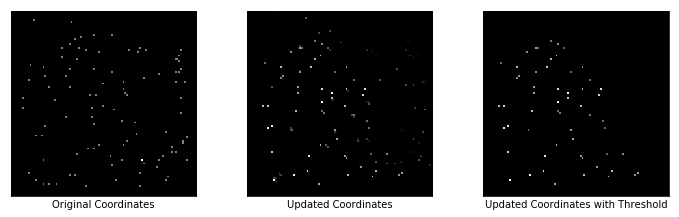

Reconstruction Loss: 0.013091995380818844
Regularizer Loss: 429894.0, Total Loss: 429894.0
Encoder Loss: 6.281842231750488
Max Similarity scores: 0.8599100708961487
Updated Coordinates: [[[0.52686757 0.7917628 ]]]



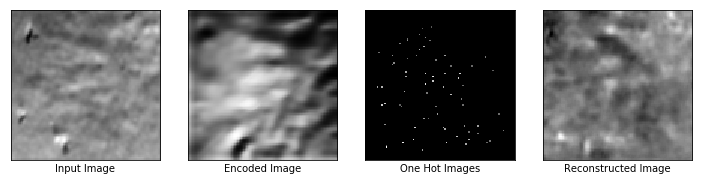

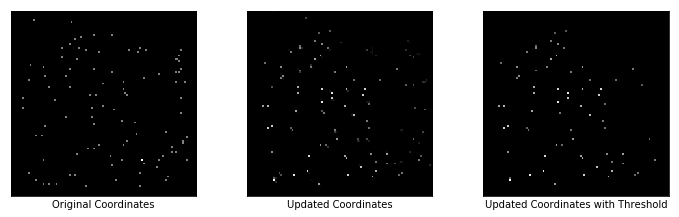

Reconstruction Loss: 0.012111024931073189
Regularizer Loss: 429264.59375, Total Loss: 429264.59375
Encoder Loss: 6.108194351196289
Max Similarity scores: 0.8595051765441895
Updated Coordinates: [[[0.52681494 0.79188275]]]



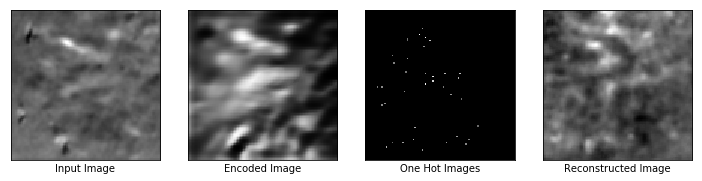

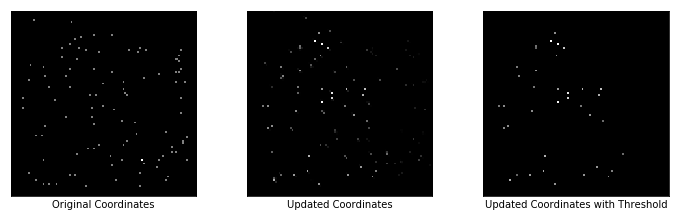

Reconstruction Loss: 0.0120433010160923
Regularizer Loss: 435963.5, Total Loss: 435963.5
Encoder Loss: 4.824146270751953
Max Similarity scores: 0.8025335073471069
Updated Coordinates: [[[0.52677304 0.7919762 ]]]



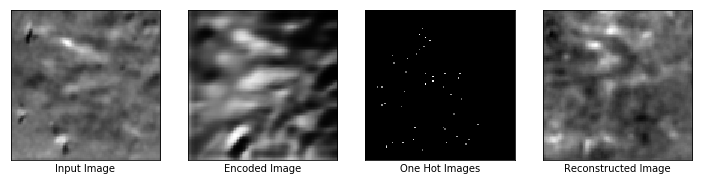

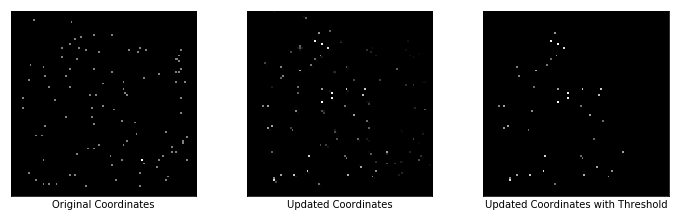

Reconstruction Loss: 0.010914857499301434
Regularizer Loss: 438169.96875, Total Loss: 438169.96875
Encoder Loss: 3.450291395187378
Max Similarity scores: 0.8136804103851318
Updated Coordinates: [[[0.52674633 0.7920608 ]]]



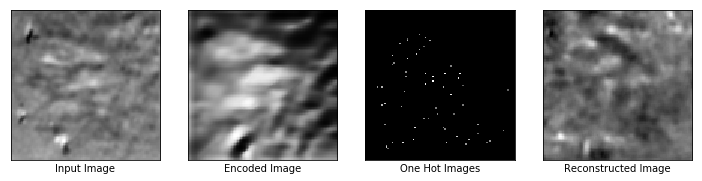

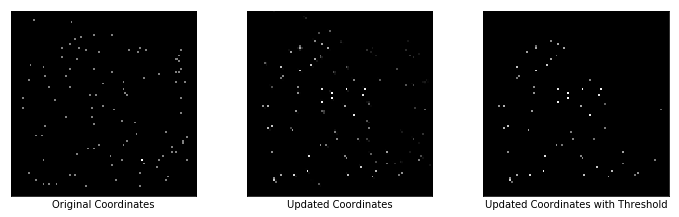

Reconstruction Loss: 0.014363099820911884
Regularizer Loss: 431215.40625, Total Loss: 431215.40625
Encoder Loss: 6.002589225769043
Max Similarity scores: 0.8756164908409119
Updated Coordinates: [[[0.5267243  0.79213136]]]



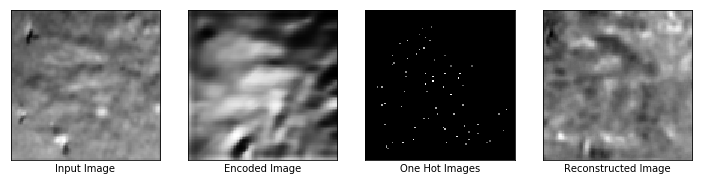

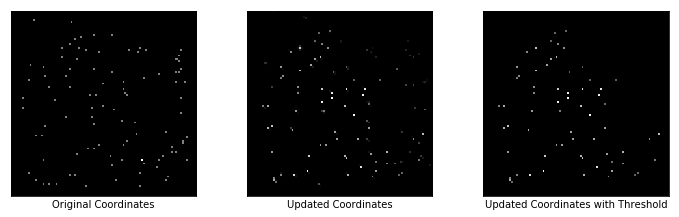

Reconstruction Loss: 0.010880300775170326
Regularizer Loss: 428078.25, Total Loss: 428078.25
Encoder Loss: 4.619253158569336
Max Similarity scores: 0.8605676293373108
Updated Coordinates: [[[0.52670383 0.7921788 ]]]



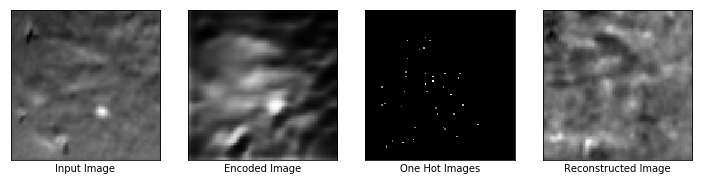

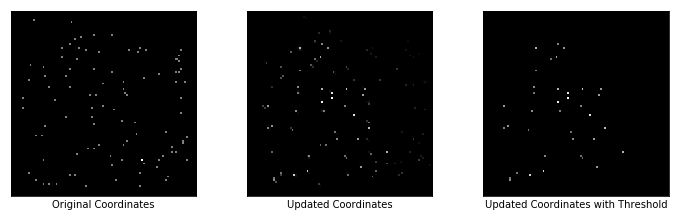

Reconstruction Loss: 0.012898708693683147
Regularizer Loss: 426577.8125, Total Loss: 426577.8125
Encoder Loss: 5.314563751220703
Max Similarity scores: 0.7265211343765259
Updated Coordinates: [[[0.52668154 0.7922093 ]]]



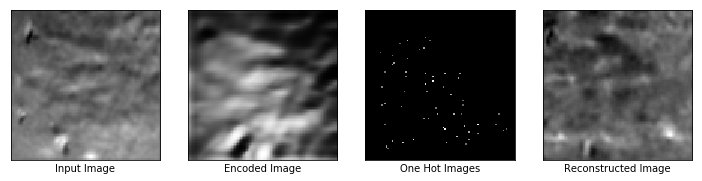

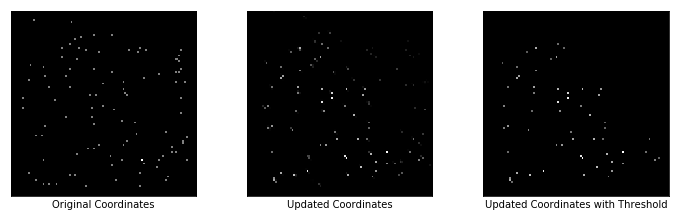

Reconstruction Loss: 0.012164180167019367
Regularizer Loss: 425703.40625, Total Loss: 425703.40625
Encoder Loss: 4.777846813201904
Max Similarity scores: 0.8500436544418335
Updated Coordinates: [[[0.52666324 0.7922243 ]]]



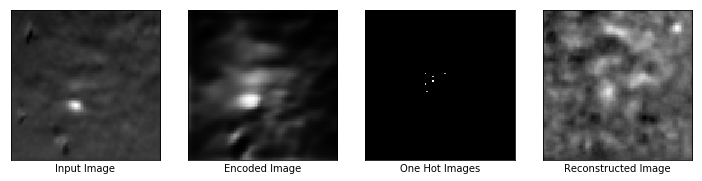

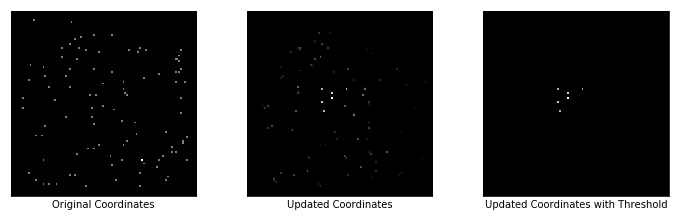

Reconstruction Loss: 0.009567485190927982
Regularizer Loss: 430365.0, Total Loss: 430365.0
Encoder Loss: 3.929591417312622
Max Similarity scores: 0.6210102438926697
Updated Coordinates: [[[0.5266744  0.79218274]]]



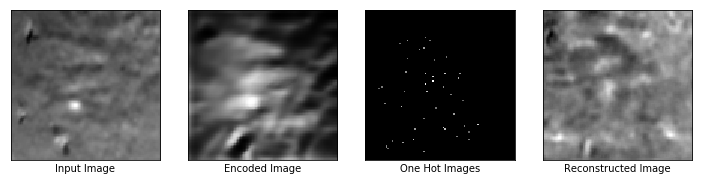

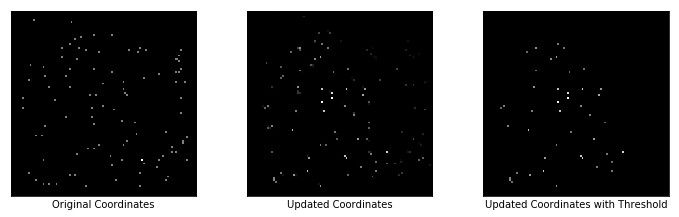

Reconstruction Loss: 0.007283587008714676
Regularizer Loss: 430472.09375, Total Loss: 430472.09375
Encoder Loss: 3.2258660793304443
Max Similarity scores: 0.7868740558624268
Updated Coordinates: [[[0.52669865 0.7921047 ]]]



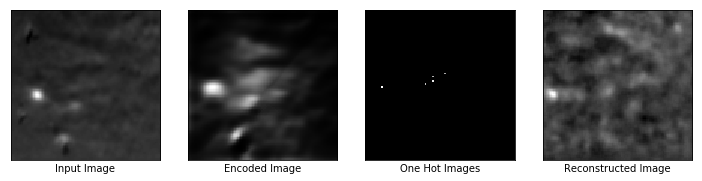

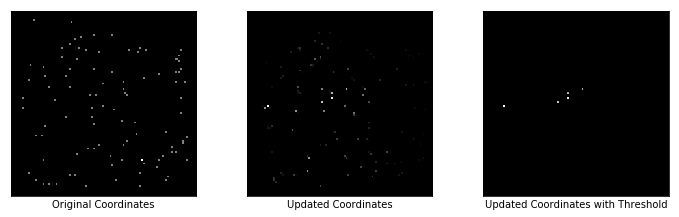

Reconstruction Loss: 0.00668616546317935
Regularizer Loss: 432269.8125, Total Loss: 432269.8125
Encoder Loss: 3.0085957050323486
Max Similarity scores: 0.5337187647819519
Updated Coordinates: [[[0.5267351  0.79198885]]]



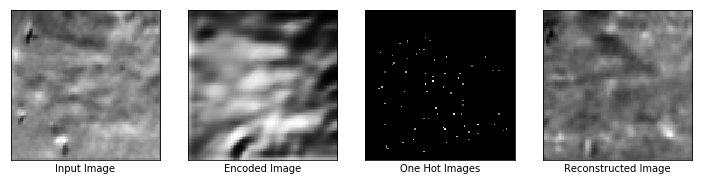

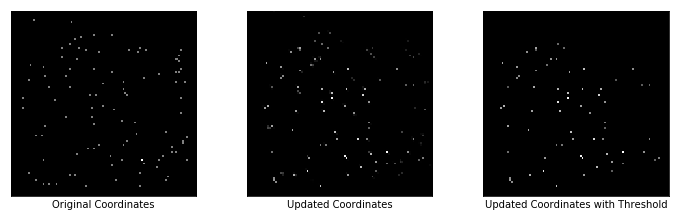

Reconstruction Loss: 0.010944296605885029
Regularizer Loss: 428468.6875, Total Loss: 428468.6875
Encoder Loss: 4.915462493896484
Max Similarity scores: 0.9338274598121643
Updated Coordinates: [[[0.5267752 0.7918532]]]



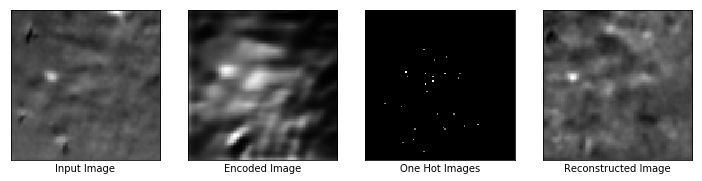

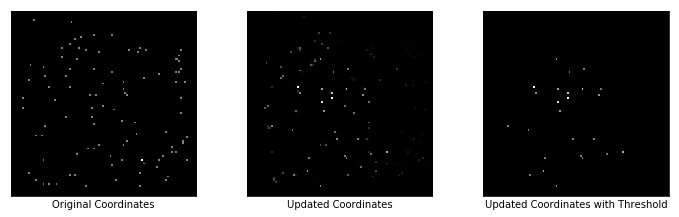

Reconstruction Loss: 0.006573802325874567
Regularizer Loss: 433354.5, Total Loss: 433354.5
Encoder Loss: 3.2472574710845947
Max Similarity scores: 0.7097988724708557
Updated Coordinates: [[[0.52681965 0.7917288 ]]]



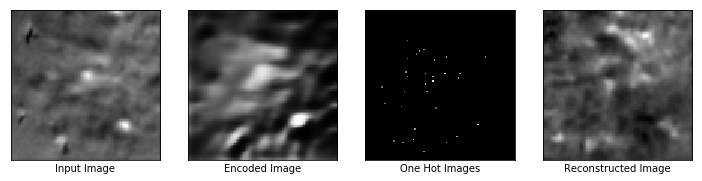

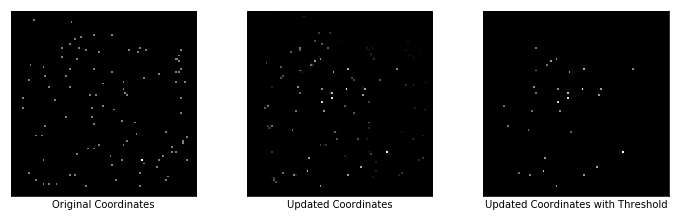

Reconstruction Loss: 0.011091162450611591
Regularizer Loss: 430760.84375, Total Loss: 430760.84375
Encoder Loss: 5.15187406539917
Max Similarity scores: 0.8342707753181458
Updated Coordinates: [[[0.5268661 0.791607 ]]]



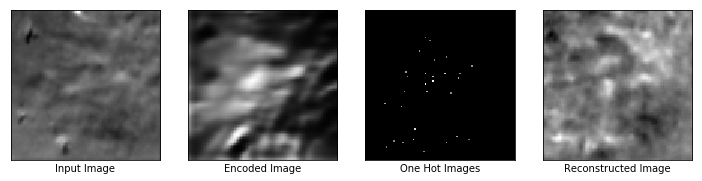

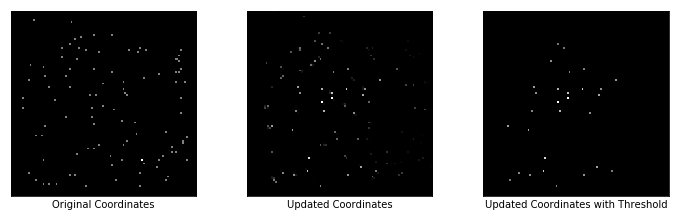

Reconstruction Loss: 0.008816448971629143
Regularizer Loss: 437012.21875, Total Loss: 437012.21875
Encoder Loss: 3.5426859855651855
Max Similarity scores: 0.7291181087493896
Updated Coordinates: [[[0.5269151  0.79149294]]]



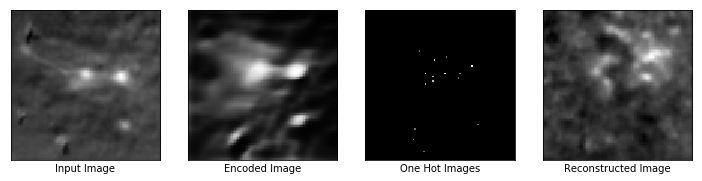

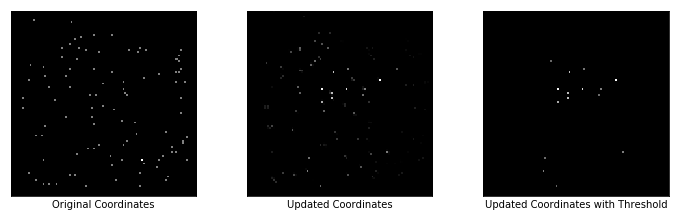

Reconstruction Loss: 0.0098355608060956
Regularizer Loss: 435107.75, Total Loss: 435107.75
Encoder Loss: 3.6755621433258057
Max Similarity scores: 0.808721661567688
Updated Coordinates: [[[0.5269623 0.7913853]]]



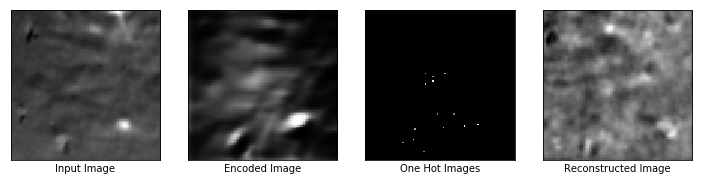

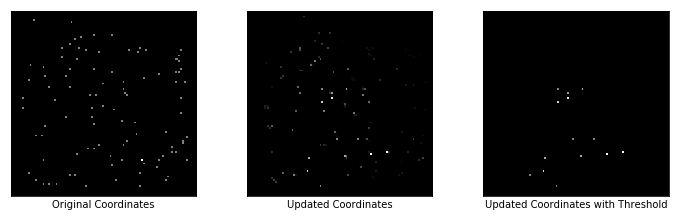

Reconstruction Loss: 0.00757210236042738
Regularizer Loss: 429538.03125, Total Loss: 429538.03125
Encoder Loss: 3.642369508743286
Max Similarity scores: 0.776378870010376
Updated Coordinates: [[[0.52700734 0.79127824]]]



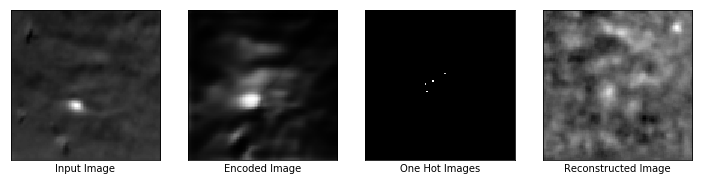

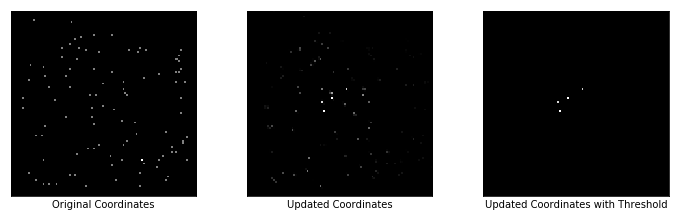

Reconstruction Loss: 0.00680318521335721
Regularizer Loss: 434232.09375, Total Loss: 434232.09375
Encoder Loss: 2.5647711753845215
Max Similarity scores: 0.5001340508460999
Updated Coordinates: [[[0.52704966 0.79117924]]]



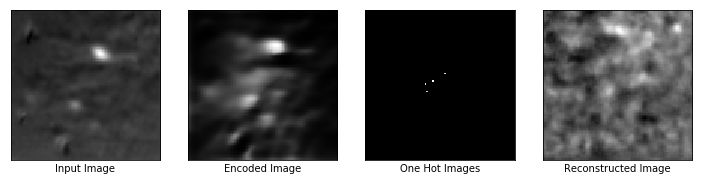

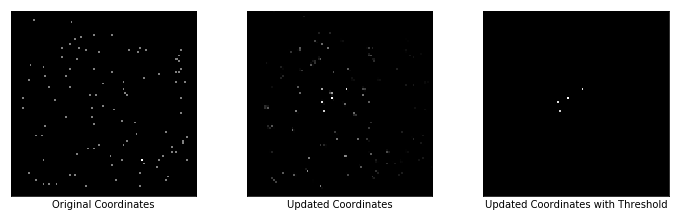

Reconstruction Loss: 0.006874760612845421
Regularizer Loss: 434144.375, Total Loss: 434144.375
Encoder Loss: 2.8365235328674316
Max Similarity scores: 0.47375229001045227
Updated Coordinates: [[[0.5270872 0.7910853]]]



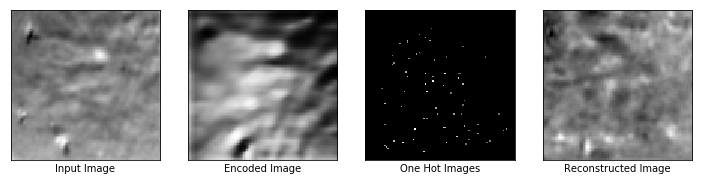

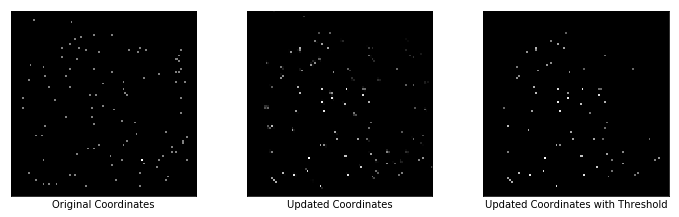

Reconstruction Loss: 0.011460107751190662
Regularizer Loss: 426317.46875, Total Loss: 426317.46875
Encoder Loss: 6.110593795776367
Max Similarity scores: 0.9170495867729187
Updated Coordinates: [[[0.52711326 0.7909724 ]]]



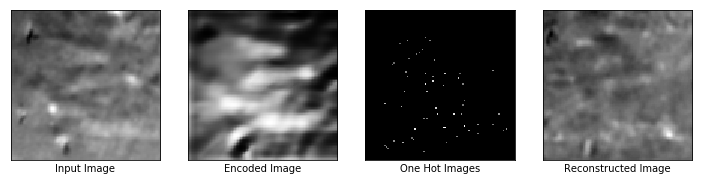

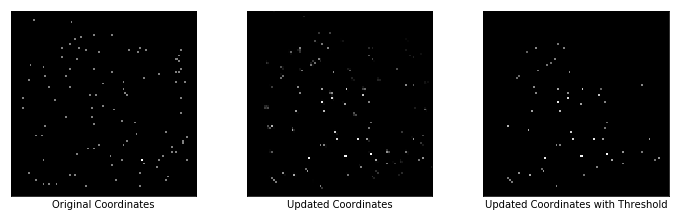

Reconstruction Loss: 0.010614031925797462
Regularizer Loss: 424366.6875, Total Loss: 424366.6875
Encoder Loss: 4.453609466552734
Max Similarity scores: 0.8722073435783386
Updated Coordinates: [[[0.527134  0.7908501]]]



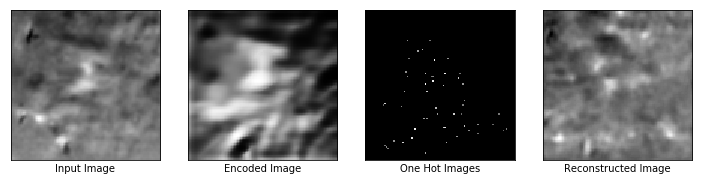

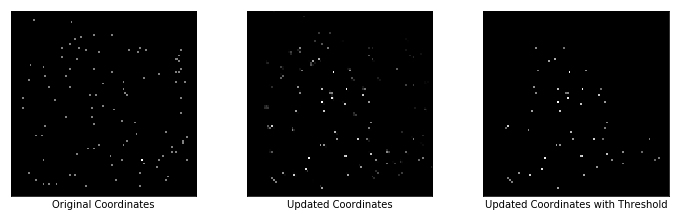

Reconstruction Loss: 0.01387261226773262
Regularizer Loss: 426407.125, Total Loss: 426407.125
Encoder Loss: 5.110541343688965
Max Similarity scores: 0.9352409839630127
Updated Coordinates: [[[0.5271544 0.7907386]]]



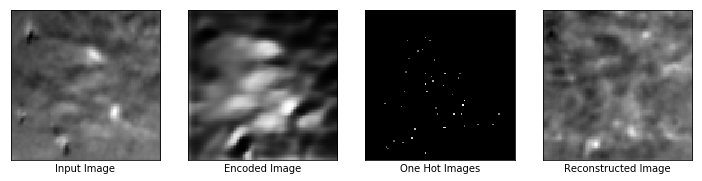

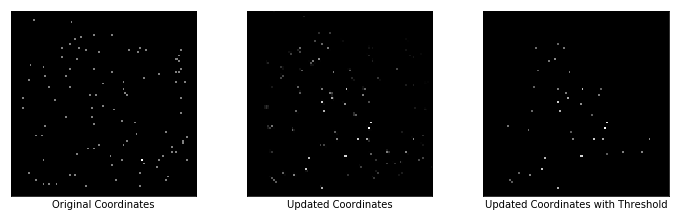

Reconstruction Loss: 0.014034426771104336
Regularizer Loss: 425206.78125, Total Loss: 425206.78125
Encoder Loss: 5.092089653015137
Max Similarity scores: 0.9171000719070435
Updated Coordinates: [[[0.5271762 0.7906399]]]



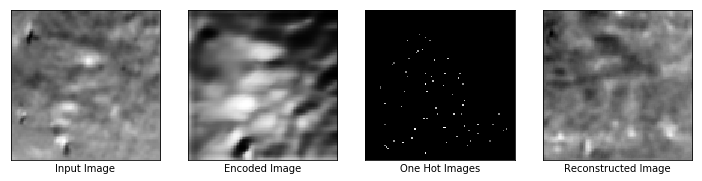

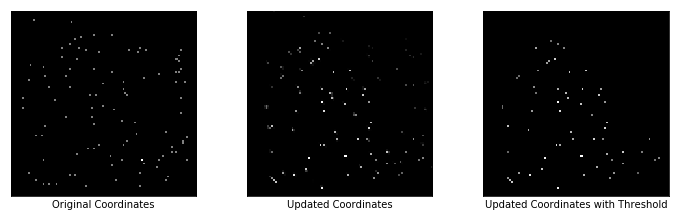

Reconstruction Loss: 0.014419732615351677
Regularizer Loss: 426191.3125, Total Loss: 426191.3125
Encoder Loss: 5.98585319519043
Max Similarity scores: 0.9302416443824768
Updated Coordinates: [[[0.5271988  0.79055595]]]



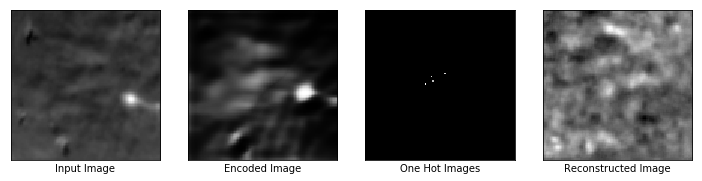

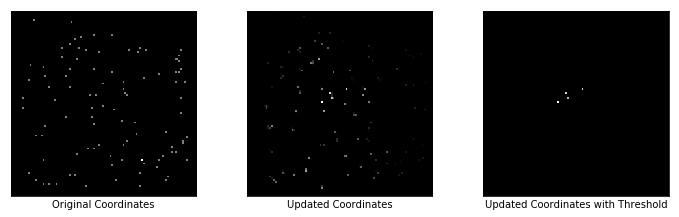

Reconstruction Loss: 0.007592550478875637
Regularizer Loss: 432004.6875, Total Loss: 432004.6875
Encoder Loss: 2.7449028491973877
Max Similarity scores: 0.5627310276031494
Updated Coordinates: [[[0.52722067 0.7904791 ]]]



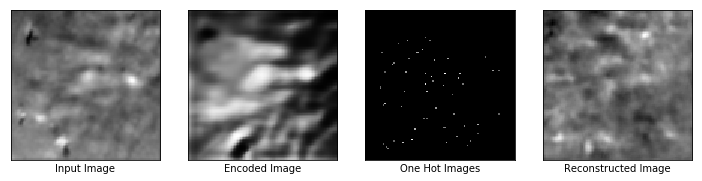

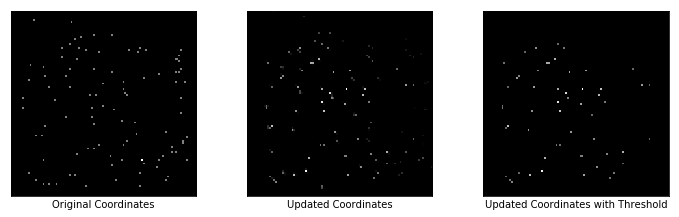

Reconstruction Loss: 0.011893213726580143
Regularizer Loss: 431181.9375, Total Loss: 431181.9375
Encoder Loss: 4.9083685874938965
Max Similarity scores: 0.8976461291313171
Updated Coordinates: [[[0.52724    0.79040504]]]



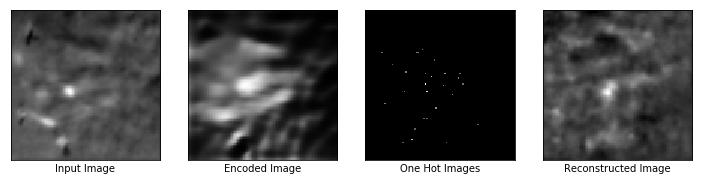

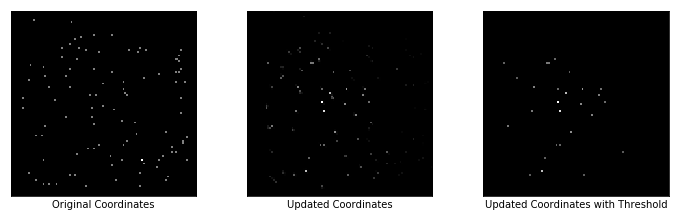

Reconstruction Loss: 0.010453867726027966
Regularizer Loss: 430893.1875, Total Loss: 430893.1875
Encoder Loss: 4.8728437423706055
Max Similarity scores: 0.9084234237670898
Updated Coordinates: [[[0.52726054 0.79033685]]]



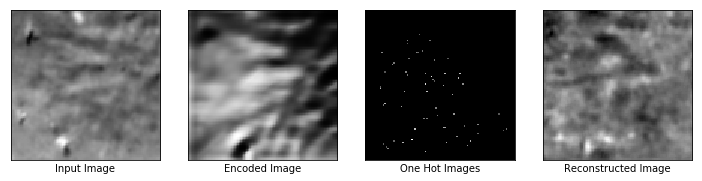

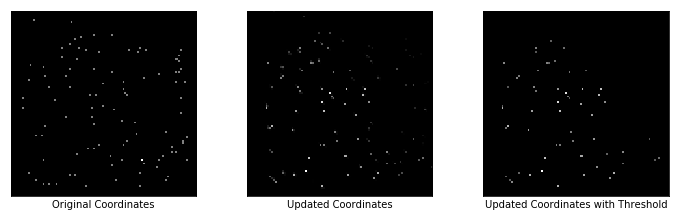

Reconstruction Loss: 0.010168394073843956
Regularizer Loss: 432303.78125, Total Loss: 432303.78125
Encoder Loss: 4.936323642730713
Max Similarity scores: 0.9206777811050415
Updated Coordinates: [[[0.5272804 0.7902767]]]



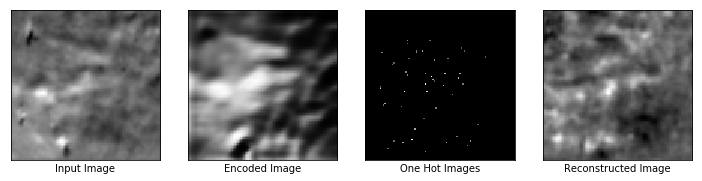

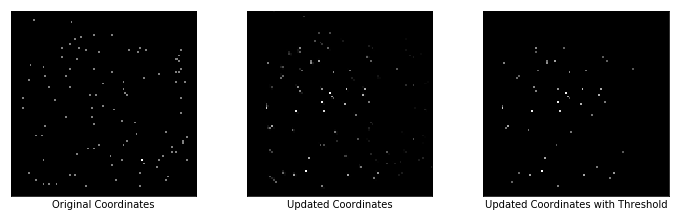

Reconstruction Loss: 0.010013392195105553
Regularizer Loss: 431538.9375, Total Loss: 431538.9375
Encoder Loss: 5.153880596160889
Max Similarity scores: 0.9182888865470886
Updated Coordinates: [[[0.52729833 0.790222  ]]]



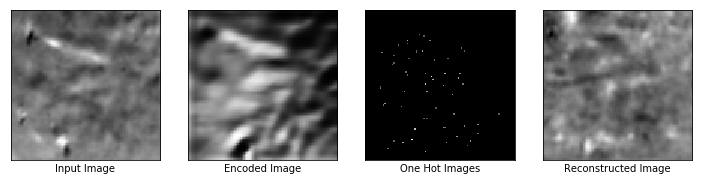

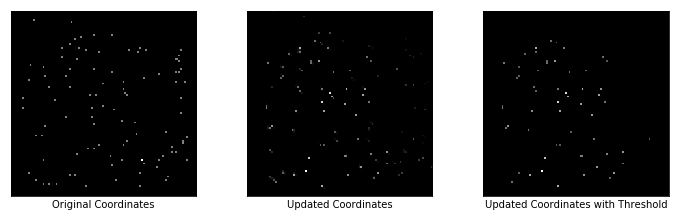

Reconstruction Loss: 0.011838235892355442
Regularizer Loss: 427788.78125, Total Loss: 427788.78125
Encoder Loss: 5.271569728851318
Max Similarity scores: 0.9271807670593262
Updated Coordinates: [[[0.52731633 0.7901732 ]]]



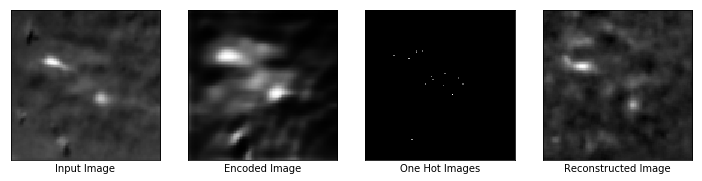

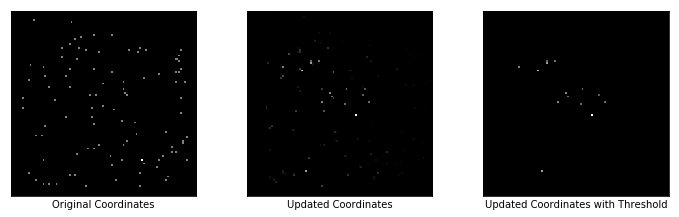

Reconstruction Loss: 0.00977733638137579
Regularizer Loss: 431217.65625, Total Loss: 431217.65625
Encoder Loss: 4.125435829162598
Max Similarity scores: 0.8933874368667603
Updated Coordinates: [[[0.52733845 0.79013354]]]



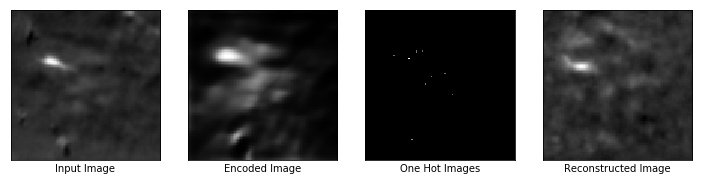

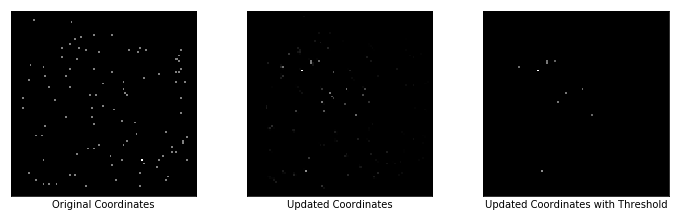

Reconstruction Loss: 0.0071304067969322205
Regularizer Loss: 435742.5625, Total Loss: 435742.5625
Encoder Loss: 2.9731709957122803
Max Similarity scores: 0.8189249634742737
Updated Coordinates: [[[0.527361  0.7900951]]]



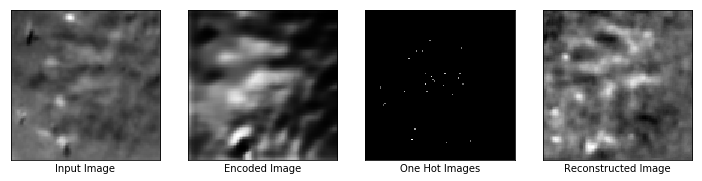

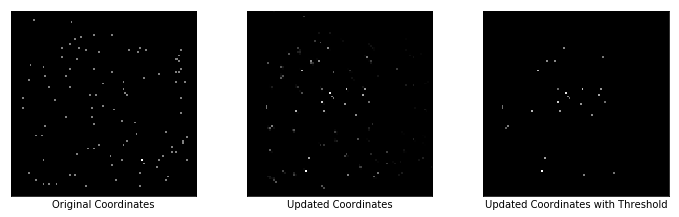

Reconstruction Loss: 0.009118790738284588
Regularizer Loss: 431665.5625, Total Loss: 431665.5625
Encoder Loss: 4.304107189178467
Max Similarity scores: 0.8528399467468262
Updated Coordinates: [[[0.52738583 0.79005325]]]



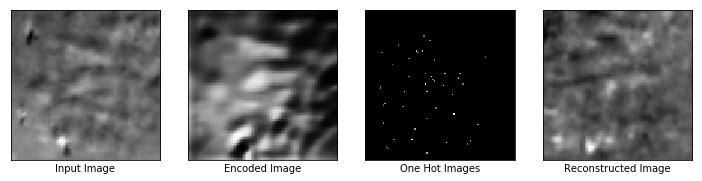

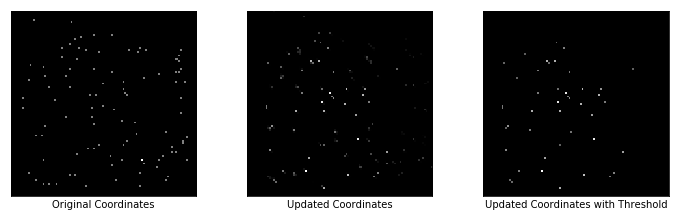

Reconstruction Loss: 0.009633862413465977
Regularizer Loss: 428070.1875, Total Loss: 428070.1875
Encoder Loss: 5.113100051879883
Max Similarity scores: 0.9128366112709045
Updated Coordinates: [[[0.5274089  0.79001045]]]



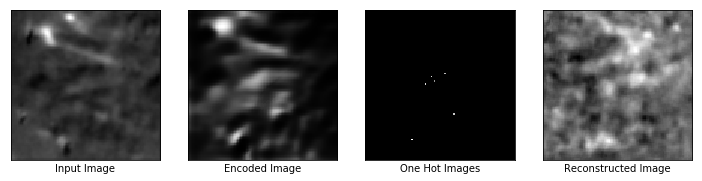

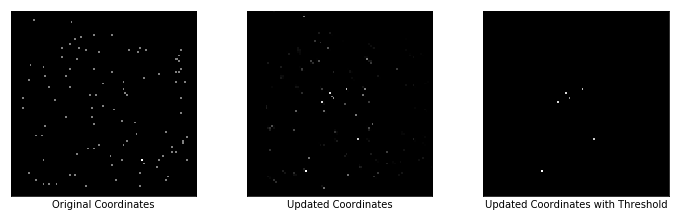

Reconstruction Loss: 0.008810564875602722
Regularizer Loss: 439026.1875, Total Loss: 439026.1875
Encoder Loss: 2.853032112121582
Max Similarity scores: 0.6497514843940735
Updated Coordinates: [[[0.52743655 0.78996825]]]



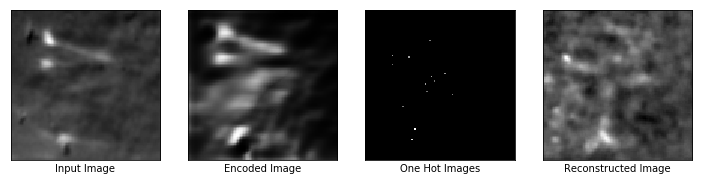

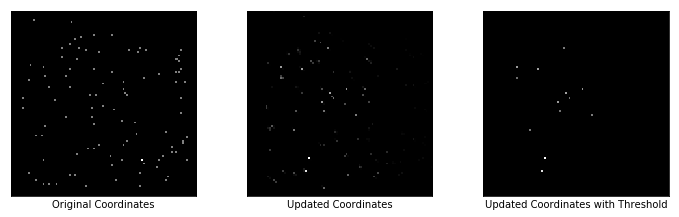

Reconstruction Loss: 0.00718763517215848
Regularizer Loss: 435296.34375, Total Loss: 435296.34375
Encoder Loss: 2.9118294715881348
Max Similarity scores: 0.7956513166427612
Updated Coordinates: [[[0.5274597 0.7899267]]]



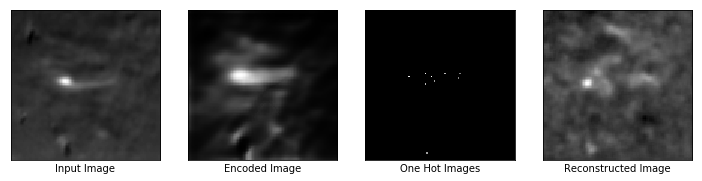

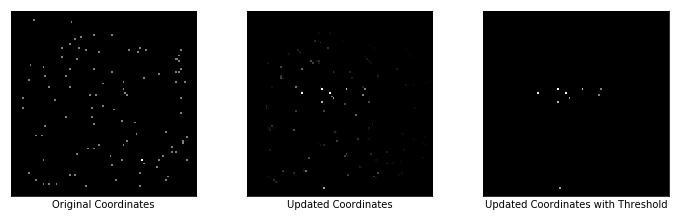

Reconstruction Loss: 0.005647888872772455
Regularizer Loss: 436718.84375, Total Loss: 436718.84375
Encoder Loss: 2.5391502380371094
Max Similarity scores: 0.7307391166687012
Updated Coordinates: [[[0.52748394 0.7898848 ]]]



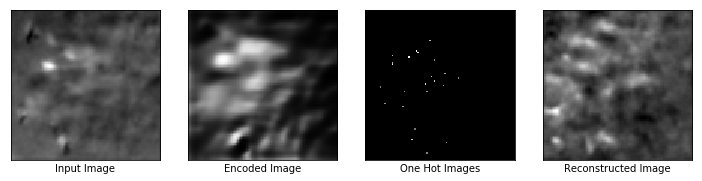

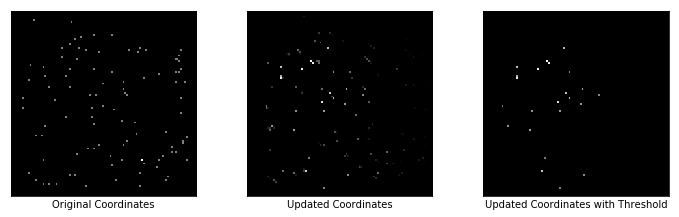

Reconstruction Loss: 0.008795838803052902
Regularizer Loss: 431580.375, Total Loss: 431580.375
Encoder Loss: 4.374311923980713
Max Similarity scores: 0.7636473178863525
Updated Coordinates: [[[0.52751327 0.7898427 ]]]



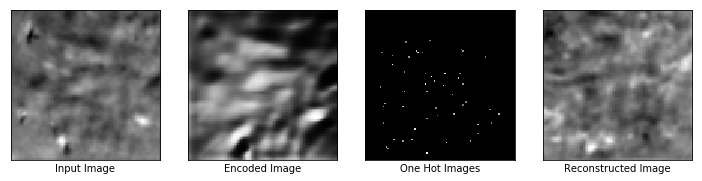

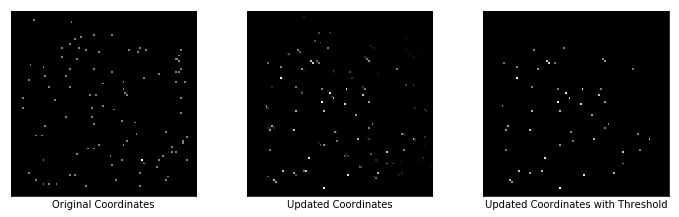

Reconstruction Loss: 0.012330599129199982
Regularizer Loss: 429449.90625, Total Loss: 429449.90625
Encoder Loss: 4.306044101715088
Max Similarity scores: 0.91401207447052
Updated Coordinates: [[[0.52754587 0.7898025 ]]]



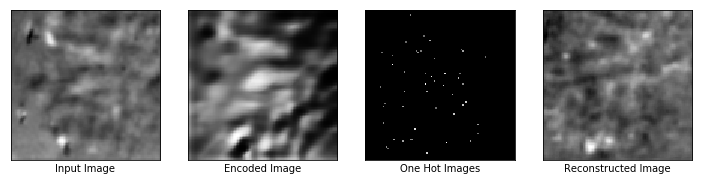

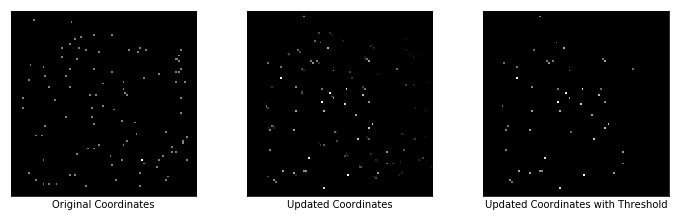

Reconstruction Loss: 0.009097067639231682
Regularizer Loss: 428907.8125, Total Loss: 428907.8125
Encoder Loss: 4.989884853363037
Max Similarity scores: 0.9117969274520874
Updated Coordinates: [[[0.52757597 0.7897708 ]]]



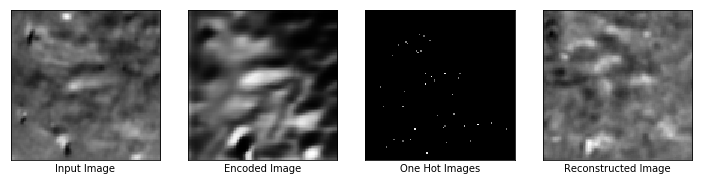

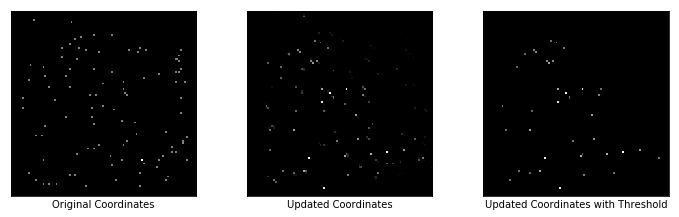

Reconstruction Loss: 0.010348649695515633
Regularizer Loss: 427962.125, Total Loss: 427962.125
Encoder Loss: 5.434032440185547
Max Similarity scores: 0.9129624962806702
Updated Coordinates: [[[0.5276058  0.78974116]]]



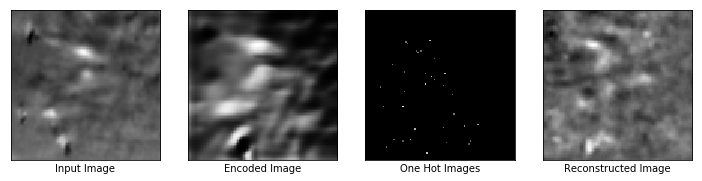

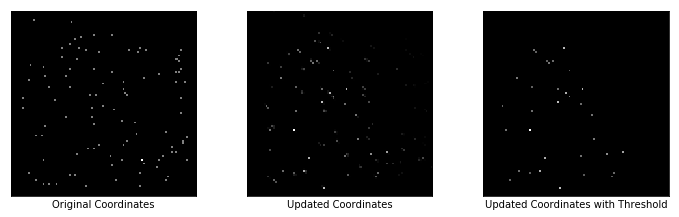

Reconstruction Loss: 0.00939314253628254
Regularizer Loss: 429577.875, Total Loss: 429577.875
Encoder Loss: 4.507824420928955
Max Similarity scores: 0.8767083287239075
Updated Coordinates: [[[0.5276324  0.78971094]]]



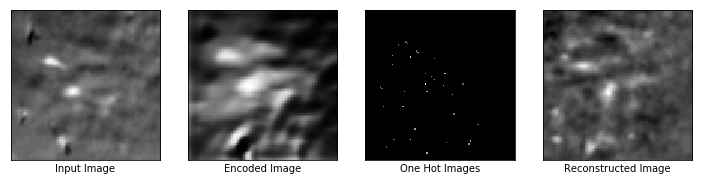

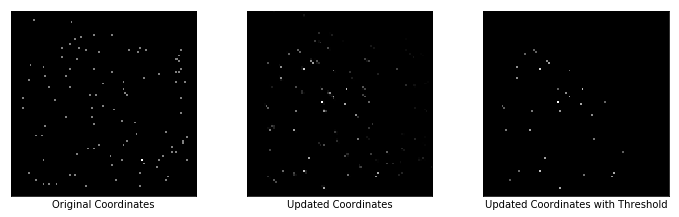

Reconstruction Loss: 0.009423736482858658
Regularizer Loss: 427180.84375, Total Loss: 427180.84375
Encoder Loss: 5.125365734100342
Max Similarity scores: 0.9392115473747253
Updated Coordinates: [[[0.5276636 0.789679 ]]]



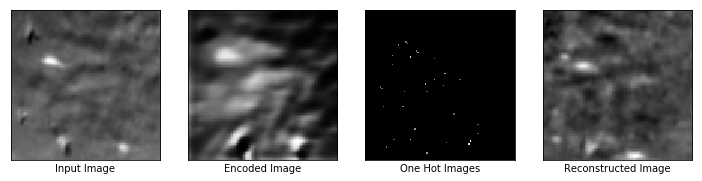

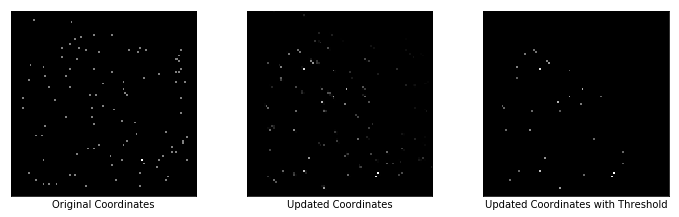

Reconstruction Loss: 0.008381921797990799
Regularizer Loss: 427842.46875, Total Loss: 427842.46875
Encoder Loss: 5.028720855712891
Max Similarity scores: 0.8884967565536499
Updated Coordinates: [[[0.5276823 0.7896518]]]



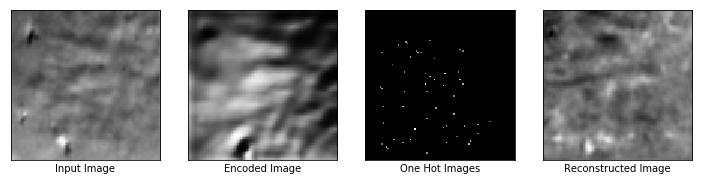

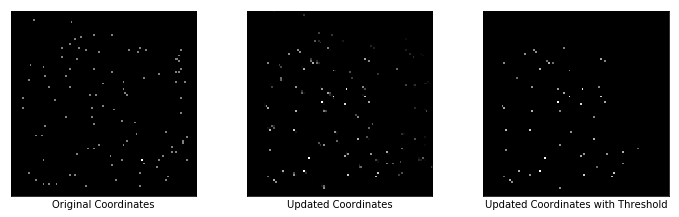

Reconstruction Loss: 0.008075307123363018
Regularizer Loss: 428498.0625, Total Loss: 428498.0625
Encoder Loss: 5.580599784851074
Max Similarity scores: 0.9154869318008423
Updated Coordinates: [[[0.52769864 0.7896248 ]]]



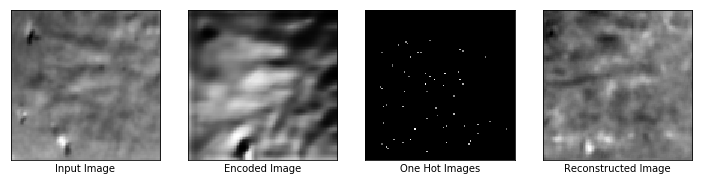

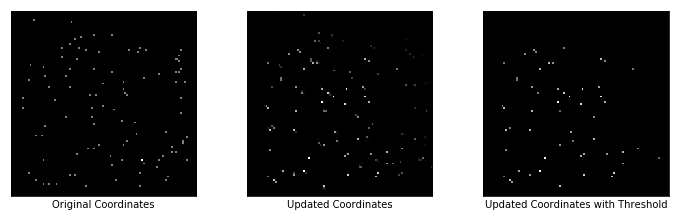

Reconstruction Loss: 0.007440570276230574
Regularizer Loss: 428460.75, Total Loss: 428460.75
Encoder Loss: 4.967502117156982
Max Similarity scores: 0.9155430197715759
Updated Coordinates: [[[0.52771413 0.7895992 ]]]



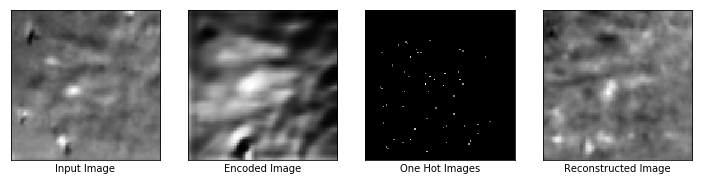

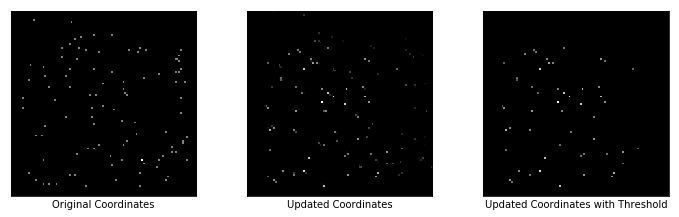

Reconstruction Loss: 0.006768558640033007
Regularizer Loss: 427193.84375, Total Loss: 427193.84375
Encoder Loss: 4.359765529632568
Max Similarity scores: 0.9381147623062134
Updated Coordinates: [[[0.5277212  0.78957754]]]



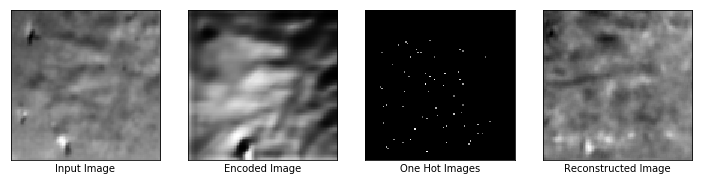

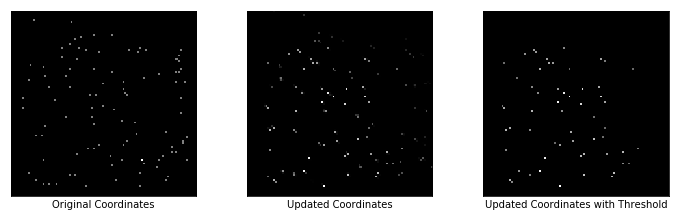

Reconstruction Loss: 0.007865207269787788
Regularizer Loss: 427121.65625, Total Loss: 427121.65625
Encoder Loss: 5.712835788726807
Max Similarity scores: 0.9034489393234253
Updated Coordinates: [[[0.52771467 0.78956044]]]



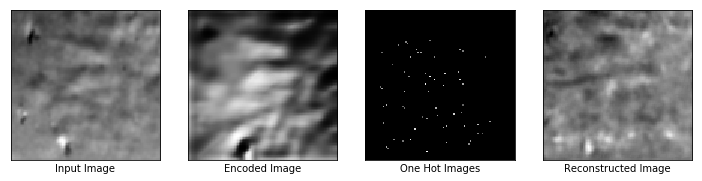

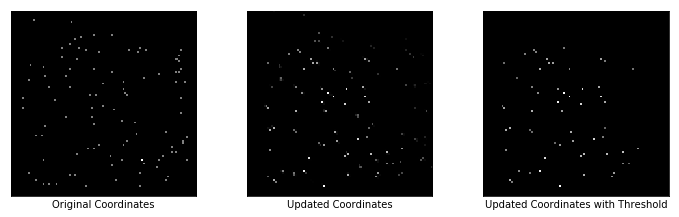

Reconstruction Loss: 0.007716407999396324
Regularizer Loss: 423792.0625, Total Loss: 423792.0625
Encoder Loss: 5.3186163902282715
Max Similarity scores: 0.9047947525978088
Updated Coordinates: [[[0.5277048 0.7895456]]]



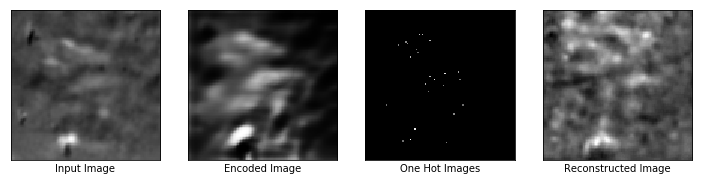

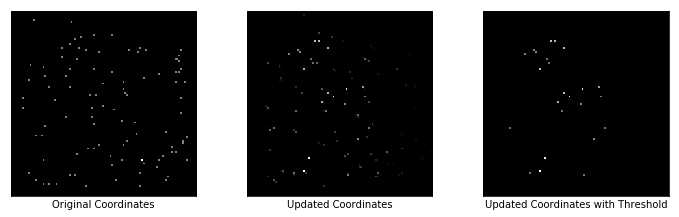

Reconstruction Loss: 0.008723952807486057
Regularizer Loss: 429698.78125, Total Loss: 429698.78125
Encoder Loss: 4.743721961975098
Max Similarity scores: 0.8901565670967102
Updated Coordinates: [[[0.52769274 0.78953385]]]



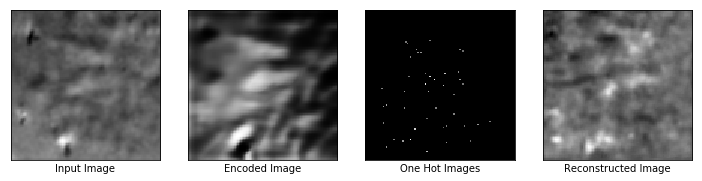

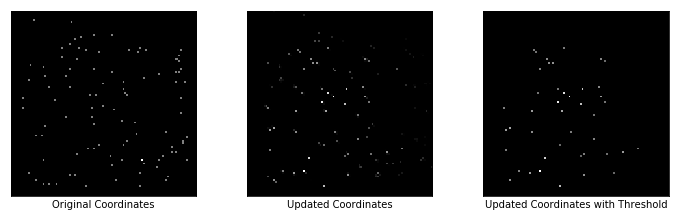

Reconstruction Loss: 0.007464933674782515
Regularizer Loss: 427779.6875, Total Loss: 427779.6875
Encoder Loss: 4.749558925628662
Max Similarity scores: 0.9145511388778687
Updated Coordinates: [[[0.5276892 0.7895213]]]



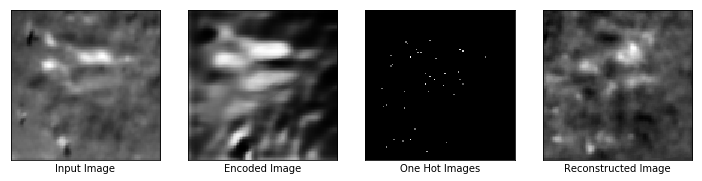

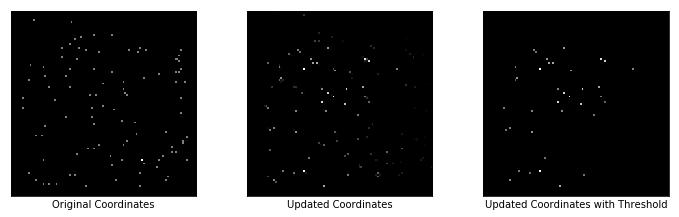

Reconstruction Loss: 0.009172308258712292
Regularizer Loss: 435168.875, Total Loss: 435168.875
Encoder Loss: 4.203437805175781
Max Similarity scores: 0.8999318480491638
Updated Coordinates: [[[0.5276991 0.7895022]]]



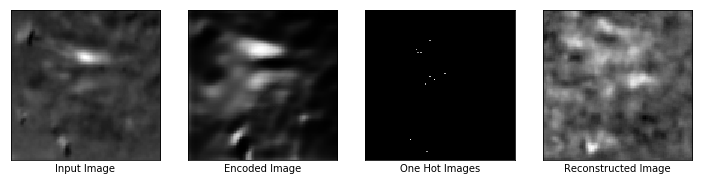

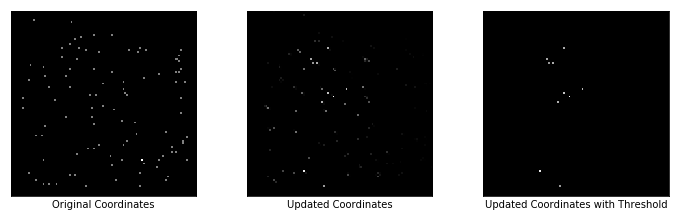

Reconstruction Loss: 0.008490130305290222
Regularizer Loss: 437956.75, Total Loss: 437956.75
Encoder Loss: 3.528895378112793
Max Similarity scores: 0.6989253163337708
Updated Coordinates: [[[0.52771515 0.7894787 ]]]



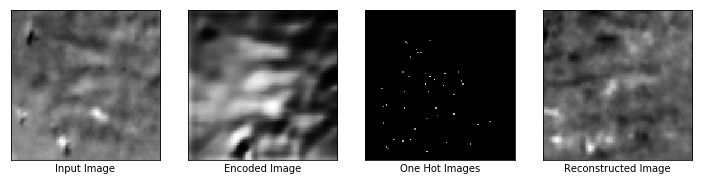

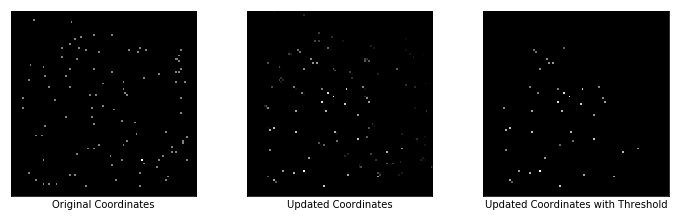

Reconstruction Loss: 0.009949607774615288
Regularizer Loss: 429955.5625, Total Loss: 429955.5625
Encoder Loss: 5.119959354400635
Max Similarity scores: 0.9081105589866638
Updated Coordinates: [[[0.5277327 0.7894551]]]



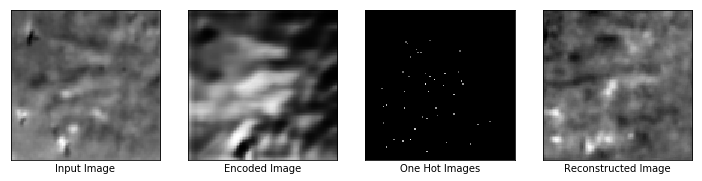

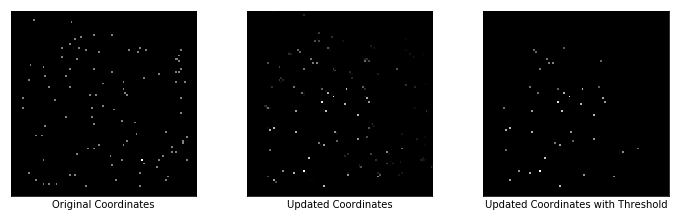

Reconstruction Loss: 0.00783317256718874
Regularizer Loss: 427023.03125, Total Loss: 427023.03125
Encoder Loss: 4.623627662658691
Max Similarity scores: 0.9395792484283447
Updated Coordinates: [[[0.5277694 0.7894229]]]



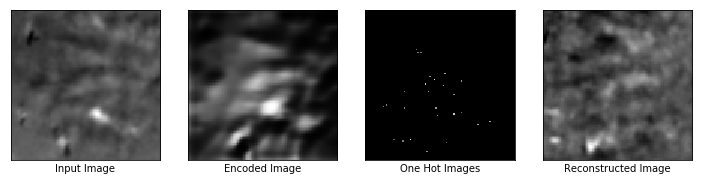

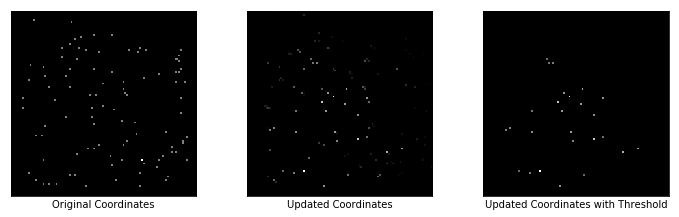

Reconstruction Loss: 0.009486847557127476
Regularizer Loss: 430449.375, Total Loss: 430449.375
Encoder Loss: 3.8417656421661377
Max Similarity scores: 0.7703182697296143
Updated Coordinates: [[[0.5278544  0.78937024]]]



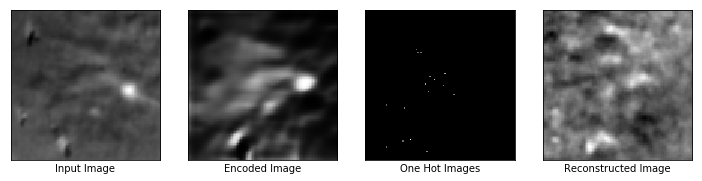

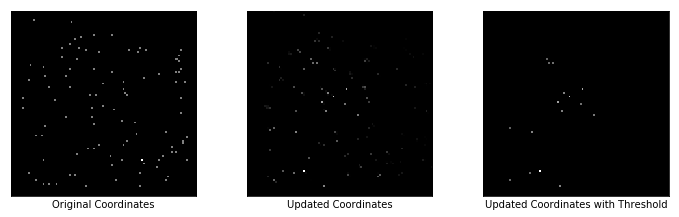

Reconstruction Loss: 0.008597414009273052
Regularizer Loss: 429628.5625, Total Loss: 429628.5625
Encoder Loss: 4.51389217376709
Max Similarity scores: 0.8243373036384583
Updated Coordinates: [[[0.5279813  0.78929895]]]



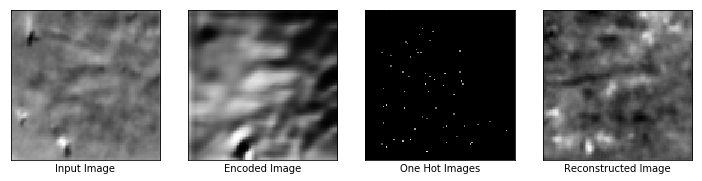

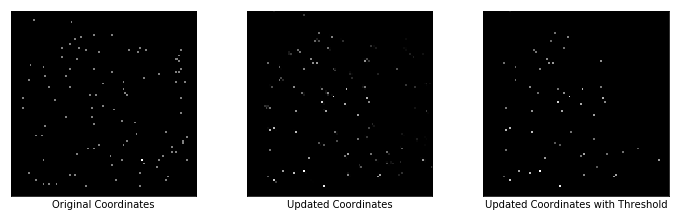

Reconstruction Loss: 0.008421913720667362
Regularizer Loss: 430191.125, Total Loss: 430191.125
Encoder Loss: 5.221529960632324
Max Similarity scores: 0.9294796586036682
Updated Coordinates: [[[0.5281285  0.78921723]]]



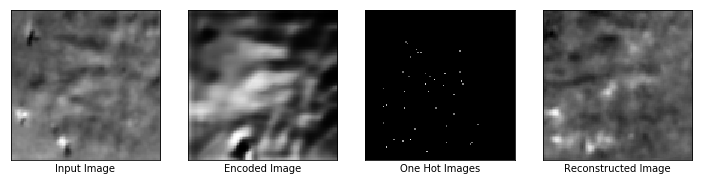

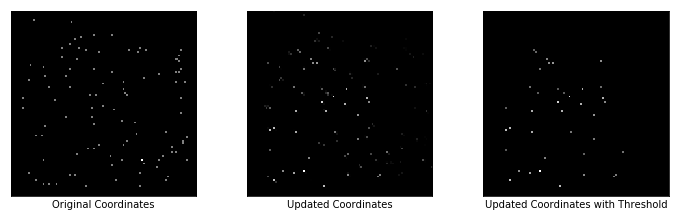

Reconstruction Loss: 0.008296978659927845
Regularizer Loss: 426933.25, Total Loss: 426933.25
Encoder Loss: 4.988195896148682
Max Similarity scores: 0.9251867532730103
Updated Coordinates: [[[0.5282957 0.7891256]]]



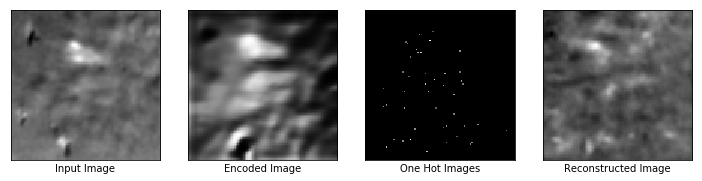

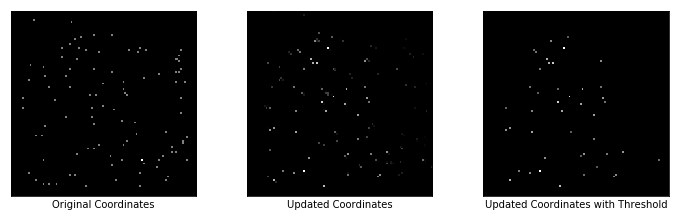

Reconstruction Loss: 0.008300776593387127
Regularizer Loss: 431463.75, Total Loss: 431463.75
Encoder Loss: 4.24798583984375
Max Similarity scores: 0.9030134081840515
Updated Coordinates: [[[0.5285055 0.7890169]]]



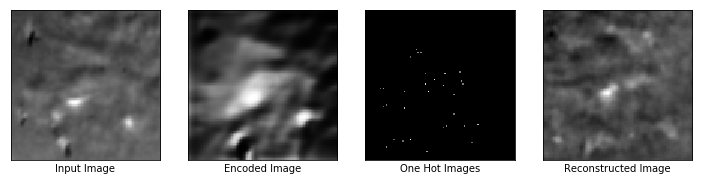

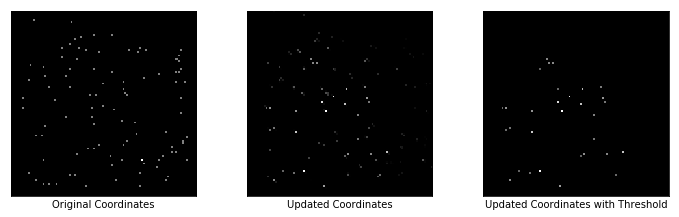

Reconstruction Loss: 0.008194288238883018
Regularizer Loss: 427648.375, Total Loss: 427648.375
Encoder Loss: 4.456656455993652
Max Similarity scores: 0.891237199306488
Updated Coordinates: [[[0.52870435 0.78894204]]]



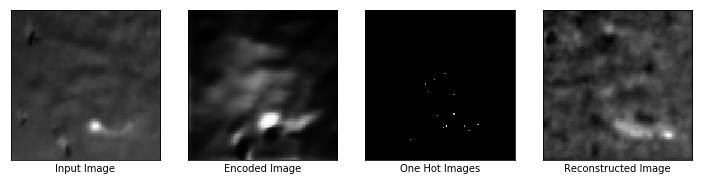

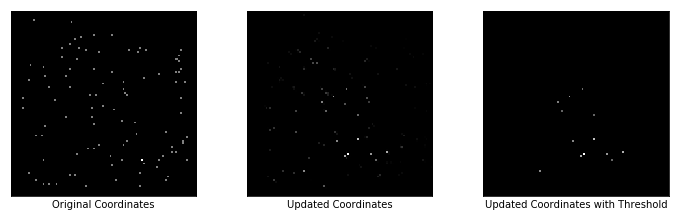

Reconstruction Loss: 0.007008123677223921
Regularizer Loss: 427341.78125, Total Loss: 427341.78125
Encoder Loss: 4.2444939613342285
Max Similarity scores: 0.8507925868034363
Updated Coordinates: [[[0.52887696 0.788796  ]]]



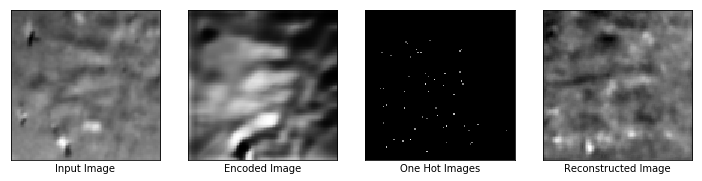

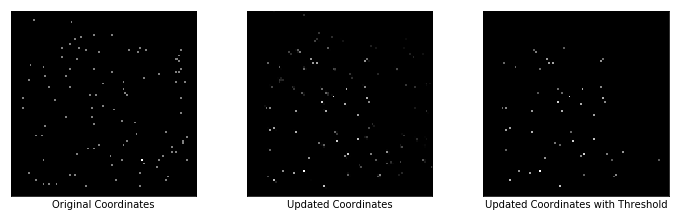

Reconstruction Loss: 0.007277894765138626
Regularizer Loss: 426874.71875, Total Loss: 426874.71875
Encoder Loss: 4.854213237762451
Max Similarity scores: 0.9240283966064453
Updated Coordinates: [[[0.5289773  0.78839314]]]



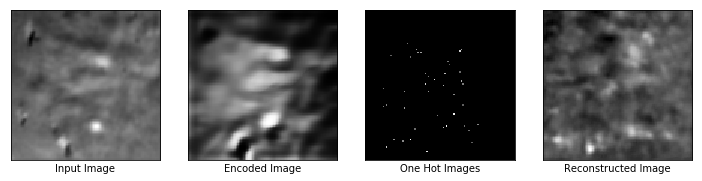

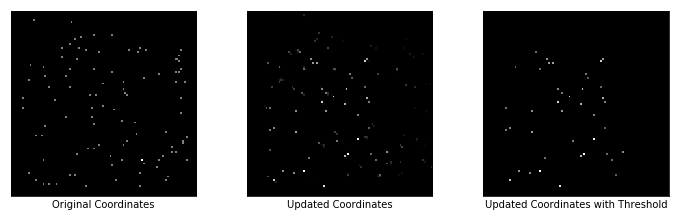

Reconstruction Loss: 0.010154199786484241
Regularizer Loss: 430526.9375, Total Loss: 430526.9375
Encoder Loss: 4.5387372970581055
Max Similarity scores: 0.8721163272857666
Updated Coordinates: [[[0.52900535 0.7876706 ]]]



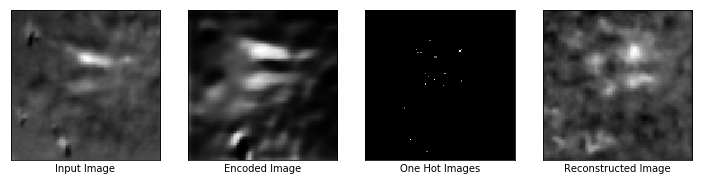

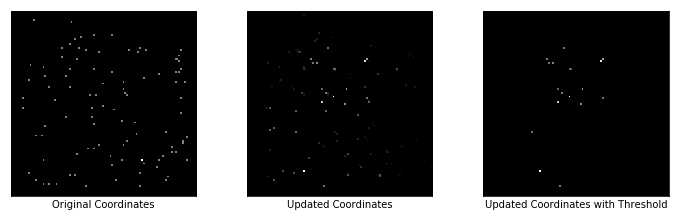

Reconstruction Loss: 0.009228448383510113
Regularizer Loss: 436136.75, Total Loss: 436136.75
Encoder Loss: 3.734971046447754
Max Similarity scores: 0.810603141784668
Updated Coordinates: [[[0.52902967 0.78685385]]]



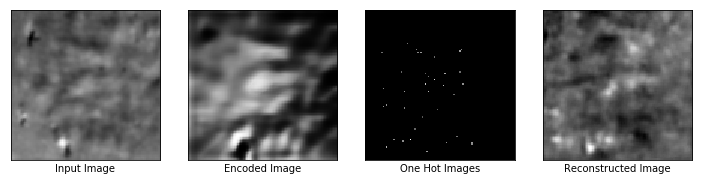

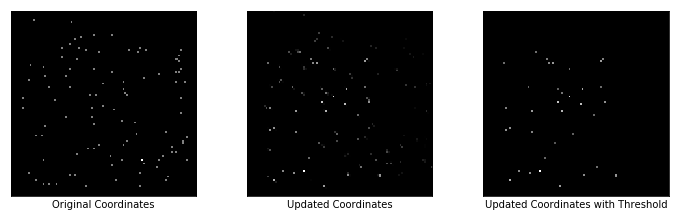

Reconstruction Loss: 0.008874621242284775
Regularizer Loss: 429896.4375, Total Loss: 429896.4375
Encoder Loss: 5.270139694213867
Max Similarity scores: 0.9035255908966064
Updated Coordinates: [[[0.5290748  0.78610814]]]



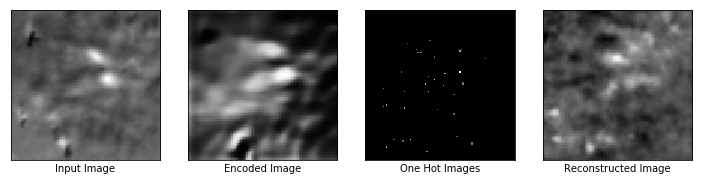

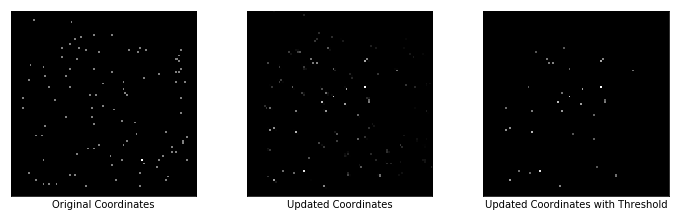

Reconstruction Loss: 0.00985744595527649
Regularizer Loss: 432401.375, Total Loss: 432401.375
Encoder Loss: 4.790005683898926
Max Similarity scores: 0.9279629588127136
Updated Coordinates: [[[0.52909726 0.7854897 ]]]



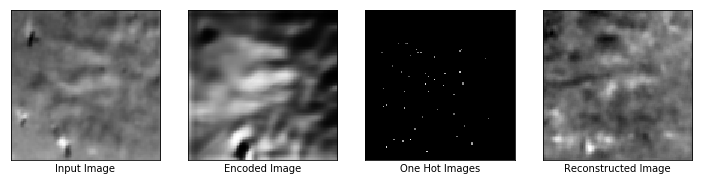

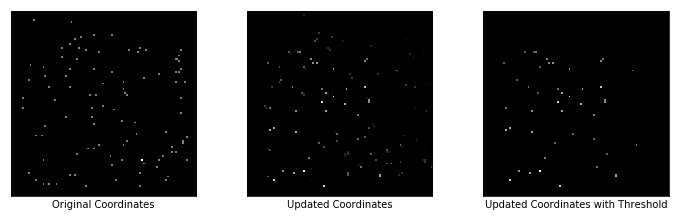

Reconstruction Loss: 0.008704215288162231
Regularizer Loss: 430266.21875, Total Loss: 430266.21875
Encoder Loss: 5.298526763916016
Max Similarity scores: 0.9240733981132507
Updated Coordinates: [[[0.5291362  0.78497046]]]



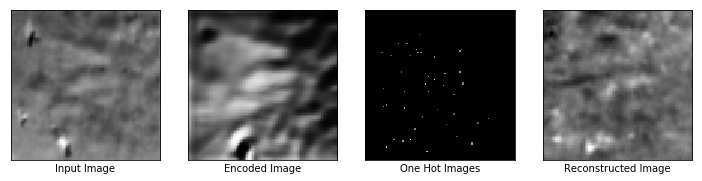

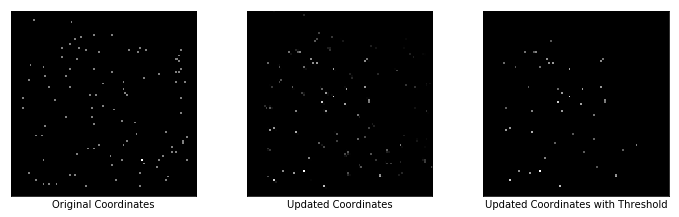

Reconstruction Loss: 0.007822180166840553
Regularizer Loss: 428004.375, Total Loss: 428004.375
Encoder Loss: 5.479363918304443
Max Similarity scores: 0.9295004606246948
Updated Coordinates: [[[0.52923006 0.7844264 ]]]



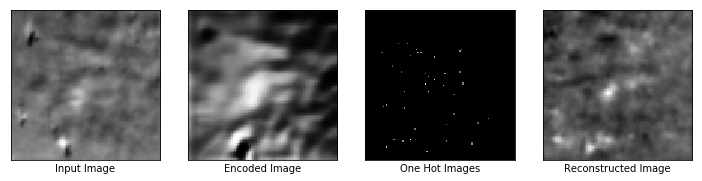

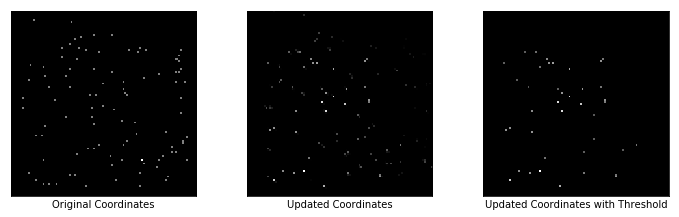

Reconstruction Loss: 0.008904615417122841
Regularizer Loss: 430223.625, Total Loss: 430223.625
Encoder Loss: 4.855688095092773
Max Similarity scores: 0.9253705739974976
Updated Coordinates: [[[0.52932054 0.7839213 ]]]



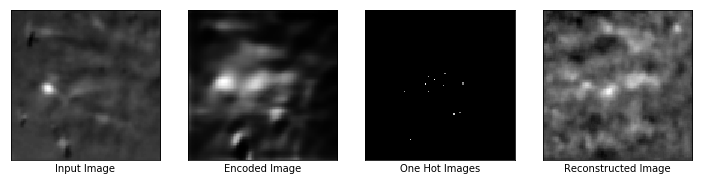

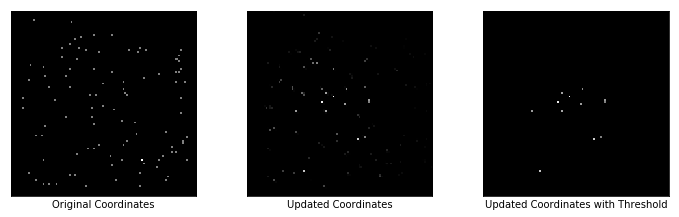

Reconstruction Loss: 0.0070801652036607265
Regularizer Loss: 434971.0, Total Loss: 434971.0
Encoder Loss: 3.304490566253662
Max Similarity scores: 0.646531343460083
Updated Coordinates: [[[0.5294233 0.7833984]]]



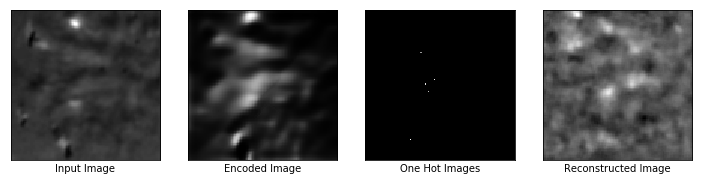

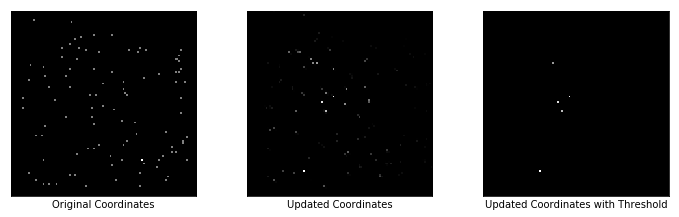

Reconstruction Loss: 0.006726157385855913
Regularizer Loss: 434425.0625, Total Loss: 434425.0625
Encoder Loss: 3.5380194187164307
Max Similarity scores: 0.55110764503479
Updated Coordinates: [[[0.52951974 0.7828991 ]]]



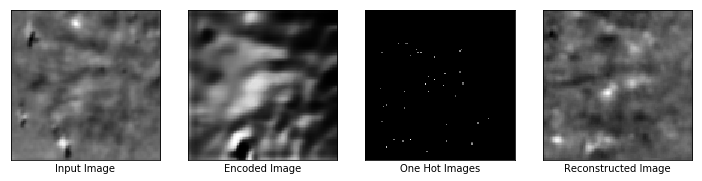

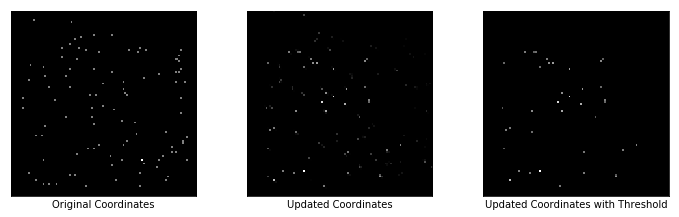

Reconstruction Loss: 0.009155030362308025
Regularizer Loss: 430317.6875, Total Loss: 430317.6875
Encoder Loss: 5.183760166168213
Max Similarity scores: 0.9013312458992004
Updated Coordinates: [[[0.5295816 0.7824536]]]



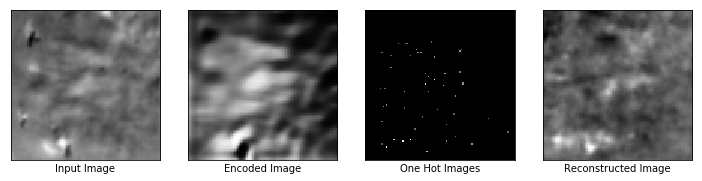

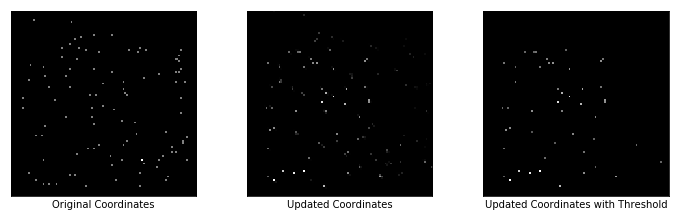

Reconstruction Loss: 0.009935940615832806
Regularizer Loss: 432570.5625, Total Loss: 432570.5625
Encoder Loss: 4.444809436798096
Max Similarity scores: 0.9414436221122742
Updated Coordinates: [[[0.5296528 0.782041 ]]]



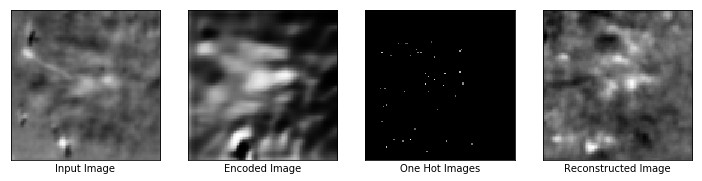

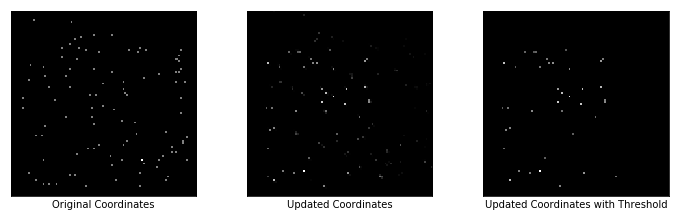

Reconstruction Loss: 0.008308560587465763
Regularizer Loss: 432319.46875, Total Loss: 432319.46875
Encoder Loss: 4.522737503051758
Max Similarity scores: 0.9085894227027893
Updated Coordinates: [[[0.5297527 0.7816533]]]



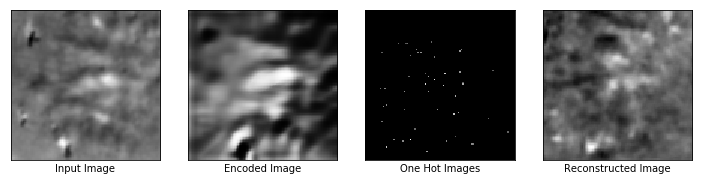

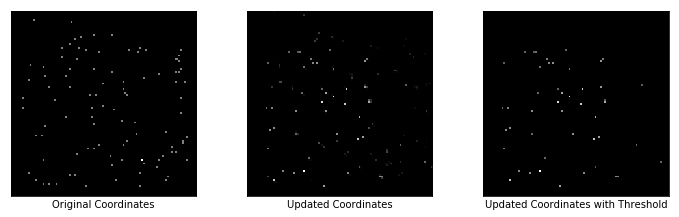

Reconstruction Loss: 0.00937611423432827
Regularizer Loss: 430095.6875, Total Loss: 430095.6875
Encoder Loss: 5.354659557342529
Max Similarity scores: 0.9158161282539368
Updated Coordinates: [[[0.5298772 0.7812869]]]



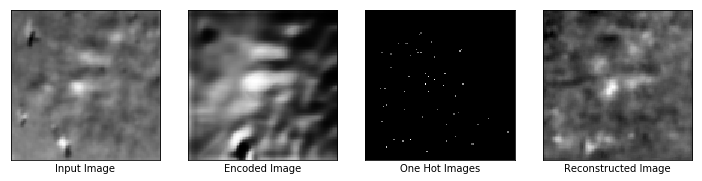

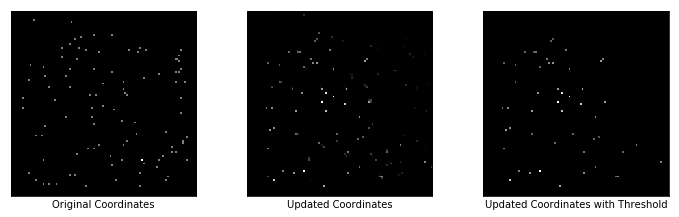

Reconstruction Loss: 0.008745033293962479
Regularizer Loss: 432769.375, Total Loss: 432769.375
Encoder Loss: 5.060914039611816
Max Similarity scores: 0.9508988857269287
Updated Coordinates: [[[0.53001815 0.7809442 ]]]



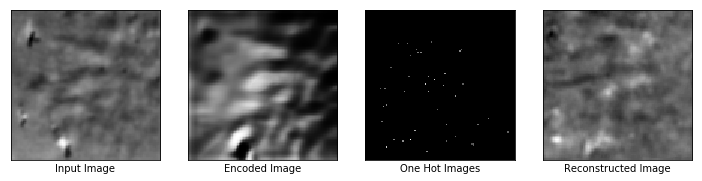

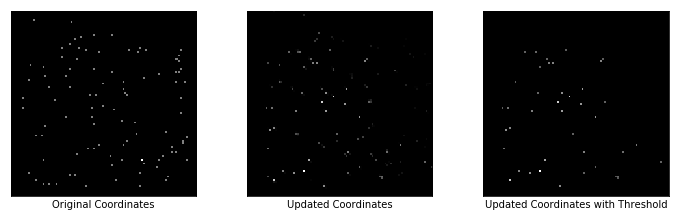

Reconstruction Loss: 0.0077678132802248
Regularizer Loss: 429379.71875, Total Loss: 429379.71875
Encoder Loss: 4.960808753967285
Max Similarity scores: 0.9356276392936707
Updated Coordinates: [[[0.5301634 0.7806227]]]



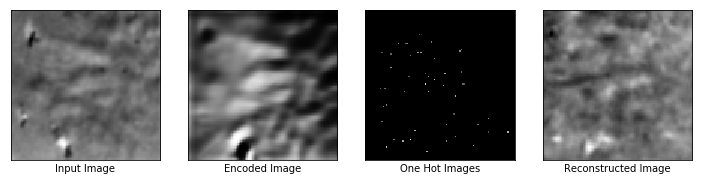

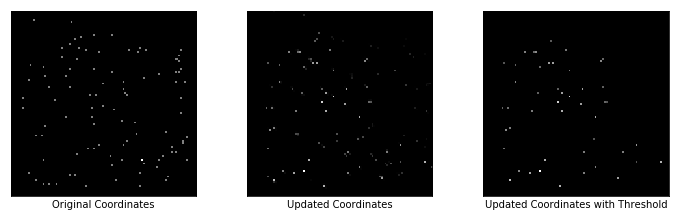

Reconstruction Loss: 0.007775531150400639
Regularizer Loss: 428657.34375, Total Loss: 428657.34375
Encoder Loss: 5.164795398712158
Max Similarity scores: 0.9416925311088562
Updated Coordinates: [[[0.5303034 0.780327 ]]]



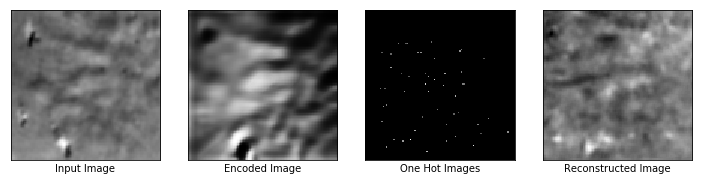

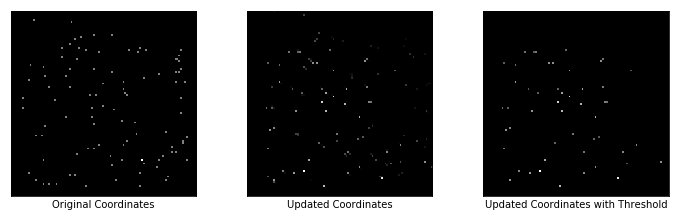

Reconstruction Loss: 0.0073877121321856976
Regularizer Loss: 428181.3125, Total Loss: 428181.3125
Encoder Loss: 5.352888107299805
Max Similarity scores: 0.9281216859817505
Updated Coordinates: [[[0.53043556 0.7800199 ]]]



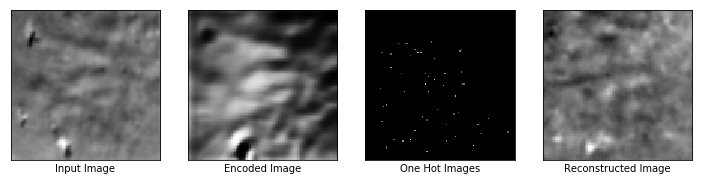

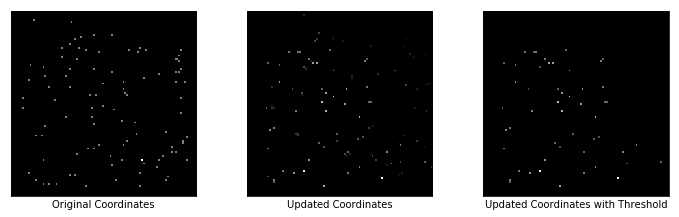

Reconstruction Loss: 0.007387681398540735
Regularizer Loss: 428400.1875, Total Loss: 428400.1875
Encoder Loss: 5.393761157989502
Max Similarity scores: 0.9325901865959167
Updated Coordinates: [[[0.5305729  0.77969736]]]



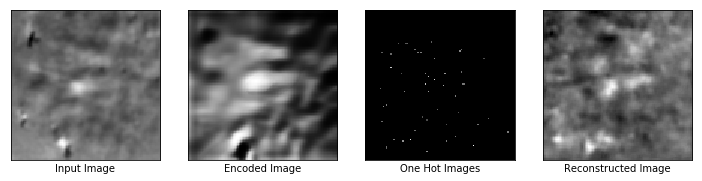

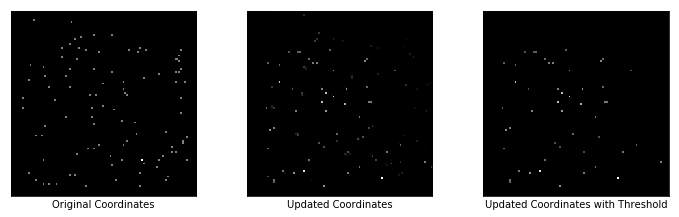

Reconstruction Loss: 0.007834690622985363
Regularizer Loss: 430201.65625, Total Loss: 430201.65625
Encoder Loss: 5.174710273742676
Max Similarity scores: 0.9404576420783997
Updated Coordinates: [[[0.53072655 0.77933466]]]



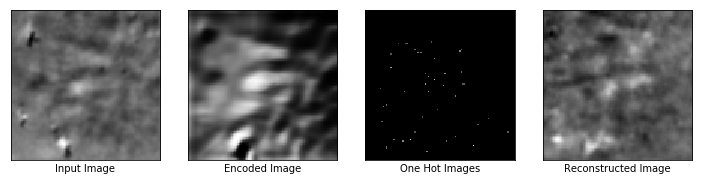

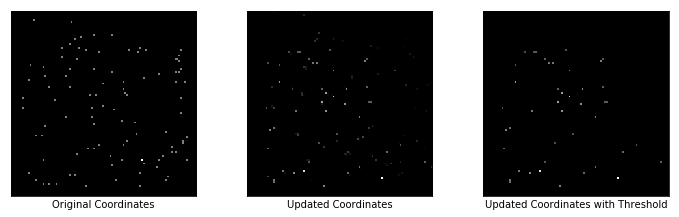

Reconstruction Loss: 0.007610354572534561
Regularizer Loss: 429943.1875, Total Loss: 429943.1875
Encoder Loss: 5.138147830963135
Max Similarity scores: 0.9235225915908813
Updated Coordinates: [[[0.530908  0.7789498]]]



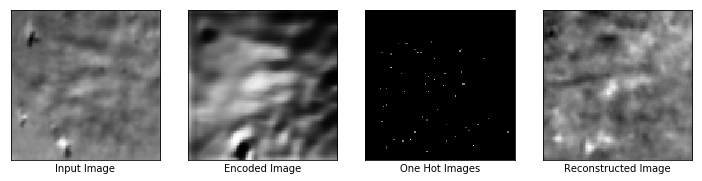

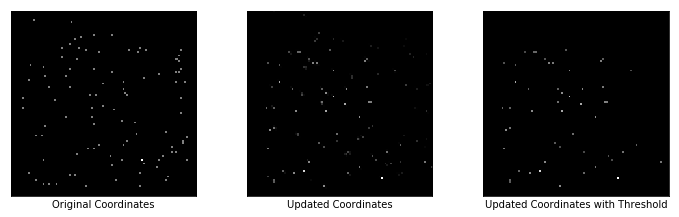

Reconstruction Loss: 0.007564611732959747
Regularizer Loss: 430721.875, Total Loss: 430721.875
Encoder Loss: 5.3814215660095215
Max Similarity scores: 0.9172132015228271
Updated Coordinates: [[[0.53117746 0.7785425 ]]]



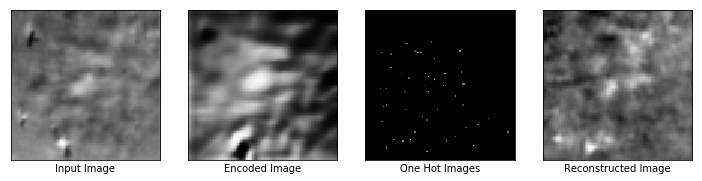

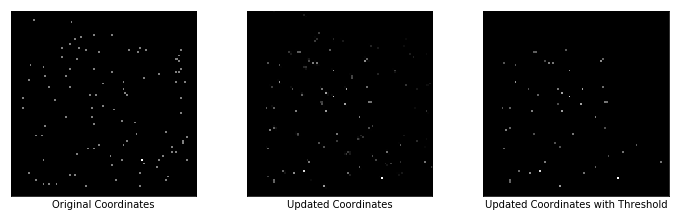

Reconstruction Loss: 0.007645988371223211
Regularizer Loss: 432801.5, Total Loss: 432801.5
Encoder Loss: 4.1821465492248535
Max Similarity scores: 0.9175121784210205
Updated Coordinates: [[[0.53149235 0.77812475]]]



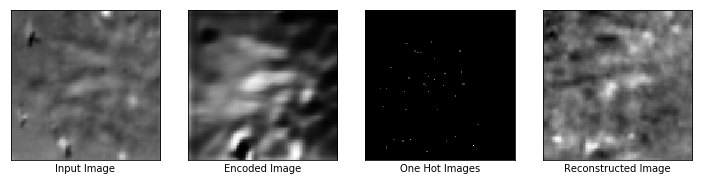

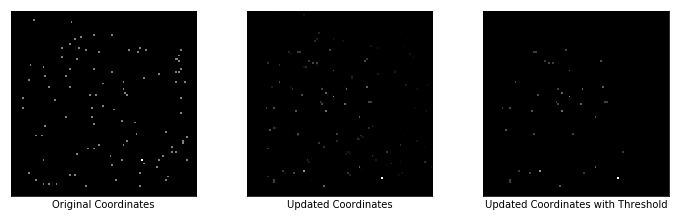

Reconstruction Loss: 0.007528414949774742
Regularizer Loss: 431635.28125, Total Loss: 431635.28125
Encoder Loss: 4.484818935394287
Max Similarity scores: 0.8311907649040222
Updated Coordinates: [[[0.5318509 0.7777096]]]



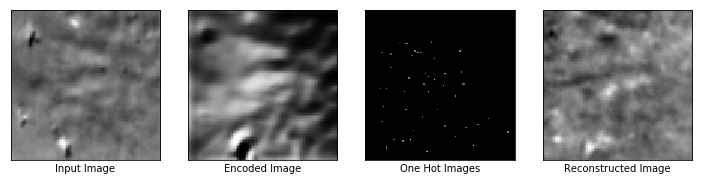

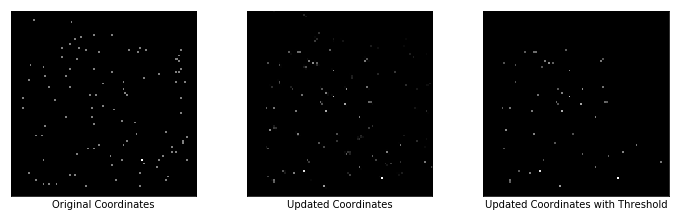

Reconstruction Loss: 0.007659631315618753
Regularizer Loss: 429357.0, Total Loss: 429357.0
Encoder Loss: 5.361525535583496
Max Similarity scores: 0.9129865169525146
Updated Coordinates: [[[0.53222084 0.77732533]]]



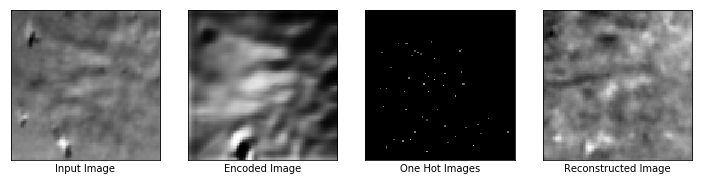

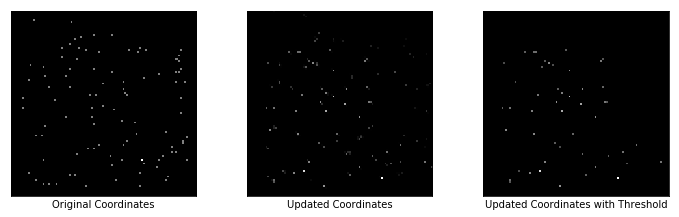

Reconstruction Loss: 0.007369362749159336
Regularizer Loss: 429485.8125, Total Loss: 429485.8125
Encoder Loss: 5.286208629608154
Max Similarity scores: 0.9113317131996155
Updated Coordinates: [[[0.53256696 0.7769655 ]]]



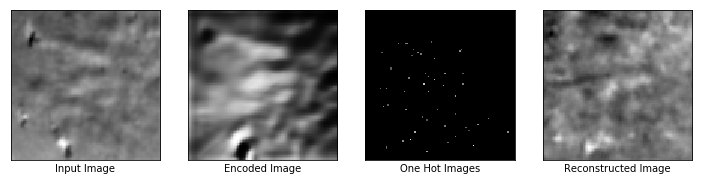

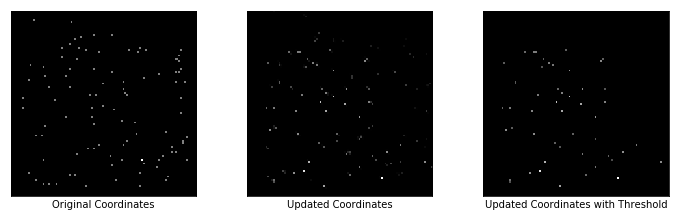

Reconstruction Loss: 0.0068044462241232395
Regularizer Loss: 429875.3125, Total Loss: 429875.3125
Encoder Loss: 4.949696063995361
Max Similarity scores: 0.9214809536933899
Updated Coordinates: [[[0.5328793 0.776639 ]]]



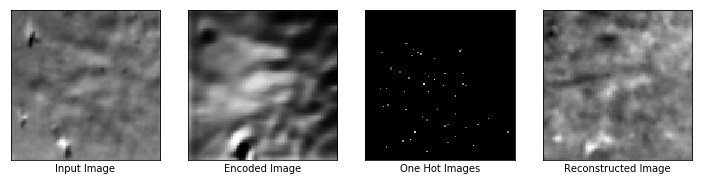

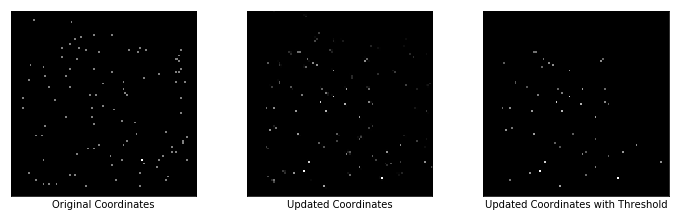

Reconstruction Loss: 0.00697632459923625
Regularizer Loss: 429221.125, Total Loss: 429221.125
Encoder Loss: 5.461783409118652
Max Similarity scores: 0.9274439215660095
Updated Coordinates: [[[0.53316057 0.77634174]]]



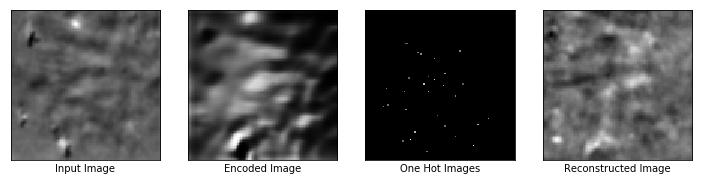

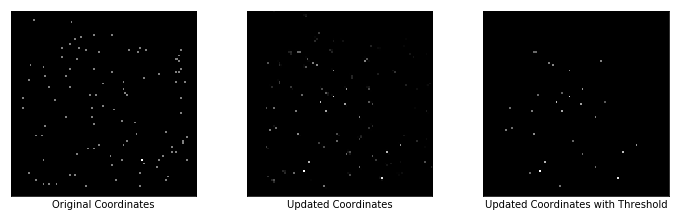

Reconstruction Loss: 0.007300283759832382
Regularizer Loss: 429089.03125, Total Loss: 429089.03125
Encoder Loss: 4.86922550201416
Max Similarity scores: 0.875704288482666
Updated Coordinates: [[[0.5334162  0.77606994]]]



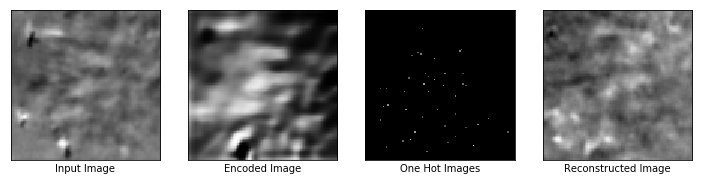

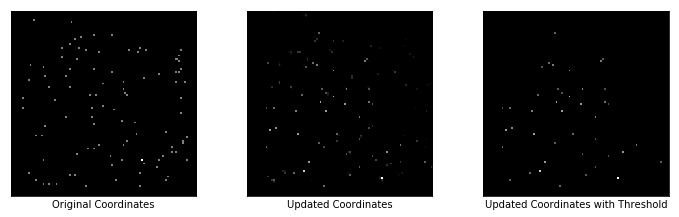

Reconstruction Loss: 0.008601397275924683
Regularizer Loss: 431461.28125, Total Loss: 431461.28125
Encoder Loss: 5.162098407745361
Max Similarity scores: 0.8882595300674438
Updated Coordinates: [[[0.53363687 0.7758255 ]]]



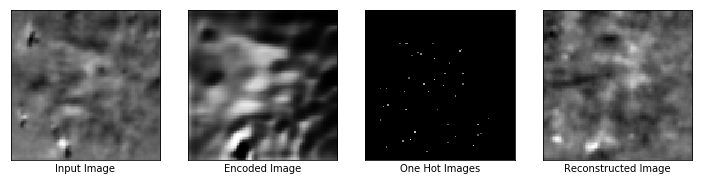

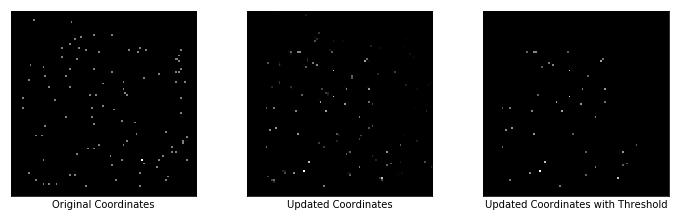

Reconstruction Loss: 0.009289976209402084
Regularizer Loss: 428625.46875, Total Loss: 428625.46875
Encoder Loss: 4.874054908752441
Max Similarity scores: 0.9163585305213928
Updated Coordinates: [[[0.5338359 0.7756001]]]


In [18]:
#list to be append to output 
loss_list_global = []
loss_list_encoded_one_hot = []
regulariser_loss_list = []
input_imgs = []
coords_list = []
encoded_imgs = []
reconstructed_imgs = []
one_hot_imgs_list = []
similarity_list = []

captions_01 = ['Input Image', 'Encoded Image', 'One Hot Images','Reconstructed Image']
captions_02 = ['Original Coordinates', 'Updated Coordinates', 'Updated Coordinates with Threshold']

#list to append to monitor each frames for the last epochs 
one_hot_imgs_last_list = []
encoder_output_last_list = []
similarity_score_last_list = []
reconstruction_last_list = []

val_data_path = "/home/kevinteng/Desktop/validation/DG13_7-16-17_preprocessed_dF.npy"
val_data = np.load(val_data_path)
re_list = utils.resize(val_data, NEW_SIZE)
re_list = utils.min_max_norm(re_list)
#add channel 
re_list = np.expand_dims(re_list, axis = -1)
re_list = tf.convert_to_tensor(re_list, dtype = tf.float32)
batch_imgs= tf.data.Dataset.from_tensor_slices(re_list).batch(BATCH_SIZE, drop_remainder=True)

for steps, batched_imgs in enumerate(batch_imgs):
    loss, updated_coords, one_hot_imgs, encoder_output, similarity_score, reconstruction = val_fn(batched_imgs, 
                                                                                                  IMG_SIZE, BATCH_SIZE, 
                                                                                                  neuron_multi = False, one_hot_thr = False)
    if steps%1==0:
        rand = randint(0, BATCH_SIZE-1) #random number to generate for plotting outputs 
        img_row01 = [batched_imgs[rand], encoder_output[rand], similarity_multi(one_hot_imgs, similarity_score, thr=thr)[rand], reconstruction[rand]]
        img_row02 = [stack4plot(ori_one_hot_imgs), similarity_multi(one_hot_imgs, similarity_score)[rand], similarity_multi(one_hot_imgs, similarity_score, thr=thr)[rand]]
        plot_comparison(img_row01, captions_01, n_col=len(img_row01), figsize = (10, 10))
        plot_comparison(img_row02, captions_02, n_col=len(img_row02), figsize = (10, 10))
        #print for each session in the epochs 
        #note for loss indices
        #loss = [global_loss, encoded_dummy, regularizer_loss, total_loss]
        print("Reconstruction Loss: {}".format(loss[0].numpy()))
        print("Regularizer Loss: {}, Total Loss: {}".format(loss[2].numpy(), loss[-1].numpy()))
        print("Encoder Loss: {}".format(loss[1].numpy()))
        print("Max Similarity scores: {}".format(np.max(similarity_score[rand])))
        print("Updated Coordinates: {}".format(updated_coords[0]))
        #append to list 
        encoded_imgs.append(encoder_output)
        input_imgs.append(batched_imgs)
        coords_list.append(updated_coords)
        reconstructed_imgs.append(reconstruction)
        one_hot_imgs_list.append(one_hot_imgs)
        similarity_list.append(similarity_score)
    one_hot_imgs_last_list.append(one_hot_imgs)
    #encoder_output_last_sess.append(encoder_output)
    similarity_score_last_list.append(similarity_score)
    #reconstruction_last_sess.append(reconstruction)

In [19]:
similarity_score_last_list = utils.concat_batch(similarity_score_last_list)

In [20]:
similarity_score_last_list_npy = np.array(similarity_score_last_list)
one_hot_imgs_last_list_npy = np.array(tf.convert_to_tensor(one_hot_imgs_last_list))

## Model Output

True Positives:  0.2940740740740741
False Positives:  0.705925925925926
False Negatives:  0.25479768786127166
True Negatives:  0.7452023121387283
TP_total:  397
FP_total:  953
FN_total:  2204
F1 score:  0.37972681961303595


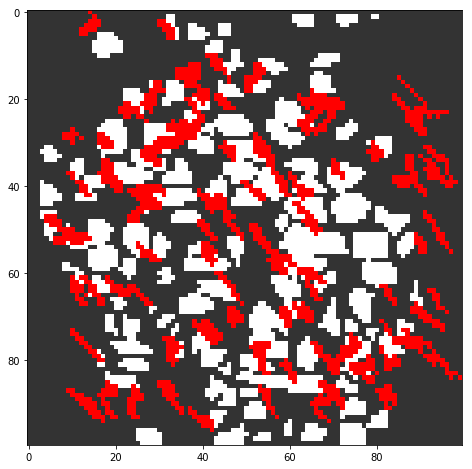

In [21]:
#define color
col = [(0.2, 0.2, 0.2),(1,1,1),(1,0,0)] 
cm = LinearSegmentedColormap.from_list('mylist', col, 3)  
#     #Bins for cmap
bounds=[0,1,5,10]
norm = BoundaryNorm(bounds, cm.N)

roi_img = np.load("/home/kevinteng/Desktop/validation/DG-13-7-16-17_ROImask.npy")
roi_img = cv2.resize(roi_img, (IMG_SIZE, IMG_SIZE))
tensor = multi_similarity_frame(one_hot_imgs_last_list_npy, similarity_score_last_list_npy, IMG_SIZE, BATCH_SIZE)
plt.figure(figsize=(8,8))
tensor_sum02 = np.where(np.sum(tensor, axis=0)<0.8, 0, 1.0)
roi_frame = overlapMasks02(roi_img, tensor_sum02)
plt.imshow(roi_frame, cmap = cm , norm = norm)
confMatrix = utils_model.getConfusionMatrix(roi_img, tensor_sum02)
print("True Positives: ", confMatrix[0])
print("False Positives: ", confMatrix[1])
print("False Negatives: ", confMatrix[2])
print("True Negatives: ", confMatrix[3])
print("TP_total: ", confMatrix[4])
print("FP_total: ", confMatrix[5])
print("FN_total: ", confMatrix[6])
print("F1 score: ", utils_model.f1score(confMatrix))
plt.show()

## Random Coordinates

True Positives:  0.2727272727272727
False Positives:  0.7272727272727273
False Negatives:  0.25997374002625995
True Negatives:  0.74002625997374
TP_total:  27
FP_total:  72
FN_total:  2574
F1 score:  0.3558779833221508


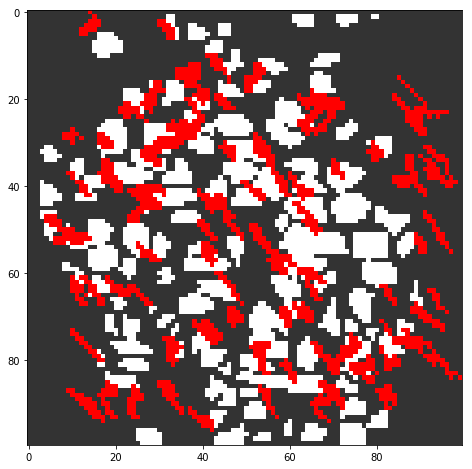

In [23]:
ori_onehot_imgs = stack4plot(ori_one_hot_imgs_npy)

plt.figure(figsize=(8,8))
roi_frame = overlapMasks02(roi_img, tensor_sum02)
plt.imshow(roi_frame, cmap = cm , norm = norm)
confMatrix = utils_model.getConfusionMatrix(roi_img, ori_onehot_imgs)
print("True Positives: ", confMatrix[0])
print("False Positives: ", confMatrix[1])
print("False Negatives: ", confMatrix[2])
print("True Negatives: ", confMatrix[3])
print("TP_total: ", confMatrix[4])
print("FP_total: ", confMatrix[5])
print("FN_total: ", confMatrix[6])
print("F1 score: ", utils_model.f1score(confMatrix))
plt.show()